# Background

- Now have: chiller installed, Zaber fixed but arm removed and needs remounting.
- Want: set up Zaber arm and collect a new, complete set of pole-to-pole measurements.
- Different measurements enumerated in shared Google doc.

In [1007]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [1125]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import lmfit as lm
from operator import itemgetter
from time import time
#from pandas.api.types import is_numeric_dtype
#from dateutil import parser
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import matplotlib.pyplot as plt
%matplotlib inline
# %matplotlib notebook

# local imports
from plotting import config_plots, datetime_plt
from load_pattern_slow import *
from Zaber_Magnet_Convert import *
# hallprobecalib package
from hallprobecalib.hpcplots import scatter3d
from mu2e.mu2eplots import mu2e_plot3d

# from pandas.api.types import is_numeric_dtype
# from dateutil import parser

config_plots()
# plt.rcParams.update({"text.usetex": True})

In [1009]:
ddir = '/home/ckampa/Dropbox/LogFiles/'

# Useful Functions

In [1010]:
df_fits = pd.read_pickle('/home/ckampa/data/hallprobecalib_extras/datafiles/magnet_ramp/2021-02-24/ramp_2021-02-24.run-info_temp_params.pkl')
df_fits_low = df_fits.query('I <= 100').copy()
df_fits = df_fits.query('I > 100').copy()

In [1011]:
def lin_mod(x, **params):
    return params['c0'] + params['c1'] * x

model = lm.Model(lin_mod, independent_vars=['x'])
params = lm.Parameters()
params.add('c0', vary=True, value=0)
params.add('c1', vary=True, value=0)
result_temp_coeff = model.fit(df_fits.B_NMR.values, x=df_fits.I.values, params=params)

In [1012]:
result_temp_coeff

(<Figure size 720x720 with 2 Axes>, GridSpec(2, 1, height_ratios=[1, 4]))

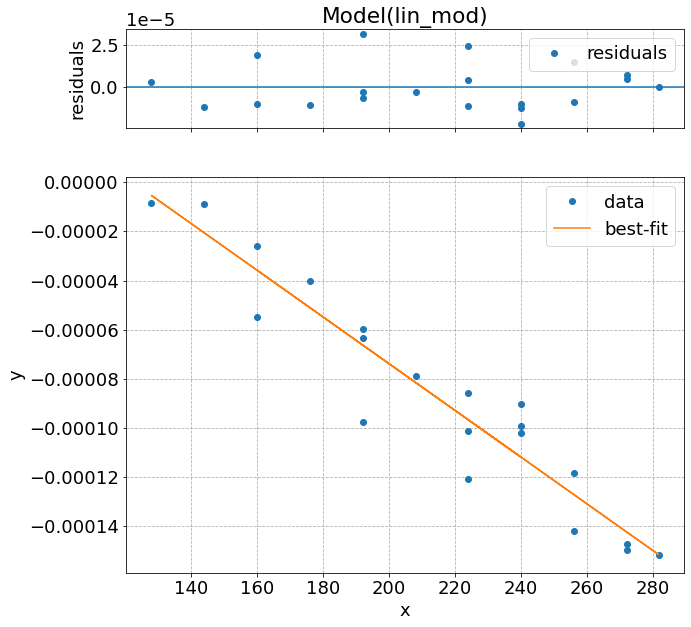

In [1013]:
plt.rcParams.update({"text.usetex": False})
result_temp_coeff.plot()

In [1014]:
plt.rcParams.update({"text.usetex": True})

In [1117]:
def temp_correct(df, df_temp, T0=None, tempcol='Yoke (near pole)'):
    # set up interpolator
    t_interp = interp1d(df_temp.seconds_delta, df_temp[tempcol], kind='linear', fill_value="extrapolate")
    df.loc[:, tempcol] = t_interp(df.seconds_delta)
    if "run" in df.columns:
        B_corr = []
        for run in df.run.unique():
            df_ = df.query(f'run == {run}').copy()
            if T0 is None:
                T0_ = df_[tempcol].mean()
            else:
                T0_ = T0
            # correct temps
            I = df_['Magnet Current [A]'].mean()
            if I > 100:
                temp_coeff = lin_mod(I, **result_temp_coeff.params) # T / deg C
            else:
                temp_coeff = -1e-5 # conservative guess. FIXME!
            dB_vals = temp_coeff * (df_[tempcol] - T0_)
            B_corr.append(df_['NMR [T]'].values - dB_vals)
        B_corr = np.concatenate(B_corr)
    else:
        df_ = df.copy()
        if T0 is None:
            T0_ = df_[tempcol].mean()
        else:
            T0_ = T0
        # correct temps
        I = df_['Magnet Current [A]'].mean()
        if I > 100:
            temp_coeff = lin_mod(I, **result_temp_coeff.params) # T / deg C
        else:
            temp_coeff = -1e-5 # conservative guess. FIXME!
        dB_vals = temp_coeff * (df_[tempcol] - T0_)
        B_corr = (df_['NMR [T]'].values - dB_vals)
    return B_corr

## Plotting

In [1016]:
def plot_xplane(df, xval, color='B_corr'):
    xcol = 'magnet_X_mm'
    ycol = 'magnet_Y_mm'
    zcol = 'magnet_Z_mm'
    xmin = df[xcol].min()
#     df_ = df.query(f'{xcol} == {xval}').copy()
    df_ = df[np.isclose(df[xcol], xval, atol=1e-1, rtol=1e-2)].copy()
    x_mm = df_[xcol].values[0]
    ymin = df_[ycol].min()
    zmin = df_[zcol].max()
    # plot
    fig, ax = plt.subplots()
    sc = ax.scatter(df_[ycol], df_[zcol],
                    c=df_[color], s=10)
    cb = fig.colorbar(sc, label=color)
    ax.set_xlabel('Y [mm]')
    ax.set_ylabel('Z [mm]')
    fig.suptitle(f'X = {x_mm:0.1f} [mm]')
#     fig.suptitle(f'Zaber Encoder X = {xval} [ADC]')
    return fig, ax

# Temperature Regression (from Magnet Ramp / B vs. I analysis)

In [1017]:
# linear: NMR vs. temperature regression
def mod_lin(x, **params):
    return params['A'] + params['B'] * (x - params['X0'])

def linear_temperature_regression(df, xcol, ycol, ystd,
                                  ystd_sf=1, force_decreasing=False, T0 = 20.0):
    # query preprocessed data to get run
    df_ = df.copy()
    df_.loc[:, 'run_hours'] = df_.hours_delta.values
#     df_ = df.query(f'run_num == {run_num}').copy()
    # create an array for weights if float supplied
    if type(ystd) != np.ndarray:
        ystd = ystd*np.ones(len(df_))
    # setup lmfit model
    # y = A + B * x
    model = lm.Model(mod_lin, independent_vars=['x'])
    params = lm.Parameters()
    params.add('A', value=0, vary=True)
    params.add('B', value=0, vary=True)
    params.add('X0', value=T0, vary=False)
    # fit
    result = model.fit(df_[ycol].values, x=df_[xcol].values,
                       params=params, weights=1/ystd, scale_covar=False)
    # check if not decreasing and rerun
    if force_decreasing and (result.params['B'].value > 0.):
        params['B'].vary = False
        result = model.fit(df_[ycol].values, x=df_[xcol].values,
                           params=params, weights=1/ystd, scale_covar=False)
        # label for fit
        bv_str = f'{result.params["B"].value:0.3E}'
        ind = bv_str.find('E')
        b0 = bv_str[:ind]
        bsf = int(bv_str[ind+1:])
        be = f'{result.params["B"].stderr/10**bsf:0.3f}'

        label= (rf'$\underline{{y = A + B (x - {T0})}}$'+'\n'+
                rf'$A = {result.params["A"].value:0.7f}$'+'\n'+
                rf'$\pm {result.params["A"].stderr:0.7f}$'+'\n'+
                rf'$B =$'+'\n'+rf'$({b0}\pm{be})$'+
                rf'$\times 10^{{ {bsf} }}$'+' (fixed)\n'+
                # rf'$B = {result.params["B"].value:0.1f}$'+
                # rf'$\pm {result.params["B"].stderr:0.1f}$'+' (fixed)\n'+
                rf'$\chi^2_\mathrm{{red.}} = {result.redchi:0.2f}$'+'\n')
    else:
        # label for fit
        bv_str = f'{result.params["B"].value:0.3E}'
        ind = bv_str.find('E')
        b0 = bv_str[:ind]
        bsf = int(bv_str[ind+1:])
        be = f'{result.params["B"].stderr/10**bsf:0.3f}'

        label= (rf'$\underline{{y = A + B (x - {T0})}}$'+'\n'+
                rf'$A = {result.params["A"].value:0.7f}$'+'\n'+
                rf'$\pm {result.params["A"].stderr:0.7f}$'+'\n'+
                rf'$B =$'+'\n'+rf'$({b0}\pm{be})$'+
                rf'$\times 10^{{ {bsf} }}$'+'\n'+
                # rf'$B = {result.params["B"].value:0.3E}$'+
                # rf'$\pm {result.params["B"].stderr:0.3E}$'+'\n'+
                rf'$\chi^2_\mathrm{{red.}} = {result.redchi:0.2f}$'+'\n')
    # plot
    # set up figure with two axes
#     config_plots()
    fig = plt.figure()
    ax1 = fig.add_axes((0.12, 0.3, 0.7, 0.6))
    ax2 = fig.add_axes((0.12, 0.08, 0.7, 0.185))
    # colorbar axis
    cb_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    # plot data and fit
    # data
    # with errorbars
    if ystd_sf == 1:
        label_data = 'Data'
    else:
        label_data = r'Data (error $\times$'+f'{ystd_sf})'
    ax1.errorbar(df_[xcol].values, df_[ycol].values, yerr=ystd_sf*ystd,
                 fmt='o', ls='none', ms=2, zorder=100, label=label_data)
    # scatter with color
    #sc = ax1.scatter(df_[xcol].values, df_[ycol].values, c=df_.index, s=1,
    #                 zorder=101)
    sc = ax1.scatter(df_[xcol].values, df_[ycol].values, c=df_.run_hours, s=1,
                     zorder=101)
    # fit
    ax1.plot(df_[xcol].values, result.best_fit, linewidth=2, color='red',
             zorder=99, label=label)
    # calculate residual (data - fit)
    res = df_[ycol].values - result.best_fit
    # calculate ylimit for ax2
    yl = 1.1*(np.max(np.abs(res)) + ystd_sf*ystd[0])
    # plot residual
    # zero-line
    xmin = np.min(df_[xcol].values)
    xmax = np.max(df_[xcol].values)
    ax2.plot([xmin, xmax], [0, 0], 'k--', linewidth=2, zorder=98)
    # residual
    ax2.errorbar(df_[xcol].values, res, yerr=ystd_sf*ystd, fmt='o', ls='none',
                 ms=2, zorder=99)
    #ax2.scatter(df_[xcol].values, res, c=df_.index, s=1, zorder=101)
    ax2.scatter(df_[xcol].values, res, c=df_.run_hours, s=1, zorder=101)
    # colorbar for ax1
    cb = fig.colorbar(sc, cax=cb_ax)
    cb.set_label('Time [Hours]')
    ## WITH DATETIME
    #cb.set_t
    # print(f'vmin = {sc.colorbar.vmin}')
    # print(f'vmax = {sc.colorbar.vmax}')
    # # change colobar ticks labels and locators
    # cb.set_ticks([sc.colorbar.vmin + t*(sc.colorbar.vmax-sc.colorbar.vmin)
    #              for t in cb.ax.get_yticks()])
    # cbtls = [mdates.datetime.datetime.fromtimestamp((sc.colorbar.vmin +
    #          t*(sc.colorbar.vmax-sc.colorbar.vmin))*1e-9).strftime('%c')
    #          for t in cb.ax.get_yticks()]
    # cb.set_ticklabels(cbtls)
    #cb.ax.set_yticklabels(df_.index.strftime('%m-%d %H:%M'))
    # formatting
    # kludge for NMR or Hall
    if ycol == 'NMR [T]':
        ylabel1 = r'$|B|_\mathrm{NMR}$ [T]'
        title_prefix = 'NMR'
    else:
        ylabel1 = r'$|B|_\mathrm{Hall}$ [T]'
        title_prefix = 'Hall Probe'
    # set ylimit ax2
    ax2.set_ylim([-yl, yl])
    # remove ticklabels for ax1 xaxis
    ax1.set_xticklabels([])
    # axis labels
    ax2.set_xlabel(r'Yoke (center magnet) Temp. [$^{\circ}$C]')
    ax2.set_ylabel('(Data - Fit) [T]')
    ax1.set_ylabel(ylabel1)
    # force consistent x axis range for ax1 and ax2
    tmin = np.min(df_[xcol].values)
    tmax = np.max(df_[xcol].values)
    range_t = tmax-tmin
    ax1.set_xlim([tmin-0.1*range_t, tmax+0.1*range_t])
    ax2.set_xlim([tmin-0.1*range_t, tmax+0.1*range_t])
    # turn on legend
    ax1.legend().set_zorder(102)
    # add title
    fig.suptitle(f'{title_prefix} vs. Temperature Regression: Linear Model')#\n'+
                 #f'Run Index {run_num}')
    # minor ticks
    ax1.xaxis.set_minor_locator(AutoMinorLocator())
    ax2.xaxis.set_minor_locator(AutoMinorLocator())
    ax1.yaxis.set_minor_locator(AutoMinorLocator())
    ax2.yaxis.set_minor_locator(AutoMinorLocator())
    # inward ticks and ticks on right and top
    ax1.tick_params(which='both', direction='in', top=True, right=True,
                    bottom=True)
    ax2.tick_params(which='both', direction='in', top=True, right=True)
    # save figure
    #fig.tight_layout()
#     fig.savefig(plotfile+'.pdf')
#     fig.savefig(plotfile+'.png')
    return result, fig, ax1, ax2

# B vs. Temp. (Low NMR)

## 06-06-22 42 A
- Started at 45 deg C --> 18 deg C
- Try to fit temperature coefficient and see if there is agreement with constant

In [960]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-06-06 042715slow.txt'

In [13]:
df_temp = load_data(tempfile, low_NMR=True).iloc[1:]

In [14]:
df_temp

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-06 04:28:01,6/6/2022 4:28:01 AM,41.611013,4.567380,13.376138,13.559447,7.900699,8.756399,11.321179,8.963826,24.444376,...,426431.0,166574.609375,1718667.0,671354.296875,45.0,0.012500,0.000521,7.619687,124.999948,125.000043
2022-06-06 04:28:51,6/6/2022 4:28:51 AM,41.611144,4.567945,13.412513,13.606466,7.498178,8.569319,11.283750,8.745890,24.451612,...,426431.0,166574.609375,1718667.0,671354.296875,95.0,0.026389,0.001100,7.619687,124.999948,125.000043
2022-06-06 04:29:42,6/6/2022 4:29:42 AM,41.611030,4.567667,13.432601,13.617423,6.436079,7.759411,10.531524,7.966756,24.450983,...,426431.0,166574.609375,1718667.0,671354.296875,146.0,0.040556,0.001690,7.619687,124.999948,125.000043
2022-06-06 04:30:32,6/6/2022 4:30:32 AM,41.611070,4.567130,13.371120,13.610465,6.561782,7.707190,10.544429,7.950105,24.442135,...,426431.0,166574.609375,1718667.0,671354.296875,196.0,0.054444,0.002269,7.619687,124.999948,125.000043
2022-06-06 04:31:24,6/6/2022 4:31:24 AM,41.611064,4.566677,13.325927,13.553704,6.895845,7.977519,10.659710,8.189340,24.440660,...,426431.0,166574.609375,1718667.0,671354.296875,248.0,0.068889,0.002870,7.619687,124.999948,125.000043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-06 11:27:15,6/6/2022 11:27:15 AM,41.611070,4.543807,10.031536,9.971293,7.045352,7.527505,8.582882,7.561136,15.016968,...,426687.0,166674.609375,1718923.0,671454.296875,25199.0,6.999722,0.291655,7.619687,125.099948,124.900043
2022-06-06 11:28:05,6/6/2022 11:28:05 AM,41.611093,4.543953,10.032025,9.963383,7.276364,7.714429,8.741486,7.751291,15.018006,...,426687.0,166674.609375,1718923.0,671454.296875,25249.0,7.013611,0.292234,7.619687,125.099948,124.900043
2022-06-06 11:28:57,6/6/2022 11:28:57 AM,41.611098,4.544320,10.031536,9.979045,7.513790,7.917292,8.928673,7.927290,15.008183,...,426687.0,166674.609375,1718923.0,671454.296875,25301.0,7.028056,0.292836,7.619687,125.099948,124.900043


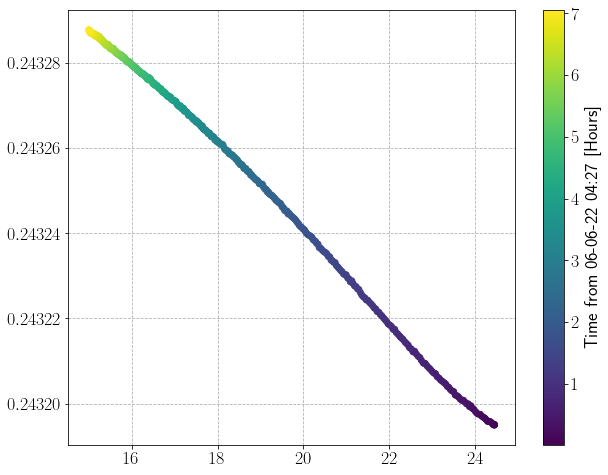

In [15]:
fig, ax = plt.subplots()

sc = ax.scatter(df_temp['Yoke (near pole)'], df_temp['NMR [T]'], c=df_temp.hours_delta)
cb = fig.colorbar(sc, label='Time from 06-06-22 04:27 [Hours]')

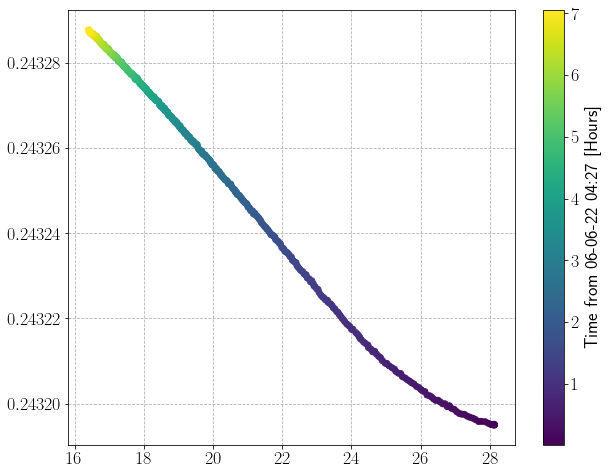

In [16]:
fig, ax = plt.subplots()

sc = ax.scatter(df_temp['Yoke (center magnet)'], df_temp['NMR [T]'], c=df_temp.hours_delta)
cb = fig.colorbar(sc, label='Time from 06-06-22 04:27 [Hours]')

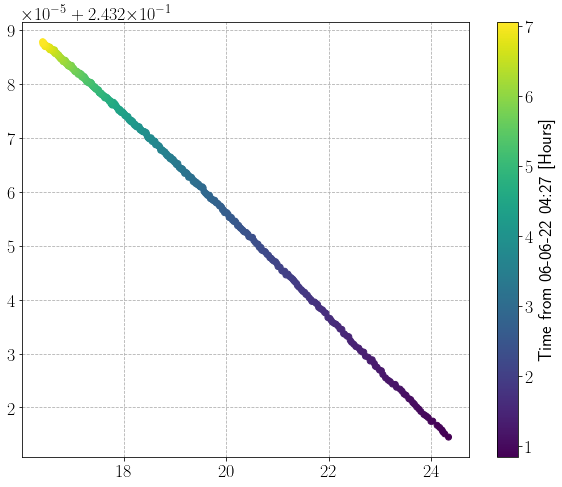

In [17]:
cut = 60

fig, ax = plt.subplots()

sc = ax.scatter(df_temp['Yoke (center magnet)'].iloc[cut:], df_temp['NMR [T]'].iloc[cut:], c=df_temp.hours_delta.iloc[cut:])
cb = fig.colorbar(sc, label='Time from 06-06-22 04:27 [Hours]')

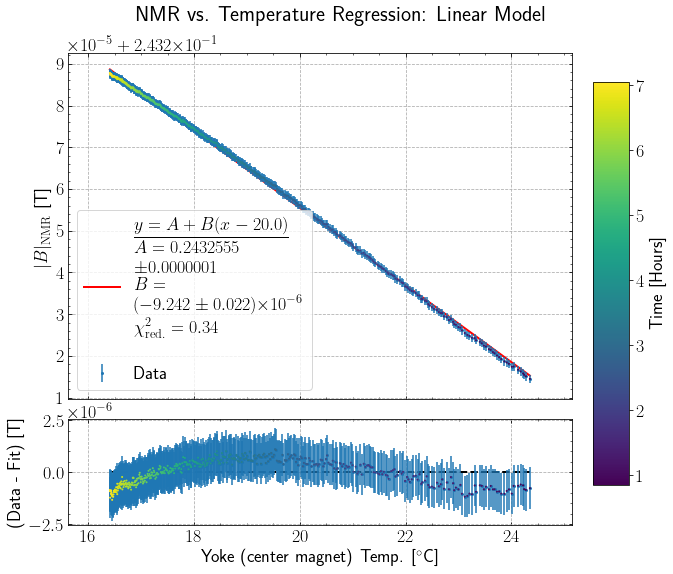

In [18]:
result, fig, ax1, ax2 = linear_temperature_regression(df_temp.iloc[cut:], xcol='Yoke (center magnet)', ycol='NMR [T]', ystd=1e-6, ystd_sf=1, force_decreasing=False, T0 = 20.0)

In [19]:
# temp


## 06-06-22 56 A
- Started at 56 deg C --> 18 deg C to 45 deg C
- Try to fit temperature coefficient and see if there is agreement with constant

In [20]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-06-06 224515slow.txt'

In [21]:
df_temp = load_data(tempfile, low_NMR=True).iloc[1:]

In [22]:
df_temp

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-06 22:46:04,6/6/2022 10:46:04 PM,56.014756,6.134777,10.684502,10.522242,6.792937,7.431014,8.247242,7.353072,13.866762,...,426431.0,166574.609375,1718667.0,671354.296875,48.0,0.013333,0.000556,8.499766,124.999948,125.000043
2022-06-06 22:46:55,6/6/2022 10:46:55 PM,56.014768,6.134623,10.654931,10.502954,7.033517,7.614059,8.475225,7.531633,13.852864,...,426431.0,166574.609375,1718667.0,671354.296875,99.0,0.027500,0.001146,8.499766,124.999948,125.000043
2022-06-06 22:47:45,6/6/2022 10:47:45 PM,56.014756,6.134800,10.667582,10.490304,7.267268,7.782851,8.646936,7.720006,13.843926,...,426431.0,166574.609375,1718667.0,671354.296875,149.0,0.041389,0.001725,8.499766,124.999948,125.000043
2022-06-06 22:48:33,6/6/2022 10:48:33 PM,56.014728,6.135215,10.683581,10.520793,7.483191,7.971198,8.815095,7.903360,13.868644,...,426431.0,166574.609375,1718667.0,671354.296875,197.0,0.054722,0.002280,8.499766,124.999948,125.000043
2022-06-06 22:49:25,6/6/2022 10:49:25 PM,56.014717,6.135972,10.723589,10.563854,7.702611,8.151377,8.991854,8.102046,13.885657,...,426431.0,166574.609375,1718667.0,671354.296875,249.0,0.069167,0.002882,8.499766,124.999948,125.000043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-07 09:51:07,6/7/2022 9:51:07 AM,56.014671,6.132825,10.285310,10.076842,7.297199,7.771600,8.506478,7.675651,14.016382,...,426431.0,166574.609375,1718667.0,671354.296875,39951.0,11.097500,0.462396,8.499766,124.999948,125.000043
2022-06-07 09:51:54,6/7/2022 9:51:54 AM,56.014728,6.133325,10.283116,10.089843,7.498276,7.935762,8.662477,7.842938,14.007895,...,426431.0,166574.609375,1718667.0,671354.296875,39998.0,11.110556,0.462940,8.499766,124.999948,125.000043
2022-06-07 09:52:44,6/7/2022 9:52:44 AM,56.014717,6.134100,10.303677,10.113260,7.726658,8.124041,8.815095,8.020958,13.998701,...,426431.0,166574.609375,1718667.0,671354.296875,40048.0,11.124444,0.463519,8.499766,124.999948,125.000043


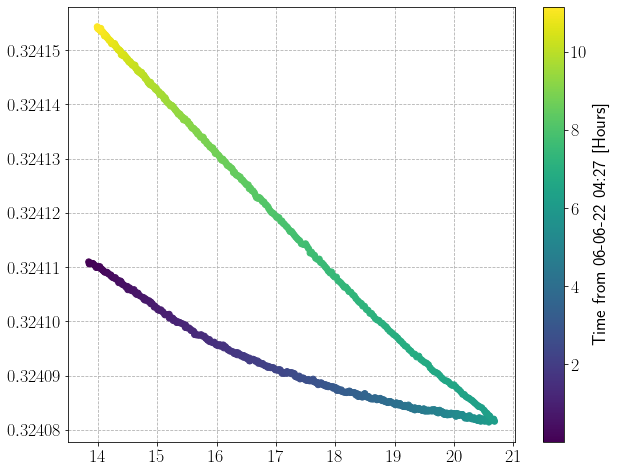

In [23]:
fig, ax = plt.subplots()

sc = ax.scatter(df_temp['Yoke (near pole)'], df_temp['NMR [T]'], c=df_temp.hours_delta)
cb = fig.colorbar(sc, label='Time from 06-06-22 04:27 [Hours]')

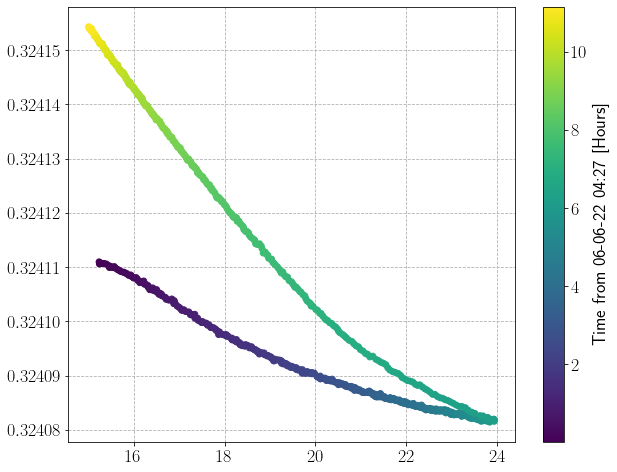

In [24]:
fig, ax = plt.subplots()

sc = ax.scatter(df_temp['Yoke (center magnet)'], df_temp['NMR [T]'], c=df_temp.hours_delta)
cb = fig.colorbar(sc, label='Time from 06-06-22 04:27 [Hours]')

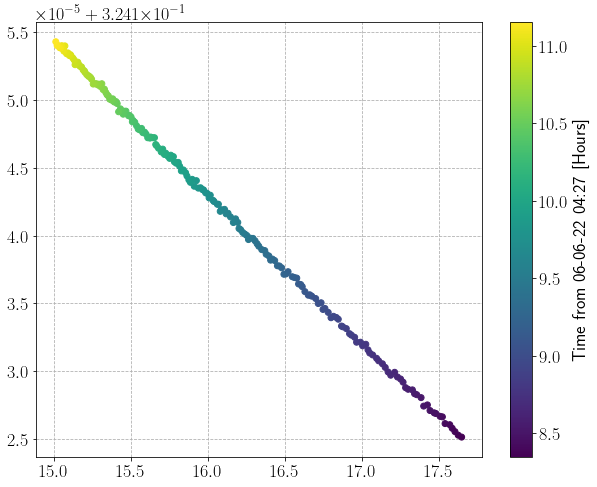

In [25]:
#cut = 0
cut = 10*60

fig, ax = plt.subplots()

sc = ax.scatter(df_temp['Yoke (center magnet)'].iloc[cut:], df_temp['NMR [T]'].iloc[cut:], c=df_temp.hours_delta.iloc[cut:])
cb = fig.colorbar(sc, label='Time from 06-06-22 04:27 [Hours]')

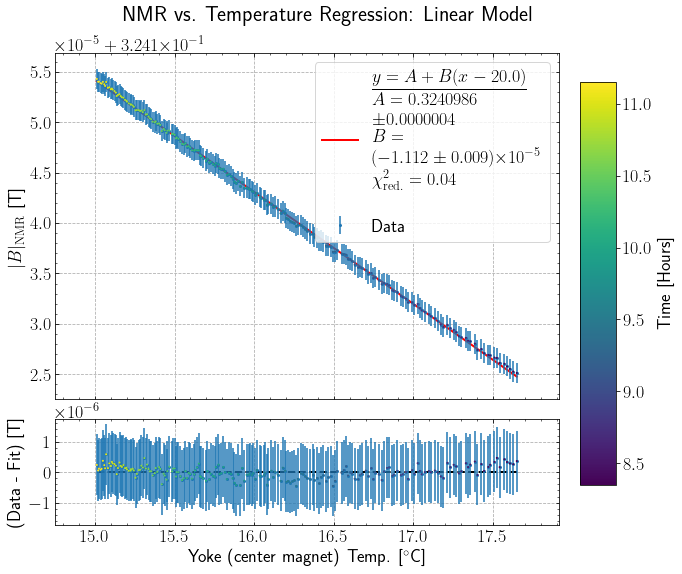

In [26]:
result, fig, ax1, ax2 = linear_temperature_regression(df_temp.iloc[cut:], xcol='Yoke (center magnet)', ycol='NMR [T]', ystd=1e-6, ystd_sf=1, force_decreasing=False, T0 = 20.0)

In [27]:
# 2022-06-06 23:04
# for historical purposes, see how this number changes over time
result.params['B']

<Parameter 'B', value=-1.1115076146719834e-05 +/- 9.29e-08, bounds=[-inf:inf]>

# 3D Scans

## 05-25-22 Overnight
- 51 mm x 20 mm x 20 mm (X x Y x Z) with step size 2 mm in each dimension.
- Did not complete overnight -- looks to be a little over half done.
- Check here if we have enough data for the analysis.
    - If yes, stop measurement.
    - If no, figure out how long I need to wait.

In [ ]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-05-25 182823slow.txt'
datafile = ddir+'temp_pole_to_pole_05-25-22/2022-05-25 184012.txt'

In [ ]:
df = load_data(datafile, low_NMR=True)
df_temp = load_data(tempfile, low_NMR=True)

In [ ]:
from Zaber_Magnet_Convert_Jun21 import zaber_ADC_to_magnet_mm as zaber_ADC_to_magnet_mm_Jun21
df_old = load_data(ddir+'2021-06-15 073806.txt', low_NMR=False)
df_old = df_old.query("127 < `Magnet Current [V]` < 129").copy()
for i in ['X', 'Y', 'Z']:
    #df[f'magnet_{i}_mm'] = ADC_to_mm(df[f'Zaber_Meas_Encoder_{i}'].values, coord=i)
    df_old[f'magnet_{i}_mm'] = zaber_ADC_to_magnet_mm_Jun21(df_old[f'Zaber_Meas_Encoder_{i}'].values, coord=i, low_NMR=False)

In [ ]:
df['Magnet Current [A]']

In [ ]:
df_old

In [ ]:
len(df)

In [ ]:
df = df.query('`NMR [T]` > 0.6').copy()

In [ ]:
len(df)

In [ ]:
fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['NMR [T]']], scale_unit='T', inline=True)

In [ ]:
df_temp['Yoke (near pole)']

In [ ]:
df.magnet_Z_mm.unique()

In [ ]:
df.magnet_X_mm.unique()

In [ ]:
df_line = df[np.isclose(df.magnet_Y_mm, 124.99994825) & np.isclose(df.magnet_Z_mm, 125.000043)].copy()

In [ ]:
sf = df_line[np.isclose(df_line.magnet_X_mm, 34.49976562)].iloc[0]['NMR [T]']

In [ ]:
sf

In [ ]:
df_old.magnet_X_mm.unique()

In [ ]:
sf_old = df_old[np.isclose(df_old.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['NMR [T]']

In [ ]:
sf_old

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={df_line['Magnet Current [A]'].mean():0.1f} A, Low-Field NMR")
# ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={df_line['Magnet Current [A]'].mean()} A, Low-Field NMR")
           
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]'], label=f"I={df_old['Magnet Current [V]'].mean():0.1f} A, High-Field NMR - June 2021")

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={df_line['Magnet Current [A]'].mean():0.1f} A, Low-Field NMR")
# ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={df_line['Magnet Current [A]'].mean()} A, Low-Field NMR")
           
# ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]'], label=f"I={df_old['Magnet Current [V]'].mean():0.1f} A, High-Field NMR - June 2021")

# temperature
ax2 = ax.twinx()
ax2.scatter(df_temp['magnet_X_mm'], df_temp['Yoke (near pole)'], color='orange', label=f"Yoke Temp.")
           
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();
ax2.legend();

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={df_line['Magnet Current [A]'].mean():0.1f} A, Low-Field NMR")
ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={df_line['Magnet Current [A]'].mean()} A, Low-Field NMR")

ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]']/sf_old, label=f"I={df_old['Magnet Current [V]'].mean():0.1f} A, High-Field NMR - June 2021")           

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={df_line['Magnet Current [A]'].mean():0.1f} A, Low-Field NMR")
ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={df_line['Magnet Current [A]'].mean()} A, Low-Field NMR")
           
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 05-26-22 Overnight
- 51 mm x 20 mm x 20 mm (X x Y x Z) with step size 2 mm in each dimension.
- Did not complete overnight -- looks to be ~4/5 done.
- Check here if we have enough data for the analysis.
    - If yes, stop measurement.
    - If no, figure out how long I need to wait.
- **Need to do temperature correction!**

In [ ]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-05-26 093219slow.txt'
datafile = ddir+'temp_pole_to_pole_05-25-22/2022-05-26 202323.txt'
datafile1d = ddir+'temp_pole_to_pole_05-25-22/2022-05-26 200005.txt'

In [ ]:
df = load_data(datafile, low_NMR=False)
df_1d = load_data(datafile1d, low_NMR=False).iloc[1:].copy()
df_temp = load_data(tempfile, low_NMR=True)

In [ ]:
df['Magnet Current [A]']

In [ ]:
# from Zaber_Magnet_Convert_Jun21 import zaber_ADC_to_magnet_mm as zaber_ADC_to_magnet_mm_Jun21
# df_old = load_data(ddir+'2021-06-15 073806.txt', low_NMR=False)
# df_old = df_old.query("127 < `Magnet Current [V]` < 129").copy()
# for i in ['X', 'Y', 'Z']:
#     #df[f'magnet_{i}_mm'] = ADC_to_mm(df[f'Zaber_Meas_Encoder_{i}'].values, coord=i)
#     df_old[f'magnet_{i}_mm'] = zaber_ADC_to_magnet_mm_Jun21(df_old[f'Zaber_Meas_Encoder_{i}'].values, coord=i, low_NMR=False)

In [ ]:
#df

In [ ]:
df_1d

In [ ]:
len(df)

In [ ]:
len(df_1d)

In [ ]:
df = df.query('`NMR [T]` > 1.3').copy()

In [ ]:
len(df)

In [ ]:
fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['NMR [T]']], scale_unit='T', inline=True)

In [ ]:
df_temp['Yoke (near pole)']

In [ ]:
df.magnet_Z_mm.unique()

In [ ]:
df.magnet_X_mm.unique()

In [ ]:
df_line = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)].copy()

In [ ]:
sf = df_line[np.isclose(df_line.magnet_X_mm, 33.5, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']

In [ ]:
sf

In [ ]:
df_1d.magnet_X_mm.unique()

In [ ]:
sf_1d = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['NMR [T]']

In [ ]:
sf_1d

In [ ]:
I = df['Magnet Current [A]'].mean()
I_1d = df_1d['Magnet Current [A]'].mean()

In [ ]:
I, I_1d

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]'], label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
t0 = df.index[0]
tf = df.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")

# temperature
ax2 = ax.twinx()
ax2.scatter(df_temp_['magnet_X_mm'], df_temp_['Yoke (near pole)'], color='orange', label=f"Yoke Temp.")
           
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();
ax2.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]']/sf_1d, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 05-28-22
- 272 A, 45 deg C enclosure temp.
- 52 mm x 20 mm x 20 mm (X x Y x Z) with step size 2 mm in Y,Z and 1 mm in X.

In [ ]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-05-26 093219slow.txt'
datafile = ddir+'temp_pole_to_pole_05-25-22/2022-05-28 172957.txt'
datafile1d = ddir+'temp_pole_to_pole_05-25-22/2022-05-28 165647.txt'

In [ ]:
df = load_data(datafile, low_NMR=False).iloc[1:].copy()
df_1d = load_data(datafile1d, low_NMR=False).iloc[1:].copy()
df_temp = load_data(tempfile, low_NMR=True)

In [ ]:
for df_ in [df, df_1d]:
    df_.eval('run = 3', inplace=True)
    df_['seconds_delta'] = (df_.index - df_temp.index[0]).total_seconds()
    df_['hours_delta'] = (df_.index - df_temp.index[0]).total_seconds()/60**2
    df_['days_delta'] = (df_.index - df_temp.index[0]).total_seconds()/(24*60**2)
    # cut low point that not all measurements have
    ## df = df.query('magnet_X_mm > 11').copy()
    # temperature correction
    B_corr = temp_correct(df_, df_temp, tempcol="Yoke (near pole)")
    # B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
    df_.loc[:, 'B_corr'] = B_corr
    df_.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
    # recalculate scale factor
    # find field value at Hall probe location
    sf_corr_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['B_corr']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_corr_list.append(sf)
    df_['sf_corr'] = sf_corr_list

In [ ]:
df

In [ ]:
df_1d

In [ ]:
len(df)

In [ ]:
len(df_1d)

In [ ]:
df['NMR [T]']

In [ ]:
df = df.query('`NMR [T]` > 1.1').copy()

In [ ]:
len(df)

In [ ]:
df['deltaB'].describe()

In [ ]:
# fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['NMR [T]']], scale_unit='T', inline=True)
fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['B_corr']], scale_unit='T', inline=True)

In [ ]:
df.magnet_Z_mm.unique()

In [ ]:
df.magnet_X_mm.unique()

In [ ]:
df_line = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)].copy()

In [ ]:
sf = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_corr = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['B_corr']

In [ ]:
sf, sf_corr

In [ ]:
df_1d.magnet_X_mm.unique()

In [ ]:
sf_1d = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_1d_corr = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['B_corr']

In [ ]:
sf_1d, sf_1d_corr

In [ ]:
I = df['Magnet Current [A]'].mean()
I_1d = df_1d['Magnet Current [A]'].mean()

In [ ]:
I, I_1d

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]'], label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr'], label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr'], label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
t0 = df.index[0]
tf = df.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")

# temperature
ax2 = ax.twinx()
ax2.scatter(df_temp_['magnet_X_mm'], df_temp_['Yoke (near pole)'], color='orange', label=f"Yoke Temp.")
           
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();
ax2.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]']/sf_1d, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr']/sf_corr, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr']/sf_1d_corr, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# B_ratio = B_Hall / B_NMR
Brs = []
for df_, sf in zip([df_line, df_1d], [sf_corr, sf_1d_corr]):
    df_ = df_[np.isclose(df_.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)].copy().iloc[0]
    Brs.append(sf / df_['B_corr'])
    print(Brs[-1])

In [ ]:
Brs[1] - Brs[0]

- 10^-7 !

- Assess skew by looking at each x slice

In [ ]:
# no correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'NMR [T]')

In [ ]:
# temp correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'B_corr')

## 05-31-22
- 272 A, 18 deg C enclosure temp.
- 50 mm x 20 mm x 20 mm (X x Y x Z) with step size 2 mm in X, Y, Z.

In [ ]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-05-31 085349slow.txt'
datafile = ddir+'temp_pole_to_pole_05-25-22/2022-05-31 085725.txt'
datafile1d = ddir+'temp_pole_to_pole_05-25-22/2022-05-28 165647.txt'

In [ ]:
df = load_data(datafile, low_NMR=False).iloc[1:].copy()
df_1d = load_data(datafile1d, low_NMR=False).iloc[1:].copy()
df_temp = load_data(tempfile, low_NMR=True)

In [ ]:
for df_ in [df, df_1d]:
    df_.eval('run = 3', inplace=True)
    df_['seconds_delta'] = (df_.index - df_temp.index[0]).total_seconds()
    df_['hours_delta'] = (df_.index - df_temp.index[0]).total_seconds()/60**2
    df_['days_delta'] = (df_.index - df_temp.index[0]).total_seconds()/(24*60**2)
    # cut low point that not all measurements have
    ## df = df.query('magnet_X_mm > 11').copy()
    # temperature correction
    B_corr = temp_correct(df_, df_temp, tempcol="Yoke (near pole)")
    # B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
    df_.loc[:, 'B_corr'] = B_corr
    df_.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
    # recalculate scale factor
    # find field value at Hall probe location
    sf_corr_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['B_corr']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_corr_list.append(sf)
    df_['sf_corr'] = sf_corr_list

In [ ]:
df

In [ ]:
#df_1d

In [ ]:
len(df)

In [ ]:
len(df_1d)

In [ ]:
df['NMR [T]']

In [ ]:
len(df)

In [ ]:
df = df.query('`NMR [T]` > 1.1').copy()

In [ ]:
len(df)

In [ ]:
df['deltaB'].describe()

In [ ]:
# fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['NMR [T]']], scale_unit='T', inline=True)
fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['B_corr']], scale_unit='T', inline=True)

In [ ]:
df.magnet_Z_mm.unique()

In [ ]:
df.magnet_X_mm.unique()

In [ ]:
df_line = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)].copy()

In [ ]:
sf = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_corr = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['B_corr']

In [ ]:
sf, sf_corr

In [ ]:
df_1d.magnet_X_mm.unique()

In [ ]:
sf_1d = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_1d_corr = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['B_corr']

In [ ]:
sf_1d, sf_1d_corr

In [ ]:
I = df['Magnet Current [A]'].mean()
I_1d = df_1d['Magnet Current [A]'].mean()

In [ ]:
I, I_1d

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]'], label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr'], label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr'], label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
t0 = df.index[0]
tf = df.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")

# temperature
ax2 = ax.twinx()
ax2.scatter(df_temp_['magnet_X_mm'], df_temp_['Yoke (near pole)'], color='orange', label=f"Yoke Temp.")
           
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();
ax2.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]']/sf_1d, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr']/sf_corr, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr']/sf_1d_corr, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# B_ratio = B_Hall / B_NMR
Brs = []
for df_, sf in zip([df_line, df_1d], [sf_corr, sf_1d_corr]):
    df_ = df_[np.isclose(df_.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)].copy().iloc[0]
    Brs.append(sf / df_['B_corr'])
    print(Brs[-1])

In [ ]:
Brs[1] - Brs[0]

- 10^-5

- Assess skew by looking at each x slice

In [ ]:
# no correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'NMR [T]')

In [ ]:
# temp correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'B_corr')

## 06-02-22
- 42 A, 18 deg C enclosure temp.
- 50 mm x 20 mm x 20 mm (X x Y x Z) with step size 2 mm in X, Y, Z.

In [716]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-05-31 085349slow.txt'
datafile = ddir+'temp_pole_to_pole_05-25-22/2022-06-02 121043.txt'
datafile1d = ddir+'temp_pole_to_pole_05-25-22/2022-06-01 142807.txt'

In [717]:
df = load_data(datafile, low_NMR=True).iloc[1:].copy()
# 1D has many scans. for now pick the 10th one
df_1d = load_data(datafile1d, low_NMR=True).iloc[1 + 10*26:27 + 10*26].copy()
df_temp = load_data(tempfile, low_NMR=True)

In [718]:
df_1d

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-01 16:42:58,6/1/2022 4:42:58 PM,41.611178,4.546052,0.243293,0.0,426758.0,426428.0,1718664.0,426758.0,166702.34375,426428.0,166573.4375,1718664.0,671353.125,8091.0,2.247500,0.093646,8.499766,124.998776,125.001215
2022-06-01 16:43:26,6/1/2022 4:43:26 PM,41.611155,4.545765,0.243291,0.0,431878.0,426428.0,1718664.0,431878.0,168702.34375,426428.0,166573.4375,1718664.0,671353.125,8119.0,2.255278,0.093970,10.499766,124.998776,125.001215
2022-06-01 16:44:16,6/1/2022 4:44:16 PM,41.611110,4.545197,0.243289,0.0,436998.0,426428.0,1718664.0,436998.0,170702.34375,426428.0,166573.4375,1718664.0,671353.125,8169.0,2.269167,0.094549,12.499766,124.998776,125.001215
2022-06-01 16:44:47,6/1/2022 4:44:47 PM,41.611115,4.544868,0.243286,0.0,442118.0,426428.0,1718664.0,442118.0,172702.34375,426428.0,166573.4375,1718664.0,671353.125,8200.0,2.277778,0.094907,14.499766,124.998776,125.001215
2022-06-01 16:45:18,6/1/2022 4:45:18 PM,41.611115,4.544608,0.243283,0.0,447238.0,426428.0,1718664.0,447238.0,174702.34375,426428.0,166573.4375,1718664.0,671353.125,8231.0,2.286389,0.095266,16.499766,124.998776,125.001215
2022-06-01 16:45:48,6/1/2022 4:45:48 PM,41.611076,4.544462,0.243280,0.0,452358.0,426428.0,1718664.0,452358.0,176702.34375,426428.0,166573.4375,1718664.0,671353.125,8261.0,2.294722,0.095613,18.499766,124.998776,125.001215
2022-06-01 16:46:18,6/1/2022 4:46:18 PM,41.611064,4.544395,0.243276,0.0,457478.0,426428.0,1718664.0,457478.0,178702.34375,426428.0,166573.4375,1718664.0,671353.125,8291.0,2.303056,0.095961,20.499766,124.998776,125.001215
2022-06-01 16:46:48,6/1/2022 4:46:48 PM,41.611144,4.544410,0.243273,0.0,462598.0,426428.0,1718664.0,462598.0,180702.34375,426428.0,166573.4375,1718664.0,671353.125,8321.0,2.311389,0.096308,22.499766,124.998776,125.001215
2022-06-01 16:47:20,6/1/2022 4:47:20 PM,41.611138,4.544467,0.243270,0.0,467718.0,426428.0,1718664.0,467718.0,182702.34375,426428.0,166573.4375,1718664.0,671353.125,8353.0,2.320278,0.096678,24.499766,124.998776,125.001215


In [719]:
for df_ in [df, df_1d]:
# for df_ in [df]:
    #df_.eval('run = 3', inplace=True)
#     df_.eval('run = 4', inplace=True)
    df_.loc[:, 'run'] = 4
    df_['seconds_delta'] = (df_.index - df_temp.index[0]).total_seconds()
    df_['hours_delta'] = (df_.index - df_temp.index[0]).total_seconds()/60**2
    df_['days_delta'] = (df_.index - df_temp.index[0]).total_seconds()/(24*60**2)
    # cut low point that not all measurements have
    ## df = df.query('magnet_X_mm > 11').copy()
    # temperature correction
    B_corr = temp_correct(df_, df_temp, tempcol="Yoke (near pole)")
    # B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
    df_.loc[:, 'B_corr'] = B_corr
    df_.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
    # recalculate scale factor
    # find field value at Hall probe location
    sf_corr_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['B_corr']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_corr_list.append(sf)
    df_['sf_corr'] = sf_corr_list

In [720]:
df_temp

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-05-31 08:53:50,5/31/2022 8:53:50 AM,272.069700,35.476200,53.598553,48.794582,9.582423,17.126587,12.142934,18.377241,24.204889,...,400831.0,156574.609375,1685368.0,658346.875000,0.0,0.000000,0.000000,7.619687,114.999948,138.007465
2022-05-31 08:54:15,5/31/2022 8:54:15 AM,272.069643,35.485283,53.584053,48.835541,8.598127,16.629662,11.711463,17.886822,24.202412,...,400831.0,156574.609375,1685368.0,658346.875000,25.0,0.006944,0.000289,7.619687,114.999948,138.007465
2022-05-31 08:59:17,5/31/2022 8:59:17 AM,272.069700,35.482317,53.588772,48.812386,9.411251,17.074732,12.096130,18.304050,24.194881,...,400831.0,156574.609375,1659762.0,648344.531250,327.0,0.090833,0.003785,8.619687,114.999948,148.009809
2022-05-31 09:04:17,5/31/2022 9:04:17 AM,272.069700,35.477883,53.532459,48.821934,9.849495,17.138025,12.103517,18.464584,24.200937,...,411071.0,160574.609375,1644402.0,642344.531250,627.0,0.174167,0.007257,8.619687,118.999948,154.009809
2022-05-31 09:09:17,5/31/2022 9:09:17 AM,272.069700,35.473833,53.543072,48.799850,9.283876,16.663483,11.728858,18.047337,24.204927,...,416191.0,162574.609375,1690482.0,660344.531250,927.0,0.257500,0.010729,8.619687,120.999948,136.009809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-06 04:09:18,6/6/2022 4:09:18 AM,41.611047,4.568047,13.351699,13.585005,7.224542,8.444579,11.139754,8.566462,24.447857,...,441791.0,172574.609375,1728907.0,675354.296875,501328.0,139.257778,5.802407,58.499766,130.999948,121.000043
2022-06-06 04:14:17,6/6/2022 4:14:17 AM,41.611070,4.567110,13.346740,13.568542,7.732899,8.626739,11.268707,8.824920,24.456587,...,446911.0,174574.609375,1731071.0,676294.140625,501627.0,139.340833,5.805868,58.499766,132.999948,120.154731
2022-06-06 04:19:18,6/6/2022 4:19:18 AM,41.611138,4.566503,13.338059,13.534105,7.232192,8.198380,10.841520,8.407866,24.433050,...,452031.0,176574.609375,1734027.0,677354.296875,501928.0,139.424444,5.809352,58.499766,134.999948,119.000043


In [721]:
len(B_corr)

26

In [722]:
len(df)

3146

In [723]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,Yoke (near pole),B_corr,deltaB,sf_corr
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-02 12:11:27,6/2/2022 12:11:27 PM,41.611008,4.542687,0.243313,0.0,426758.0,400831.0,1693067.0,426758.0,166702.34375,...,51.293611,2.137234,8.499766,114.999948,135.000043,4,13.697103,0.243313,1.858764e-07,0.243256
2022-06-02 12:11:55,6/2/2022 12:11:55 PM,41.611019,4.542855,0.243310,0.0,426758.0,400831.0,1698187.0,426758.0,166702.34375,...,51.301389,2.137558,8.499766,114.999948,133.000043,4,13.695766,0.243310,1.725021e-07,0.243256
2022-06-02 12:12:21,6/2/2022 12:12:21 PM,41.611104,4.543092,0.243308,0.0,426758.0,400831.0,1703307.0,426758.0,166702.34375,...,51.308611,2.137859,8.499766,114.999948,131.000043,4,13.694524,0.243308,1.600830e-07,0.243256
2022-06-02 12:12:47,6/2/2022 12:12:47 PM,41.610996,4.543340,0.243306,0.0,426758.0,400831.0,1708427.0,426758.0,166702.34375,...,51.315833,2.138160,8.499766,114.999948,129.000043,4,13.693282,0.243306,1.476640e-07,0.243256
2022-06-02 12:13:14,6/2/2022 12:13:14 PM,41.611081,4.543663,0.243304,0.0,426758.0,400831.0,1713547.0,426758.0,166702.34375,...,51.323333,2.138472,8.499766,114.999948,127.000043,4,13.691992,0.243305,1.347673e-07,0.243256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-03 13:40:11,6/3/2022 1:40:11 PM,41.611076,4.542497,0.243274,0.0,554758.0,452031.0,1723787.0,554758.0,216702.34375,...,76.772500,3.198854,58.499766,134.999948,123.000043,4,13.672405,0.243274,-6.110510e-08,0.243256
2022-06-03 13:40:38,6/3/2022 1:40:38 PM,41.611025,4.542702,0.243275,0.0,554758.0,452031.0,1728907.0,554758.0,216702.34375,...,76.780000,3.199167,58.499766,134.999948,121.000043,4,13.672603,0.243275,-5.912263e-08,0.243256
2022-06-03 13:41:04,6/3/2022 1:41:04 PM,41.611064,4.542982,0.243275,0.0,554758.0,452031.0,1734027.0,554758.0,216702.34375,...,76.787222,3.199468,58.499766,134.999948,119.000043,4,13.672794,0.243275,-5.721359e-08,0.243256


In [724]:
#df_1d

In [725]:
len(df)

3146

In [726]:
len(df_1d)

26

In [727]:
df['NMR [T]']

Datetime
2022-06-02 12:11:27    0.243313
2022-06-02 12:11:55    0.243310
2022-06-02 12:12:21    0.243308
2022-06-02 12:12:47    0.243306
2022-06-02 12:13:14    0.243304
                         ...   
2022-06-03 13:40:11    0.243274
2022-06-03 13:40:38    0.243275
2022-06-03 13:41:04    0.243275
2022-06-03 13:41:30    0.243276
2022-06-03 13:41:57    0.243277
Name: NMR [T], Length: 3146, dtype: float64

In [728]:
df['B_corr']

Datetime
2022-06-02 12:11:27    0.243313
2022-06-02 12:11:55    0.243310
2022-06-02 12:12:21    0.243308
2022-06-02 12:12:47    0.243306
2022-06-02 12:13:14    0.243305
                         ...   
2022-06-03 13:40:11    0.243274
2022-06-03 13:40:38    0.243275
2022-06-03 13:41:04    0.243275
2022-06-03 13:41:30    0.243276
2022-06-03 13:41:57    0.243277
Name: B_corr, Length: 3146, dtype: float64

In [729]:
df.deltaB

Datetime
2022-06-02 12:11:27    1.858764e-07
2022-06-02 12:11:55    1.725021e-07
2022-06-02 12:12:21    1.600830e-07
2022-06-02 12:12:47    1.476640e-07
2022-06-02 12:13:14    1.347673e-07
                           ...     
2022-06-03 13:40:11   -6.110510e-08
2022-06-03 13:40:38   -5.912263e-08
2022-06-03 13:41:04   -5.721359e-08
2022-06-03 13:41:30   -5.530455e-08
2022-06-03 13:41:57   -5.332208e-08
Name: deltaB, Length: 3146, dtype: float64

In [730]:
len(df)

3146

In [731]:
#df = df.query('`NMR [T]` > 1.1').copy()
df = df.query('`NMR [T]` > 0.2').copy()

In [732]:
len(df)

3146

In [733]:
df['deltaB'].describe()

count    3.146000e+03
mean     3.528999e-20
std      1.022667e-07
min     -2.341514e-07
25%     -7.280435e-08
50%     -1.397066e-08
75%      7.196267e-08
max      2.630362e-07
Name: deltaB, dtype: float64

In [734]:
df['deltaB']

Datetime
2022-06-02 12:11:27    1.858764e-07
2022-06-02 12:11:55    1.725021e-07
2022-06-02 12:12:21    1.600830e-07
2022-06-02 12:12:47    1.476640e-07
2022-06-02 12:13:14    1.347673e-07
                           ...     
2022-06-03 13:40:11   -6.110510e-08
2022-06-03 13:40:38   -5.912263e-08
2022-06-03 13:41:04   -5.721359e-08
2022-06-03 13:41:30   -5.530455e-08
2022-06-03 13:41:57   -5.332208e-08
Name: deltaB, Length: 3146, dtype: float64

In [735]:
# fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['NMR [T]']], scale_unit='T', inline=True)
fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['B_corr']], scale_unit='T', inline=True)

In [736]:
df.magnet_Z_mm.unique()

array([135.000043, 133.000043, 131.000043, 129.000043, 127.000043,
       125.000043, 123.000043, 121.000043, 119.000043, 117.000043,
       115.000043])

In [737]:
df.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [738]:
df_line = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)].copy()

In [739]:
sf = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_corr = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['B_corr']

In [740]:
sf, sf_corr

(0.243262922, 0.24326287780545278)

In [741]:
df_1d.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [742]:
sf_1d = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_1d_corr = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['B_corr']

In [743]:
sf_1d, sf_1d_corr

(0.243257047, 0.24325703380408517)

In [744]:
I = df['Magnet Current [A]'].mean()
I_1d = df_1d['Magnet Current [A]'].mean()

In [745]:
I, I_1d

(41.61103976276637, 41.61106847434615)

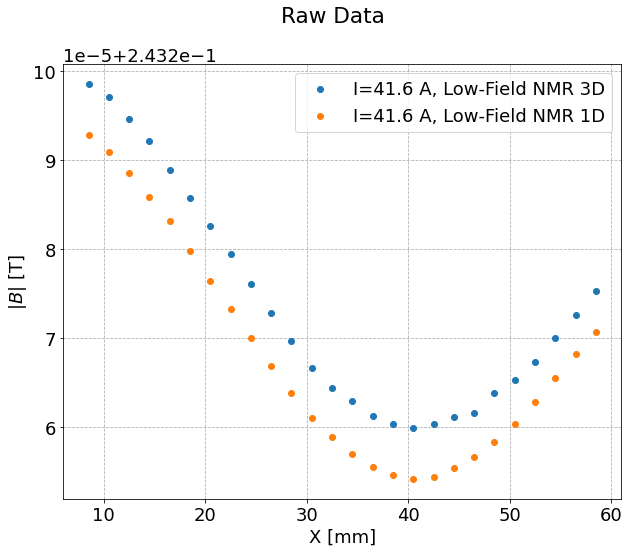

In [746]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, Low-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]'], label=f"I={I_1d:0.1f} A, Low-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

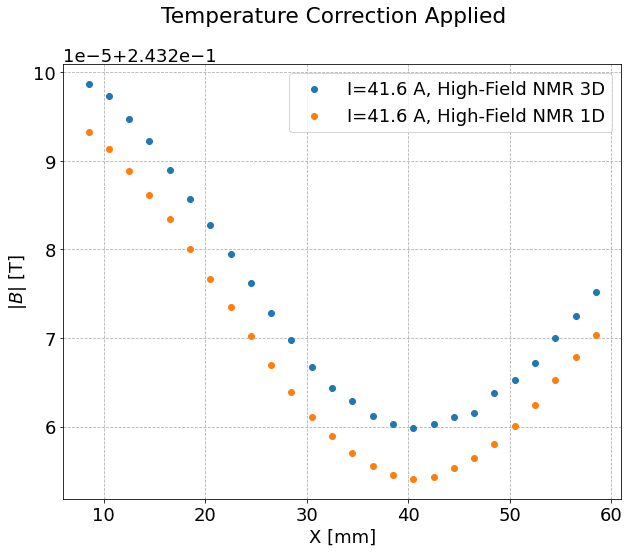

In [747]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr'], label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr'], label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [748]:
t0 = df.index[0]
tf = df.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

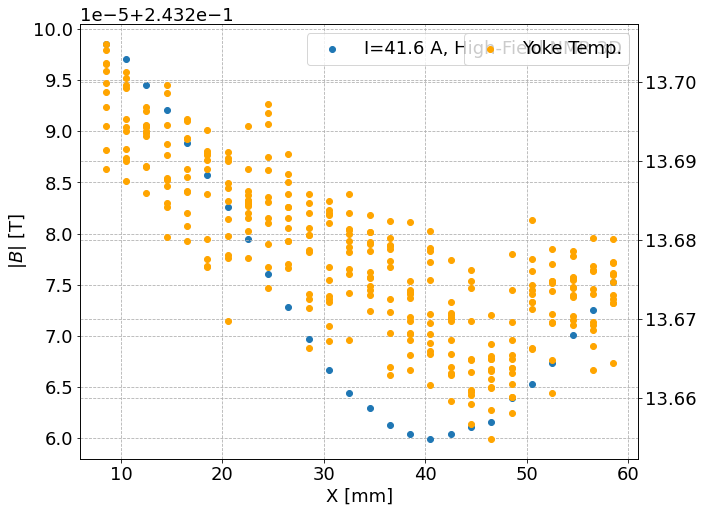

In [749]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")

# temperature
ax2 = ax.twinx()
ax2.scatter(df_temp_['magnet_X_mm'], df_temp_['Yoke (near pole)'], color='orange', label=f"Yoke Temp.")
           
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();
ax2.legend();

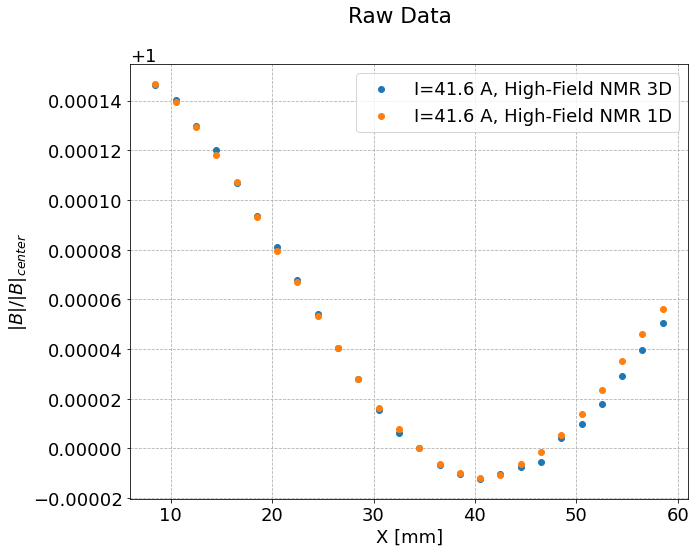

In [750]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]']/sf_1d, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

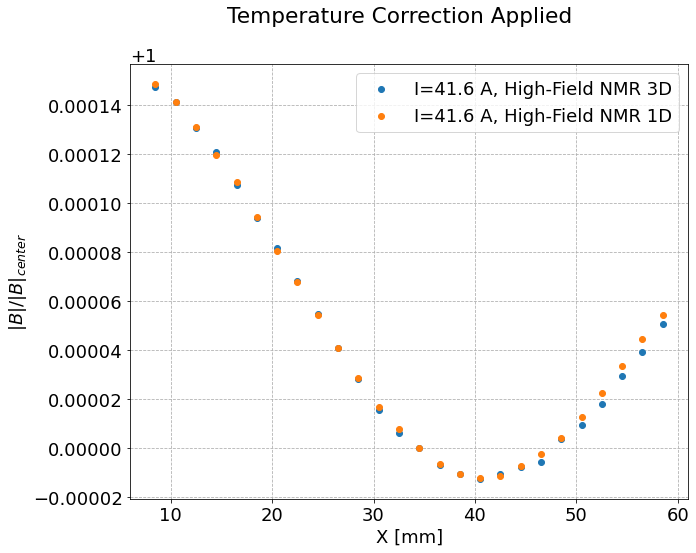

In [751]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr']/sf_corr, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr']/sf_1d_corr, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [752]:
# B_ratio = B_Hall / B_NMR
Brs = []
for df_, sf in zip([df_line, df_1d], [sf_corr, sf_1d_corr]):
    df_ = df_[np.isclose(df_.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)].copy().iloc[0]
    Brs.append(sf / df_['B_corr'])
    print(Brs[-1])

0.999869171648126
0.9998691279925007


In [753]:
Brs[1] - Brs[0]

-4.3655625336924686e-08

- 10^-8

- Assess skew by looking at each x slice

In [ ]:
# no correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'NMR [T]')

In [ ]:
# temp correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'B_corr')

## 06-05-22
- 42 A, 45 deg C enclosure temp. (actual ~36 deg C)
- 50 mm x 20 mm x 20 mm (X x Y x Z) with step size 2 mm in X, Y, Z.

In [754]:
tempfile = ddir+'temp_pole_to_pole_05-25-22/2022-05-31 085349slow.txt'
datafile = ddir+'temp_pole_to_pole_05-25-22/2022-06-05 013328.txt'
datafile1d = ddir+'temp_pole_to_pole_05-25-22/2022-06-01 142807.txt'

In [755]:
df = load_data(datafile, low_NMR=True).iloc[1:].copy()
# 1D has many scans. for now pick the 10th one
df_1d = load_data(datafile1d, low_NMR=True).iloc[1 + 10*26:27 + 10*26].copy()
df_temp = load_data(tempfile, low_NMR=True)

In [756]:
df_1d

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-01 16:42:58,6/1/2022 4:42:58 PM,41.611178,4.546052,0.243293,0.0,426758.0,426428.0,1718664.0,426758.0,166702.34375,426428.0,166573.4375,1718664.0,671353.125,8091.0,2.247500,0.093646,8.499766,124.998776,125.001215
2022-06-01 16:43:26,6/1/2022 4:43:26 PM,41.611155,4.545765,0.243291,0.0,431878.0,426428.0,1718664.0,431878.0,168702.34375,426428.0,166573.4375,1718664.0,671353.125,8119.0,2.255278,0.093970,10.499766,124.998776,125.001215
2022-06-01 16:44:16,6/1/2022 4:44:16 PM,41.611110,4.545197,0.243289,0.0,436998.0,426428.0,1718664.0,436998.0,170702.34375,426428.0,166573.4375,1718664.0,671353.125,8169.0,2.269167,0.094549,12.499766,124.998776,125.001215
2022-06-01 16:44:47,6/1/2022 4:44:47 PM,41.611115,4.544868,0.243286,0.0,442118.0,426428.0,1718664.0,442118.0,172702.34375,426428.0,166573.4375,1718664.0,671353.125,8200.0,2.277778,0.094907,14.499766,124.998776,125.001215
2022-06-01 16:45:18,6/1/2022 4:45:18 PM,41.611115,4.544608,0.243283,0.0,447238.0,426428.0,1718664.0,447238.0,174702.34375,426428.0,166573.4375,1718664.0,671353.125,8231.0,2.286389,0.095266,16.499766,124.998776,125.001215
2022-06-01 16:45:48,6/1/2022 4:45:48 PM,41.611076,4.544462,0.243280,0.0,452358.0,426428.0,1718664.0,452358.0,176702.34375,426428.0,166573.4375,1718664.0,671353.125,8261.0,2.294722,0.095613,18.499766,124.998776,125.001215
2022-06-01 16:46:18,6/1/2022 4:46:18 PM,41.611064,4.544395,0.243276,0.0,457478.0,426428.0,1718664.0,457478.0,178702.34375,426428.0,166573.4375,1718664.0,671353.125,8291.0,2.303056,0.095961,20.499766,124.998776,125.001215
2022-06-01 16:46:48,6/1/2022 4:46:48 PM,41.611144,4.544410,0.243273,0.0,462598.0,426428.0,1718664.0,462598.0,180702.34375,426428.0,166573.4375,1718664.0,671353.125,8321.0,2.311389,0.096308,22.499766,124.998776,125.001215
2022-06-01 16:47:20,6/1/2022 4:47:20 PM,41.611138,4.544467,0.243270,0.0,467718.0,426428.0,1718664.0,467718.0,182702.34375,426428.0,166573.4375,1718664.0,671353.125,8353.0,2.320278,0.096678,24.499766,124.998776,125.001215


In [757]:
for df_ in [df, df_1d]:
# for df_ in [df]:
    #df_.eval('run = 3', inplace=True)
#     df_.eval('run = 4', inplace=True)
    df_.loc[:, 'run'] = 4
    df_['seconds_delta'] = (df_.index - df_temp.index[0]).total_seconds()
    df_['hours_delta'] = (df_.index - df_temp.index[0]).total_seconds()/60**2
    df_['days_delta'] = (df_.index - df_temp.index[0]).total_seconds()/(24*60**2)
    # cut low point that not all measurements have
    ## df = df.query('magnet_X_mm > 11').copy()
    # temperature correction
    B_corr = temp_correct(df_, df_temp, tempcol="Yoke (near pole)")
    # B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
    df_.loc[:, 'B_corr'] = B_corr
    df_.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
    # recalculate scale factor
    # find field value at Hall probe location
    sf_corr_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['B_corr']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_corr_list.append(sf)
    df_['sf_corr'] = sf_corr_list

In [758]:
df_temp

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-05-31 08:53:50,5/31/2022 8:53:50 AM,272.069700,35.476200,53.598553,48.794582,9.582423,17.126587,12.142934,18.377241,24.204889,...,400831.0,156574.609375,1685368.0,658346.875000,0.0,0.000000,0.000000,7.619687,114.999948,138.007465
2022-05-31 08:54:15,5/31/2022 8:54:15 AM,272.069643,35.485283,53.584053,48.835541,8.598127,16.629662,11.711463,17.886822,24.202412,...,400831.0,156574.609375,1685368.0,658346.875000,25.0,0.006944,0.000289,7.619687,114.999948,138.007465
2022-05-31 08:59:17,5/31/2022 8:59:17 AM,272.069700,35.482317,53.588772,48.812386,9.411251,17.074732,12.096130,18.304050,24.194881,...,400831.0,156574.609375,1659762.0,648344.531250,327.0,0.090833,0.003785,8.619687,114.999948,148.009809
2022-05-31 09:04:17,5/31/2022 9:04:17 AM,272.069700,35.477883,53.532459,48.821934,9.849495,17.138025,12.103517,18.464584,24.200937,...,411071.0,160574.609375,1644402.0,642344.531250,627.0,0.174167,0.007257,8.619687,118.999948,154.009809
2022-05-31 09:09:17,5/31/2022 9:09:17 AM,272.069700,35.473833,53.543072,48.799850,9.283876,16.663483,11.728858,18.047337,24.204927,...,416191.0,162574.609375,1690482.0,660344.531250,927.0,0.257500,0.010729,8.619687,120.999948,136.009809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-06 04:09:18,6/6/2022 4:09:18 AM,41.611047,4.568047,13.351699,13.585005,7.224542,8.444579,11.139754,8.566462,24.447857,...,441791.0,172574.609375,1728907.0,675354.296875,501328.0,139.257778,5.802407,58.499766,130.999948,121.000043
2022-06-06 04:14:17,6/6/2022 4:14:17 AM,41.611070,4.567110,13.346740,13.568542,7.732899,8.626739,11.268707,8.824920,24.456587,...,446911.0,174574.609375,1731071.0,676294.140625,501627.0,139.340833,5.805868,58.499766,132.999948,120.154731
2022-06-06 04:19:18,6/6/2022 4:19:18 AM,41.611138,4.566503,13.338059,13.534105,7.232192,8.198380,10.841520,8.407866,24.433050,...,452031.0,176574.609375,1734027.0,677354.296875,501928.0,139.424444,5.809352,58.499766,134.999948,119.000043


In [759]:
len(B_corr)

26

In [760]:
len(df)

3146

In [761]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,Yoke (near pole),B_corr,deltaB,sf_corr
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-05 01:34:36,6/5/2022 1:34:36 AM,41.611059,4.566728,0.243211,0.0,426758.0,400831.0,1693067.0,426758.0,166702.34375,...,112.679444,4.694977,8.499766,114.999948,135.000043,4,24.032401,0.243208,-0.000003,0.243153
2022-06-05 01:35:02,6/5/2022 1:35:02 AM,41.611059,4.566913,0.243208,0.0,426758.0,400831.0,1698187.0,426758.0,166702.34375,...,112.686667,4.695278,8.499766,114.999948,133.000043,4,24.033626,0.243206,-0.000003,0.243153
2022-06-05 01:35:27,6/5/2022 1:35:27 AM,41.611047,4.566855,0.243206,0.0,426758.0,400831.0,1703307.0,426758.0,166702.34375,...,112.693611,4.695567,8.499766,114.999948,131.000043,4,24.034804,0.243203,-0.000003,0.243153
2022-06-05 01:35:53,6/5/2022 1:35:53 AM,41.611019,4.566547,0.243204,0.0,426758.0,400831.0,1708427.0,426758.0,166702.34375,...,112.700833,4.695868,8.499766,114.999948,129.000043,4,24.036030,0.243202,-0.000003,0.243153
2022-06-05 01:36:17,6/5/2022 1:36:17 AM,41.611076,4.566262,0.243203,0.0,426758.0,400831.0,1713547.0,426758.0,166702.34375,...,112.707500,4.696146,8.499766,114.999948,127.000043,4,24.037161,0.243201,-0.000003,0.243153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-06 04:18:21,6/6/2022 4:18:21 AM,41.611127,4.566605,0.243171,0.0,554758.0,452031.0,1723787.0,554758.0,216702.34375,...,139.408611,5.808692,58.499766,134.999948,123.000043,4,24.437507,0.243172,0.000001,0.243153
2022-06-06 04:18:46,6/6/2022 4:18:46 AM,41.611081,4.566510,0.243172,0.0,554758.0,452031.0,1728907.0,554758.0,216702.34375,...,139.415556,5.808981,58.499766,134.999948,121.000043,4,24.435552,0.243173,0.000001,0.243153
2022-06-06 04:19:18,6/6/2022 4:19:18 AM,41.611166,4.566510,0.243172,0.0,554758.0,452031.0,1734027.0,554758.0,216702.34375,...,139.424444,5.809352,58.499766,134.999948,119.000043,4,24.433050,0.243173,0.000001,0.243153


In [762]:
#df_1d

In [763]:
len(df)

3146

In [764]:
len(df_1d)

26

In [765]:
df['NMR [T]']

Datetime
2022-06-05 01:34:36    0.243211
2022-06-05 01:35:02    0.243208
2022-06-05 01:35:27    0.243206
2022-06-05 01:35:53    0.243204
2022-06-05 01:36:17    0.243203
                         ...   
2022-06-06 04:18:21    0.243171
2022-06-06 04:18:46    0.243172
2022-06-06 04:19:18    0.243172
2022-06-06 04:19:42    0.243173
2022-06-06 04:20:06    0.243174
Name: NMR [T], Length: 3146, dtype: float64

In [766]:
df['B_corr']

Datetime
2022-06-05 01:34:36    0.243208
2022-06-05 01:35:02    0.243206
2022-06-05 01:35:27    0.243203
2022-06-05 01:35:53    0.243202
2022-06-05 01:36:17    0.243201
                         ...   
2022-06-06 04:18:21    0.243172
2022-06-06 04:18:46    0.243173
2022-06-06 04:19:18    0.243173
2022-06-06 04:19:42    0.243174
2022-06-06 04:20:06    0.243175
Name: B_corr, Length: 3146, dtype: float64

In [767]:
df.deltaB

Datetime
2022-06-05 01:34:36   -0.000003
2022-06-05 01:35:02   -0.000003
2022-06-05 01:35:27   -0.000003
2022-06-05 01:35:53   -0.000003
2022-06-05 01:36:17   -0.000003
                         ...   
2022-06-06 04:18:21    0.000001
2022-06-06 04:18:46    0.000001
2022-06-06 04:19:18    0.000001
2022-06-06 04:19:42    0.000001
2022-06-06 04:20:06    0.000001
Name: deltaB, Length: 3146, dtype: float64

In [768]:
len(df)

3146

In [769]:
#df = df.query('`NMR [T]` > 1.1').copy()
df = df.query('`NMR [T]` > 0.2').copy()

In [770]:
len(df)

3146

In [771]:
df['deltaB'].describe()

count    3.146000e+03
mean    -5.293498e-20
std      1.895401e-06
min     -2.804842e-06
25%     -1.943286e-06
50%     -1.270903e-07
75%      1.806133e-06
max      2.745965e-06
Name: deltaB, dtype: float64

In [772]:
df['deltaB']

Datetime
2022-06-05 01:34:36   -0.000003
2022-06-05 01:35:02   -0.000003
2022-06-05 01:35:27   -0.000003
2022-06-05 01:35:53   -0.000003
2022-06-05 01:36:17   -0.000003
                         ...   
2022-06-06 04:18:21    0.000001
2022-06-06 04:18:46    0.000001
2022-06-06 04:19:18    0.000001
2022-06-06 04:19:42    0.000001
2022-06-06 04:20:06    0.000001
Name: deltaB, Length: 3146, dtype: float64

In [773]:
# fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['NMR [T]']], scale_unit='T', inline=True)
fig = scatter3d(df.magnet_X_mm, df.magnet_Y_mm, df.magnet_Z_mm, scale_list=[df['B_corr']], scale_unit='T', inline=True)

In [774]:
df.magnet_Z_mm.unique()

array([135.000043, 133.000043, 131.000043, 129.000043, 127.000043,
       125.000043, 123.000043, 121.000043, 119.000043, 117.000043,
       115.000043])

In [775]:
df.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [776]:
df_line = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)].copy()

In [777]:
sf = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_corr = df_line[np.isclose(df_line.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-2)].iloc[0]['B_corr']

In [778]:
sf, sf_corr

(0.243158751, 0.24315906585890312)

In [779]:
df_1d.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [780]:
sf_1d = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_1d_corr = df_1d[np.isclose(df_1d.magnet_X_mm, 34.5, atol=0.1, rtol=1e-2)].iloc[0]['B_corr']

In [781]:
sf_1d, sf_1d_corr

(0.243257047, 0.24325703380408517)

In [782]:
I = df['Magnet Current [A]'].mean()
I_1d = df_1d['Magnet Current [A]'].mean()

In [783]:
I, I_1d

(41.611062114214235, 41.61106847434615)

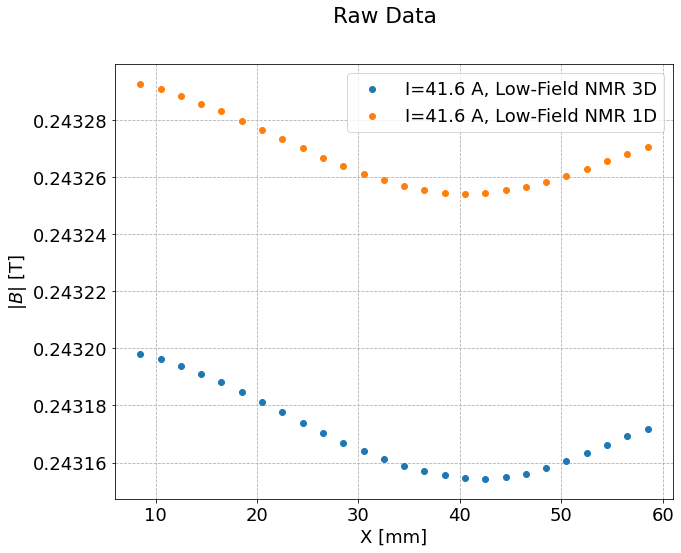

In [784]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, Low-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]'], label=f"I={I_1d:0.1f} A, Low-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

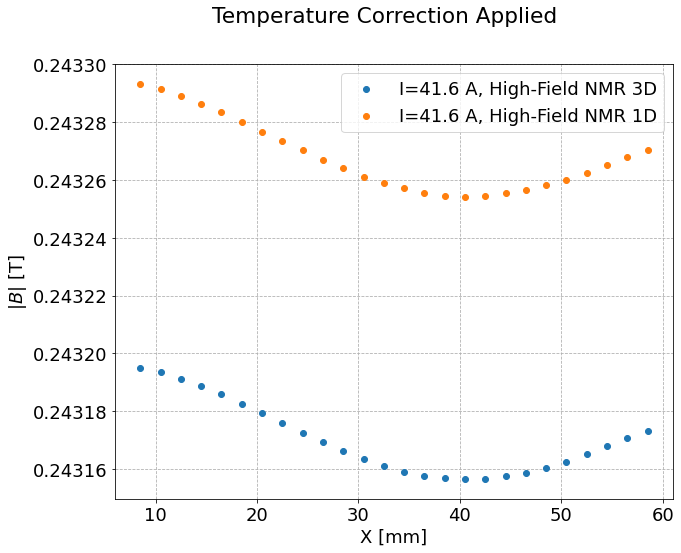

In [785]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr'], label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr'], label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [786]:
t0 = df.index[0]
tf = df.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

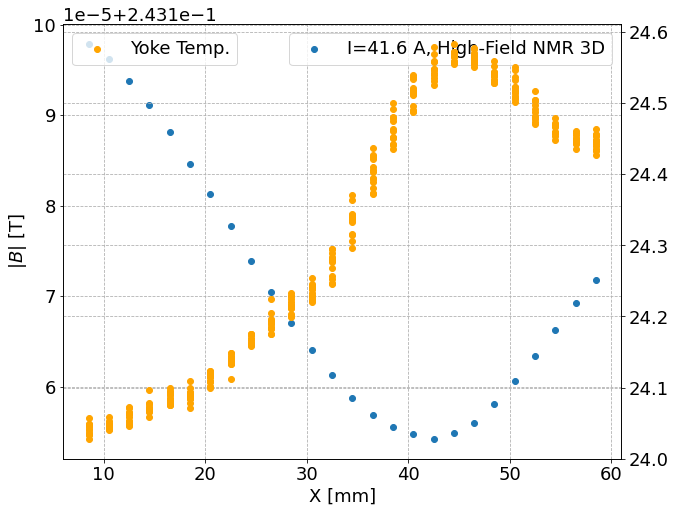

In [787]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={I:0.1f} A, High-Field NMR 3D")

# temperature
ax2 = ax.twinx()
ax2.scatter(df_temp_['magnet_X_mm'], df_temp_['Yoke (near pole)'], color='orange', label=f"Yoke Temp.")
           
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();
ax2.legend();

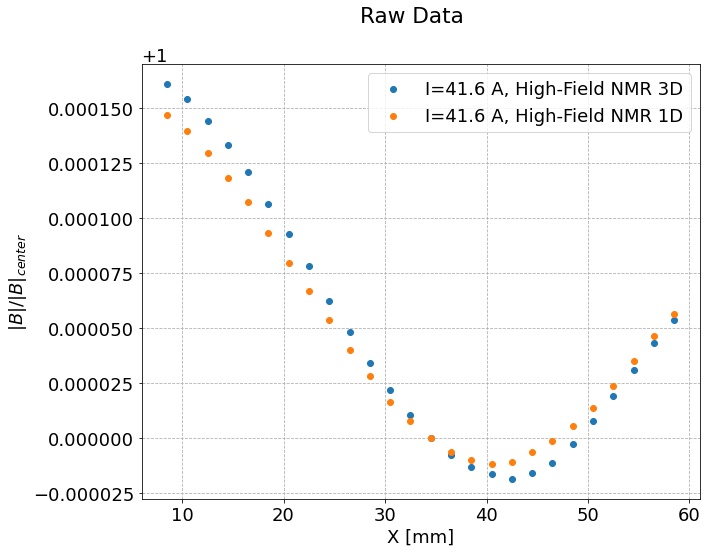

In [788]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['NMR [T]']/sf_1d, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

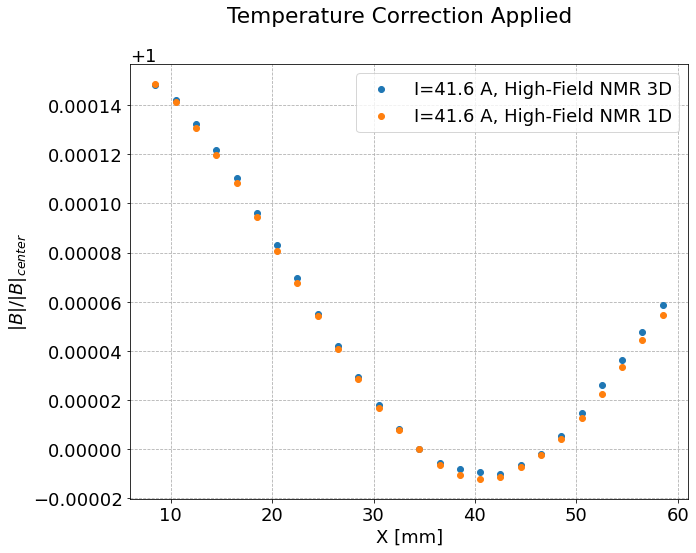

In [789]:
fig, ax = plt.subplots()

ax.scatter(df_line['magnet_X_mm'], df_line['B_corr']/sf_corr, label=f"I={I:0.1f} A, High-Field NMR 3D")
           
ax.scatter(df_1d['magnet_X_mm'], df_1d['B_corr']/sf_1d_corr, label=f"I={I_1d:0.1f} A, High-Field NMR 1D")

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [792]:
# B_ratio = B_Hall / B_NMR
Brs = []
for df_, sf in zip([df_line, df_1d], [sf_corr, sf_1d_corr]):
    df_ = df_[np.isclose(df_.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)].copy().iloc[0]
    Brs.append(sf / df_['B_corr'])
    print(Brs[-1])

0.9998676399517697
0.9998691279925007


In [793]:
Brs[1] - Brs[0]

1.4880407309680876e-06

- 10^-6

- Assess skew by looking at each x slice

In [ ]:
# no correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'NMR [T]')

In [ ]:
# temp correction
for xval in df['magnet_X_mm'].unique():
    fig, ax = plot_xplane(df, xval, 'B_corr')

# 1D Scans

- To add: an easy function(s) for doing the following processing:
    - Temperature interpolation
    - Temperature correction, where possible

In [1128]:
files = ['2022-05-26 100634.txt', # low NMR, 128 A, 400k
         '2022-05-26 102836.txt', # high NMR, 128 A, 400k
         '2022-05-26 113036.txt', # low NMR, 42 A, 130k
         '2022-05-26 121828.txt', # low NMR, 56 A, 175k
         '2022-05-26 123926.txt', # low NMR, 80 A, 250k
         '2022-05-26 130630.txt', # low NMR, 80 A, 250k (2)
         '2022-05-26 133558.txt', # low NMR, 80 A, 250k (3)
         '2022-05-26 140638.txt', # low NMR, 104 A, 325k
         '2022-05-26 144217.txt', # low NMR, 128 A, 400k
         '2022-05-26 150239.txt', # high NMR, 128 A, 400k
         '2022-05-26 153353.txt', # high NMR, 144 A, 450k
         '2022-05-26 160409.txt', # high NMR, 160 A, 500k
         '2022-05-26 163243.txt', # high NMR, 176 A, 550k
         '2022-05-26 170057.txt', # high NMR, 192 A, 600k
         '2022-05-26 173002.txt', # high NMR, 208 A, 650k
         '2022-05-26 175911.txt', # high NMR, 224 A, 700k
         '2022-05-26 182815.txt', # high NMR, 240 A, 750k
         '2022-05-26 190126.txt', # high NMR, 256 A, 800k
         '2022-05-26 193002.txt', # high NMR, 272 A, 850k -- index 18
         '2022-05-26 200005.txt', # high NMR, 288 A, 900k
         '2022-05-27 080822.txt', # high NMR, 288 A, 900k
         '2022-05-27 083743.txt', # high NMR, 300 A, 940k -- Power Supply Limit
         '2022-05-27 090821.txt', # high NMR, -300 A, -940k -- Power Supply Limit
         '2022-05-27 094135.txt', # low NMR, 42 A, 130k
         '2022-05-27 101134.txt', # low NMR, -42 A, 130k
         '2022-05-27 103216.txt', # low NMR, -42 A, 130k
         '2022-05-27 105803.txt', # low NMR, 42 A, 130k -- degaussed starting at higher field (600k)
         '2022-05-27 111726.txt', # low NMR, 42 A, 130k
         '2022-05-27 123838.txt', # low NMR, 42 A, 130k, enclosure set 45 C, actual 27.5 C
         '2022-05-27 125726.txt', # low NMR, 42 A, 130k, enclosure set 45 C, actual 28.8 C 
         '2022-05-27 132405.txt', # low NMR, -42 A, 130k -- better degauss, enclosure set 45 C, actual 30 C
         '2022-05-27 140740.txt', # high NMR, 272 A, 850k -- better degauss, enclosure set 45 C, actual ?? C, 0.5mm scan -- 31
         '2022-05-27 162535.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual 40 C -- 32
         '2022-05-27 171220.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual ?? C -- 33
         '2022-05-27 180522.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual ?? C, 0.5 mm scan -- 34
         '2022-05-28 165647.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual 45 C -- 35
         ## MISSING
         #'2022-06-01 094148.txt', # low NMR, 56 A, 175k, enclosure at 18 deg C
         '2022-06-01 101917.txt', # low NMR, 56 A, 175k, intentional saturation
         '2022-06-01 124915.txt', # low NMR, 80 A, 250k, intentional saturation
         '2022-06-01 131552.txt', # low NMR, 104 A, 325k, intentional saturation
         '2022-06-01 142807.txt', # low NMR, 42 A, 130k, intentional saturation -- 81 1D scans
         '2022-06-03 141648.txt', # low NMR, 42 A, 130k, right after changing temp from 18 deg C to 45 deg C -- 169 1D scans
         '2022-06-06 115947.txt', # low NMR, 42 A, 130k, after stabilized again at 18 deg C -- 4 1D scans
         '2022-06-06 145901.txt', # low NMR, 56 A, 175k, temp stable at 18 deg C -- 169 (did not finish all) 1D scans. Thomas ran standard degauss. See how shape changes in time.
         '2022-06-07 095924.txt', # low NMR, 56 A, 175k, temp stable at 15 deg C after cycle to 45 deg C back to 15 deg C -- 25 1D scans.
         '2022-06-07 173843.txt', # high NMR, 272 A, 850k, 169 1D scans, temp at 15 deg C
         '2022-06-08 135518.txt', # high NMR, 176 A, 550k, 169 1D scans, temp at 15 deg C -- should be ~1 T
        ]

nmr_low = [True,
           False,
           True,
           True,
           True,
           True,
           True,
           True,
           True,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           True,
           True,
           True,
           True,
           True,
           True,
           True,
           True,
           False,
           False,
           False,
           False,
           False,
           #True,
           True,
           True,
           True,
           True,
           True,
           True,
           True,
           True,
           False,
           False,
          ]

tempfiles = ['2022-05-26 093219slow.txt',
             '2022-05-31 085349slow.txt',
             '2022-06-06 115655slow.txt',
             '2022-06-07 095827slow.txt',
            ]

In [1129]:
len(files), len(nmr_low)

(46, 46)

In [1130]:
ddir_full = ddir+'temp_pole_to_pole_05-25-22/'

## Plots to Monitor

In [35]:
plt.rcParams.update({"text.usetex": False})

In [36]:
#df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time
# df_temp = load_data(ddir_full+tempfiles[1], low_NMR=True) # note low NMR changes based on time
#df_temp = load_data(ddir_full+tempfiles[2], low_NMR=True) # note low NMR changes based on time
df_temp = load_data(ddir_full+tempfiles[3], low_NMR=True) # note low NMR changes based on time

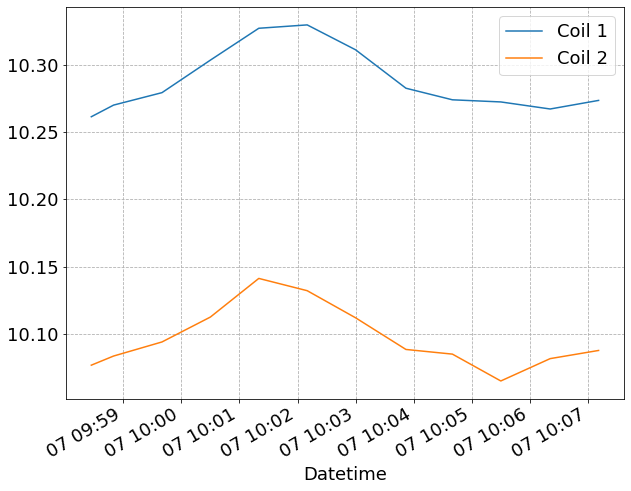

In [37]:
# coil temps
ax = df_temp[['Coil 1', 'Coil 2']].plot()
#ax = df_temp.query('Datetime > "2022-05-27 13:00"')[['Coil 1', 'Coil 2']].plot()

<AxesSubplot:label='307d4905-5169-4eea-b55b-663c15da64c7', xlabel='Datetime'>

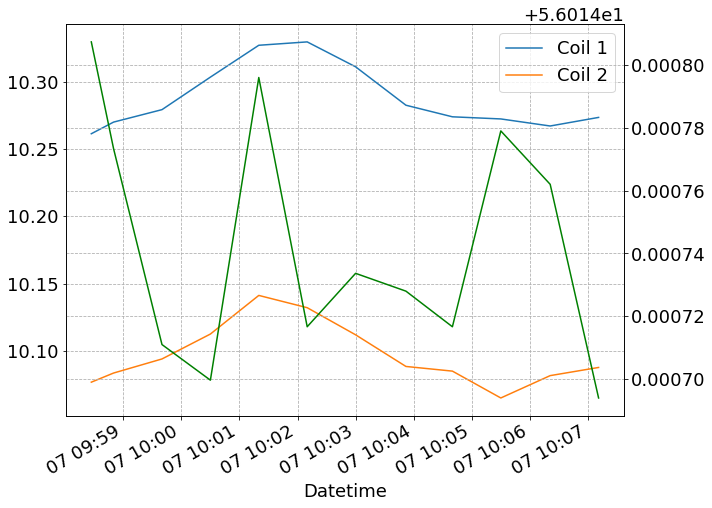

In [38]:
# coil temps, with magnet current on second y axis
ax = df_temp[['Coil 1', 'Coil 2']].plot()
ax2 = ax.twinx()
df_temp['Magnet Current [A]'].plot(ax=ax2, color='green')

In [39]:
df_temp['Magnet Current [A]']

Datetime
2022-06-07 09:58:27    56.014807
2022-06-07 09:58:50    56.014773
2022-06-07 09:59:40    56.014711
2022-06-07 10:00:30    56.014700
2022-06-07 10:01:20    56.014796
2022-06-07 10:02:10    56.014717
2022-06-07 10:03:00    56.014734
2022-06-07 10:03:52    56.014728
2022-06-07 10:04:40    56.014717
2022-06-07 10:05:30    56.014779
2022-06-07 10:06:21    56.014762
2022-06-07 10:07:11    56.014694
Name: Magnet Current [A], dtype: float64

In [40]:
# # current
# (abs(df_temp.query('abs(`Magnet Current [A]`) > 295')['Magnet Current [A]'])).plot()

<AxesSubplot:xlabel='Datetime'>

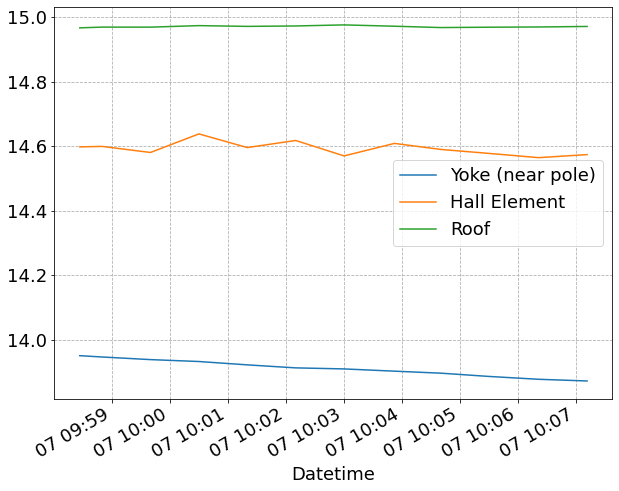

In [41]:
# yoke temp, hall probe temp
df_temp[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [42]:
for c in df_temp.columns:
    if "NW" in c:
        print(c)

NaN (NWC-R)
EvapCoil (NWC)
Return Magnet (NWC-R)
Chiller Exhaust (NW)
Supply Magnet (NWC-S)
NaN (NWC-S)


<AxesSubplot:xlabel='Datetime'>

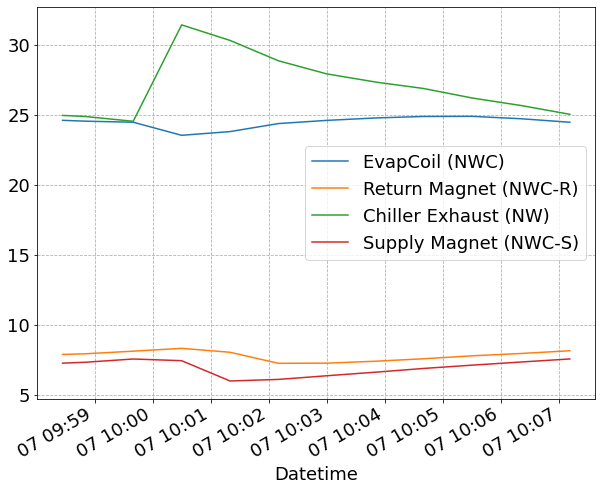

In [43]:
# chiller temps
df_temp[['EvapCoil (NWC)', 'Return Magnet (NWC-R)', 'Chiller Exhaust (NW)', 'Supply Magnet (NWC-S)']].plot()

<AxesSubplot:xlabel='Datetime'>

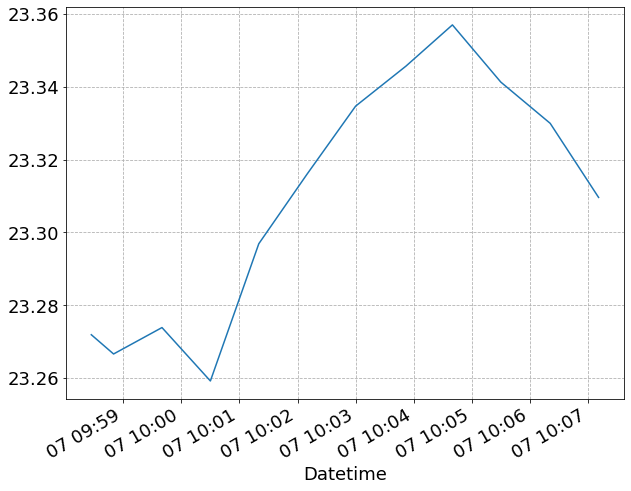

In [44]:
# ambient
df_temp['Desk Ambient'].plot()

In [45]:
df_temp.eval('dT = `Return Magnet (NWC-R)` - `Supply Magnet (NWC-S)`')['dT']

Datetime
2022-06-07 09:58:27    0.623081
2022-06-07 09:58:50    0.605697
2022-06-07 09:59:40    0.559558
2022-06-07 10:00:30    0.884195
2022-06-07 10:01:20    2.052752
2022-06-07 10:02:10    1.150789
2022-06-07 10:03:00    0.903026
2022-06-07 10:03:52    0.779196
2022-06-07 10:04:40    0.693776
2022-06-07 10:05:30    0.667410
2022-06-07 10:06:21    0.609751
2022-06-07 10:07:11    0.586249
Name: dT, dtype: float64

In [46]:
#m_rate_glycol = 6 * 3785.41 * 1.04 / 60 / 1e3 # gpm * density (converted to correct units)
m_rate_glycol = 6 * 3785.41 * 1.11 / 60 / 1e3 # gpm * density (converted to correct units)
Cp_glycol = 2.433 # kJ/kg/degC

In [47]:
#deltaT = 11.35
deltaT = df_temp.eval('dT = `Return Magnet (NWC-R)` - `Supply Magnet (NWC-S)`')['dT']

In [48]:
Q = m_rate_glycol * Cp_glycol * deltaT

In [49]:
Q # kW

Datetime
2022-06-07 09:58:27    0.636975
2022-06-07 09:58:50    0.619204
2022-06-07 09:59:40    0.572036
2022-06-07 10:00:30    0.903912
2022-06-07 10:01:20    2.098526
2022-06-07 10:02:10    1.176450
2022-06-07 10:03:00    0.923162
2022-06-07 10:03:52    0.796572
2022-06-07 10:04:40    0.709246
2022-06-07 10:05:30    0.682293
2022-06-07 10:06:21    0.623348
2022-06-07 10:07:11    0.599322
Name: dT, dtype: float64

In [50]:
m_rate_glycol*Cp_glycol

1.02229918083

- A good number to have around: ~0.958~ 1.02 * deltaT gives heat transfer from magnet to chiller.

## 128 A (05-26-22 09:41)
- Overlap region

In [ ]:
# remove first row of file
df_low = load_data(ddir_full+files[0], low_NMR=nmr_low[0]).iloc[1:].copy()
df_high = load_data(ddir_full+files[1], low_NMR=nmr_low[1]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
#df_high

In [ ]:
#df_low

In [ ]:
#df_temp

In [ ]:
I = df_low['Magnet Current [A]'].mean()
I_hi = df_high['Magnet Current [A]'].mean()

In [ ]:
I, I_hi

In [ ]:
#df_temp

In [ ]:
df_low.magnet_X_mm.unique()

In [ ]:
sf_low = df_low[np.isclose(df_low.magnet_X_mm, 34.49976562)].iloc[0]['NMR [T]']
sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-12)].iloc[0]['NMR [T]']

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I_hi:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
(df_low['NMR [T]'].values[:int(len(df_high)/2)] - df_high['NMR [T]'].values[2::2])

In [ ]:
len(df_low['NMR [T]'].values[:len(df_high)//2] - df_high['NMR [T]'].values[2::2])

In [ ]:
len(df_low)

In [ ]:
# delta field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'].values[:len(df_high)//2], df_low['NMR [T]'].values[:len(df_high)//2] - df_high['NMR [T]'].values[2::2], label=f'I={I:0.1f} A, (Low-Field NMR - High-Field NMR)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$\Delta |B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I_hi:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# add 3D data and old data

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I_hi:0.1f} A, High-Field NMR')
# 3D
I_l = df_line['Magnet Current [A]'].mean()
ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={I_l:0.1f} A, Low-Field NMR, 3D")
# old, high field nmr
I_o = df_old['Magnet Current [V]'].mean()
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]']/sf_old, label=f"I={I_o:0.1f} A, High-Field NMR - June 2021")           

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# with scale factor
fig, ax = plt.subplots()

# ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], label=f"I={df_line['Magnet Current [A]'].mean():0.1f} A, Low-Field NMR")
ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={df_line['Magnet Current [A]'].mean()} A, Low-Field NMR")

ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]']/sf_old, label=f"I={df_old['Magnet Current [V]'].mean():0.1f} A, High-Field NMR - June 2021")           

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 42 A (05-26-22 11:30)
- Start of monotonic increase

In [ ]:
# remove first row of file
df_low = load_data(ddir_full+files[2], low_NMR=nmr_low[2]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_low

In [ ]:
t0 = df_low.index[0]
tf = df_low.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
I = df_low['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_low.magnet_X_mm.unique()

In [ ]:
try:
    sf_low = df_low[np.isclose(df_low.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
except:
    sf_low = df_low.iloc[-1]['NMR [T]']

In [ ]:
sf_low

In [ ]:
B_ratio = sf_low / df_low[np.isclose(df_low.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 56 A (05-26-22 12:18)

In [ ]:
# remove first row of file
df_low = load_data(ddir_full+files[3], low_NMR=nmr_low[3]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_low

In [ ]:
t0 = df_low.index[0]
tf = df_low.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
I = df_low['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_low.magnet_X_mm.unique()

In [ ]:
try:
    sf_low = df_low[np.isclose(df_low.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_low = df_low.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_low

In [ ]:
B_ratio = sf_low / df_low[np.isclose(df_low.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 80 A (05-26-22 12:39, ...)

In [ ]:
# remove first row of file
df_low = load_data(ddir_full+files[4], low_NMR=nmr_low[4]).iloc[1:].copy()
df_low2 = load_data(ddir_full+files[5], low_NMR=nmr_low[5]).iloc[1:].copy()
df_low3 = load_data(ddir_full+files[6], low_NMR=nmr_low[6]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_low3

In [ ]:
#df_low

In [ ]:
t0 = df_low.index[0]
# tf = df_low.index[-1]
# tf = df_low2.index[-1]
tf = df_low3.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp_['Yoke (near pole)'].describe()

In [ ]:
df_temp_['Hall Element'].describe()

In [ ]:
I = df_low['Magnet Current [A]'].mean()
I2 = df_low2['Magnet Current [A]'].mean()
I3 = df_low3['Magnet Current [A]'].mean()

In [ ]:
I, I2, I3

In [ ]:
df_low.magnet_X_mm.unique()

In [ ]:
try:
    sf_low = df_low[np.isclose(df_low.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_low = df_low.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_low2 = df_low2[np.isclose(df_low2.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe (2)")
except:
    sf_low2 = df_low2.iloc[-1]['NMR [T]']
    print("No data at Hall probe! (2)")
try:
    sf_low3 = df_low3[np.isclose(df_low3.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe (3)")
except:
    sf_low3 = df_low3.iloc[-1]['NMR [T]']
    print("No data at Hall probe! (3)")

In [ ]:
sf_low, sf_low2, sf_low3

In [ ]:
B_ratio = sf_low / df_low[np.isclose(df_low.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio2 = sf_low2 / df_low2[np.isclose(df_low2.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio3 = sf_low3 / df_low3[np.isclose(df_low3.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio2, B_ratio3

In [ ]:
B_ratio-B_ratio2, B_ratio-B_ratio3, B_ratio2-B_ratio3

In [ ]:
Brs = np.array([B_ratio,B_ratio2,B_ratio3])

In [ ]:
np.std(Brs), np.std(Brs, ddof=1)

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR\nTrial 1\n(0 min from current changed)')
ax.scatter(df_low2['magnet_X_mm'], df_low2['NMR [T]'], label=f'I={I2:0.1f} A, Low-Field NMR\nTrial 2\n(30 min from current changed)')
ax.scatter(df_low3['magnet_X_mm'], df_low3['NMR [T]'], label=f'I={I3:0.1f} A, Low-Field NMR\nTrial 3\n(60 min from current changed)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR\nTrial 1\n(0 min from current changed)')
ax.scatter(df_low2['magnet_X_mm'], df_low2['NMR [T]']/sf_low2, label=f'I={I2:0.1f} A, Low-Field NMR\nTrial 2\n(30 min from current changed)')
ax.scatter(df_low3['magnet_X_mm'], df_low3['NMR [T]']/sf_low3, label=f'I={I3:0.1f} A, Low-Field NMR\nTrial 3\n(60 min from current changed)')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 104 A (05-26-22 14:06)

In [ ]:
# remove first row of file
df_low = load_data(ddir_full+files[7], low_NMR=nmr_low[7]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_low

In [ ]:
t0 = df_low.index[0]
tf = df_low.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
I = df_low['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_low.magnet_X_mm.unique()

In [ ]:
try:
    sf_low = df_low[np.isclose(df_low.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_low = df_low.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_low

In [ ]:
B_ratio = sf_low / df_low[np.isclose(df_low.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 128 A (05-26-22 14:42)
- Overlap region
- Low and high NMR
- Include results from this morning

In [ ]:
# remove first row of file
df_low = load_data(ddir_full+files[0], low_NMR=nmr_low[0]).iloc[1:].copy()
df_high = load_data(ddir_full+files[1], low_NMR=nmr_low[1]).iloc[1:].copy()
df_low2 = load_data(ddir_full+files[8], low_NMR=nmr_low[8]).iloc[1:].copy()
df_high2 = load_data(ddir_full+files[9], low_NMR=nmr_low[9]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high2.head()

In [ ]:
t0 = df_low.index[0]
# tf = df_low2.index[-1]
tf = df_high2.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
#df_temp_

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
I = df_low['Magnet Current [A]'].mean()
I_hi = df_high['Magnet Current [A]'].mean()
I2 = df_low2['Magnet Current [A]'].mean()
I_hi2 = df_high2['Magnet Current [A]'].mean()

In [ ]:
I, I_hi, I2, I_hi2

In [ ]:
df_low.magnet_X_mm.unique()

In [ ]:
try:
    sf_low = df_low[np.isclose(df_low.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_low = df_low.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_low2 = df_low2[np.isclose(df_low2.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_low2 = df_low2.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high2 = df_high2[np.isclose(df_high2.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high2 = df_high2.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_low, sf_high, sf_low2, sf_high2

In [ ]:
B_ratio = sf_low / df_low[np.isclose(df_low.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio_high = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio2 = sf_low2 / df_low2[np.isclose(df_low2.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio_high2 = sf_high2 / df_high2[np.isclose(df_high2.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio_high, B_ratio2, B_ratio_high2

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I_hi:0.1f} A, High-Field NMR')
ax.scatter(df_low2['magnet_X_mm'], df_low2['NMR [T]'], label=f'I={I2:0.1f} A, Low-Field NMR (afternoon)')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]'], label=f'I={I_hi2:0.1f} A, High-Field NMR (afternoon)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I_hi:0.1f} A, High-Field NMR')
ax.scatter(df_low2['magnet_X_mm'], df_low2['NMR [T]']/sf_low2, label=f'I={I2:0.1f} A, Low-Field NMR (afternoon)')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]']/sf_high2, label=f'I={I_hi2:0.1f} A, High-Field NMR (afternoon)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# add 3D data and old data

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_low['magnet_X_mm'], df_low['NMR [T]']/sf_low, label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I_hi:0.1f} A, High-Field NMR')
ax.scatter(df_low2['magnet_X_mm'], df_low2['NMR [T]']/sf_low2, label=f'I={I2:0.1f} A, Low-Field NMR (afternoon)')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]']/sf_high2, label=f'I={I_hi2:0.1f} A, High-Field NMR (afternoon)')
# 3D
I_l = df_line['Magnet Current [A]'].mean()
ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]']/sf, label=f"I={I_l:0.1f} A, Low-Field NMR, 3D")
# old, high field nmr
I_o = df_old['Magnet Current [V]'].mean()
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]']/sf_old, label=f"I={I_o:0.1f} A, High-Field NMR - June 2021")           

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 144 A (05-26-22 15:33)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[10], low_NMR=nmr_low[10]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp[['Coil 1', 'Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 160 A (05-26-22 16:04)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[11], low_NMR=nmr_low[11]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 176 A (05-26-22 16:33)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[12], low_NMR=nmr_low[12]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 192 A (05-26-22 17:00)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[13], low_NMR=nmr_low[13]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
from Zaber_Magnet_Convert_Jun21 import zaber_ADC_to_magnet_mm as zaber_ADC_to_magnet_mm_Jun21
old_files = ['2021-06-15 073806.txt', '2021-06-16 074548.txt']
df_old = load_data(ddir+old_files[0], low_NMR=False)
df_old2 = load_data(ddir+old_files[1], low_NMR=False)
df_old = df_old.query("191 < `Magnet Current [V]` < 193").copy()
df_old2 = df_old2.query("191 < `Magnet Current [V]` < 193").copy()
df_old3 = df_old2.query('Datetime > "2021-06-16 11:10"')
df_old2 = df_old2.query('Datetime < "2021-06-16 11:10"')
for i in ['X', 'Y', 'Z']:
    #df[f'magnet_{i}_mm'] = ADC_to_mm(df[f'Zaber_Meas_Encoder_{i}'].values, coord=i)
    df_old[f'magnet_{i}_mm'] = zaber_ADC_to_magnet_mm_Jun21(df_old[f'Zaber_Meas_Encoder_{i}'].values, coord=i, low_NMR=False)
    df_old2[f'magnet_{i}_mm'] = zaber_ADC_to_magnet_mm_Jun21(df_old2[f'Zaber_Meas_Encoder_{i}'].values, coord=i, low_NMR=False)
    df_old3[f'magnet_{i}_mm'] = zaber_ADC_to_magnet_mm_Jun21(df_old3[f'Zaber_Meas_Encoder_{i}'].values, coord=i, low_NMR=False)

In [ ]:
I_old = df_old['Magnet Current [V]'].mean()
I_old2 = df_old2['Magnet Current [V]'].mean()
I_old3 = df_old3['Magnet Current [V]'].mean()
I_old, I_old2, I_old3

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
df_old.magnet_X_mm.unique()

In [ ]:
sf_old = df_old[np.isclose(df_old.magnet_X_mm, 34.7, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_old2 = df_old2[np.isclose(df_old2.magnet_X_mm, 34.7, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
sf_old3 = df_old3[np.isclose(df_old3.magnet_X_mm, 34.7, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']

In [ ]:
sf_high, sf_old, sf_old2, sf_old3

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio_old = sf_old / df_old[np.isclose(df_old.magnet_X_mm, 12.97, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
B_ratio_old2 = sf_old2 / df_old2[np.isclose(df_old2.magnet_X_mm, 12.97, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']
B_ratio_old3 = sf_old3 / df_old3[np.isclose(df_old3.magnet_X_mm, 12.97, atol=1e-1, rtol=1e-2)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio_old, B_ratio_old2, B_ratio_old3

In [ ]:
np.std([B_ratio, B_ratio_old, B_ratio_old2, B_ratio_old3], ddof=1), np.std([B_ratio, B_ratio_old, B_ratio_old2, B_ratio_old3], ddof=0)

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]'], label=f'I={I_old:0.1f} A, High-Field NMR, 2021-06-15')
ax.scatter(df_old2['magnet_X_mm'], df_old2['NMR [T]'], label=f'I={I_old2:0.1f} A, High-Field NMR, 2021-06-16')
ax.scatter(df_old3['magnet_X_mm'], df_old3['NMR [T]'], label=f'I={I_old3:0.1f} A, High-Field NMR, 2021-06-16 (2)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]']/sf_old, label=f'I={I_old:0.1f} A, High-Field NMR, 2021-06-15')
ax.scatter(df_old2['magnet_X_mm'], df_old2['NMR [T]']/sf_old2, label=f'I={I_old2:0.1f} A, High-Field NMR, 2021-06-16')
ax.scatter(df_old3['magnet_X_mm'], df_old3['NMR [T]']/sf_old3, label=f'I={I_old3:0.1f} A, High-Field NMR, 2021-06-16 (2)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

- **FIXME! ADD IN PREVIOUS 192 A RESULTS**
- Did previous 1D, should also add previous 3D (with temperature corrections)

## 208 A (05-26-22 17:30)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[14], low_NMR=nmr_low[14]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 224 A (05-26-22 17:59)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[15], low_NMR=nmr_low[15]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 240 A (05-26-22 18:28)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[16], low_NMR=nmr_low[16]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 256 A (05-26-22 19:01)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[17], low_NMR=nmr_low[17]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 272 A (05-26-22 19:30)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[18], low_NMR=nmr_low[18]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 288 A (05-26-22 20:00, and 05-27-22 after long scan)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[19], low_NMR=nmr_low[19]).iloc[1:].copy()
df_high2 = load_data(ddir_full+files[20], low_NMR=nmr_low[20]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high2

In [ ]:
t0 = df_high.index[0]
tf = df_high2.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
I = df_high['Magnet Current [A]'].mean()
I2 = df_high2['Magnet Current [A]'].mean()

In [ ]:
I, I2

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high2 = df_high2[np.isclose(df_high2.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high2 = df_high2.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high, sf_high2

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio2 = sf_high2 / df_high2[np.isclose(df_high2.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio2

In [ ]:
B_ratio2 - B_ratio

In [ ]:
## field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]'], label=f'I={I2:0.1f} A, High-Field NMR (2)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]']/sf_high2, label=f'I={I2:0.1f} A, High-Field NMR (2)')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## $\pm$300 A (05-27-22 08:37, 09:08)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[21], low_NMR=nmr_low[21]).iloc[1:].copy()
df_high2 = load_data(ddir_full+files[22], low_NMR=nmr_low[22]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high2

In [ ]:
t0 = df_high.index[0]
tf = df_high2.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
I = df_high['Magnet Current [A]'].mean()
I2 = df_high2['Magnet Current [A]'].mean()

In [ ]:
I, I2

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high2 = df_high2[np.isclose(df_high2.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high2 = df_high2.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high, sf_high2

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio2 = sf_high2 / df_high2[np.isclose(df_high2.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio2

In [ ]:
B_ratio2 - B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]'], label=f'I={I2:0.1f} A, High-Field NMR (2)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]']/sf_high2, label=f'I={I2:0.1f} A, High-Field NMR (2)')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## $\pm$42 A (05-27-22 09:41, ...)
- +42
- -42
- -42
- +42 -- better degaussing started here!
- +42
- +42 (45 deg C) -- 27.5 deg C actual
- +42 (45 deg C) -- 28.8 deg C actual
- -42 (45 deg C) -- 30.3 deg C actual

- Repeating since we were at 940k, so Yoke is actively cooling very quickly.

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[23], low_NMR=nmr_low[23]).iloc[1:].copy()
df_high2 = load_data(ddir_full+files[24], low_NMR=nmr_low[24]).iloc[1:].copy()
df_high3 = load_data(ddir_full+files[25], low_NMR=nmr_low[25]).iloc[1:].copy()
df_high4 = load_data(ddir_full+files[26], low_NMR=nmr_low[26]).iloc[1:].copy()
df_high5 = load_data(ddir_full+files[27], low_NMR=nmr_low[27]).iloc[1:].copy()
df_high6 = load_data(ddir_full+files[28], low_NMR=nmr_low[28]).iloc[1:].copy()
df_high7 = load_data(ddir_full+files[29], low_NMR=nmr_low[29]).iloc[1:].copy()
df_high8 = load_data(ddir_full+files[30], low_NMR=nmr_low[30]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[0], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high8

In [ ]:
t0 = df_high.index[0]
tf = df_high7.index[-1]
# tf = df_high8.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
# chiller temps
df_temp[['EvapCoil (NWC)', 'Return Magnet (NWC-R)', 'Chiller Exhaust (NW)', 'Supply Magnet (NWC-S)']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
I = df_high['Magnet Current [A]'].mean()
I2 = df_high2['Magnet Current [A]'].mean()
I3 = df_high3['Magnet Current [A]'].mean()
I4 = df_high4['Magnet Current [A]'].mean()
I5 = df_high5['Magnet Current [A]'].mean()
I6 = df_high6['Magnet Current [A]'].mean()
I7 = df_high7['Magnet Current [A]'].mean()
I8 = df_high8['Magnet Current [A]'].mean()

In [ ]:
I, I2, I3, I4, I5, I6, I7, I8

In [ ]:
df_high8.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high2 = df_high2[np.isclose(df_high2.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high2 = df_high2.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high3 = df_high3[np.isclose(df_high3.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high3 = df_high3.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high4 = df_high4[np.isclose(df_high4.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high4 = df_high4.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high5 = df_high5[np.isclose(df_high5.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high5 = df_high5.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high6 = df_high6[np.isclose(df_high6.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high6 = df_high6.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high7 = df_high7[np.isclose(df_high7.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high7 = df_high7.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_high8 = df_high8[np.isclose(df_high8.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high8 = df_high8.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high, sf_high2, sf_high3, sf_high4, sf_high5, sf_high6, sf_high7, sf_high8

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio2 = sf_high2 / df_high2[np.isclose(df_high2.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio3 = sf_high3 / df_high3[np.isclose(df_high3.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio4 = sf_high4 / df_high4[np.isclose(df_high4.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio5 = sf_high5 / df_high5[np.isclose(df_high5.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio6 = sf_high6 / df_high6[np.isclose(df_high6.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio7 = sf_high7 / df_high7[np.isclose(df_high7.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio8 = sf_high8 / df_high8[np.isclose(df_high8.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio2, B_ratio3, B_ratio4, B_ratio5, B_ratio6, B_ratio7, B_ratio8

In [ ]:
B_ratio2 - B_ratio, B_ratio2 - B_ratio3, B_ratio-B_ratio3, B_ratio2 - B_ratio4, B_ratio-B_ratio4, B_ratio3-B_ratio4

In [ ]:
for B_r in [B_ratio, B_ratio2, B_ratio3, B_ratio4,]:
    print(B_ratio5-B_r)

In [ ]:
for B_r in [B_ratio, B_ratio2, B_ratio3, B_ratio4, B_ratio5]:
    print(B_ratio6-B_r)

In [ ]:
for B_r in [B_ratio, B_ratio2, B_ratio3, B_ratio4, B_ratio5, B_ratio6]:
    print(B_ratio7-B_r)

In [ ]:
for B_r in [B_ratio, B_ratio2, B_ratio3, B_ratio4, B_ratio5, B_ratio6, B_ratio7]:
    print(B_ratio8-B_r)

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]'], label=f'I={I2:0.1f} A, High-Field NMR (2)')
ax.scatter(df_high3['magnet_X_mm'], df_high3['NMR [T]'], label=f'I={I3:0.1f} A, High-Field NMR (3)')
ax.scatter(df_high4['magnet_X_mm'], df_high4['NMR [T]'], label=f'I={I4:0.1f} A, High-Field NMR (4)')
ax.scatter(df_high5['magnet_X_mm'], df_high5['NMR [T]'], label=f'I={I5:0.1f} A, High-Field NMR (5)')
ax.scatter(df_high6['magnet_X_mm'], df_high6['NMR [T]'], label=f'I={I6:0.1f} A, High-Field NMR, 45 deg C (6)')
ax.scatter(df_high7['magnet_X_mm'], df_high7['NMR [T]'], label=f'I={I7:0.1f} A, High-Field NMR, 45 deg C (7)')
ax.scatter(df_high8['magnet_X_mm'], df_high8['NMR [T]'], label=f'I={I8:0.1f} A, High-Field NMR, 45 deg C (8)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high2['magnet_X_mm'], df_high2['NMR [T]']/sf_high2, label=f'I={I2:0.1f} A, High-Field NMR (2)')
ax.scatter(df_high3['magnet_X_mm'], df_high3['NMR [T]']/sf_high3, label=f'I={I3:0.1f} A, High-Field NMR (3)')
ax.scatter(df_high4['magnet_X_mm'], df_high4['NMR [T]']/sf_high4, label=f'I={I4:0.1f} A, High-Field NMR (4)')
ax.scatter(df_high5['magnet_X_mm'], df_high5['NMR [T]']/sf_high5, label=f'I={I5:0.1f} A, High-Field NMR (5)')
ax.scatter(df_high6['magnet_X_mm'], df_high6['NMR [T]']/sf_high6, label=f'I={I6:0.1f} A, High-Field NMR, 45 deg C (6)')
ax.scatter(df_high7['magnet_X_mm'], df_high7['NMR [T]']/sf_high7, label=f'I={I7:0.1f} A, High-Field NMR, 45 deg C (7)')
ax.scatter(df_high8['magnet_X_mm'], df_high8['NMR [T]']/sf_high8, label=f'I={I8:0.1f} A, High-Field NMR, 45 deg C (8)')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

# Add Scans that I missed here.

## 56 A (06-01-22 09:41, repeated 4 times)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[36], low_NMR=nmr_low[36]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[37], low_NMR=nmr_low[37]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[1], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [ ]:
df_high

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlim([8, 13])
ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 80 A (06-01-22 12:49)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[37], low_NMR=nmr_low[37]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[38], low_NMR=nmr_low[38]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[1], low_NMR=True) # note low NMR changes based on time

df_old = load_data(ddir_full+files[6], low_NMR=nmr_low[6]).iloc[1:].copy()

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()
I_old = df_old['Magnet Current [A]'].mean()

In [ ]:
I, I_old

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_old = df_old[np.isclose(df_old.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_old = df_old.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high, sf_old

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio_old = sf_old / df_old[np.isclose(df_old.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio_old

In [ ]:
B_ratio - B_ratio_old

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR (06-01-22)')
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]'], label=f'I={I_old:0.1f} A, Low-Field NMR (05-26-22)')
# ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high, df_old]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [ ]:
#df_high.sf, df_old.sf

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, Low-Field NMR (06-01-22)')
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]']/sf_old, label=f'I={I_old:0.1f} A, Low-Field NMR (05-26-22)')
# ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 104 A (06-01-22 13:15)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[38], low_NMR=nmr_low[38]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[39], low_NMR=nmr_low[39]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[1], low_NMR=True) # note low NMR changes based on time

df_old = load_data(ddir_full+files[7], low_NMR=nmr_low[7]).iloc[1:].copy()

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()
I_old = df_old['Magnet Current [A]'].mean()

In [ ]:
I, I_old

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")
try:
    sf_old = df_old[np.isclose(df_old.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_old = df_old.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high, sf_old

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
B_ratio_old = sf_old / df_old[np.isclose(df_old.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio, B_ratio_old

In [ ]:
B_ratio - B_ratio_old

In [ ]:
# field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, Low-Field NMR (06-01-22)')
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]'], label=f'I={I_old:0.1f} A, Low-Field NMR (05-26-22)')
# ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high, df_old]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [ ]:
#df_high.sf, df_old.sf

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, Low-Field NMR (06-01-22)')
ax.scatter(df_old['magnet_X_mm'], df_old['NMR [T]']/sf_old, label=f'I={I_old:0.1f} A, Low-Field NMR (05-26-22)')
# ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

## 42 A (06-01-22 14:28, repeated 81 times)

In [794]:
# 3D results -- FIX ME! DO NOT HARD CODE!
# 18 deg C
Br_18C = 0.999869171648126
Br_45C = 0.9998676399517697

In [795]:
# remove first row of file
df_high = load_data(ddir_full+files[39], low_NMR=nmr_low[39]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[40], low_NMR=nmr_low[40]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[1], low_NMR=True) # note low NMR changes based on time

In [796]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-01 14:29:16,6/1/2022 2:29:16 PM,41.610934,4.906683,0.243278,0.0,426758.0,426427.0,1718663.0,426758.0,166702.34375,426427.0,166573.046875,1718663.0,671352.734375,69.0,0.019167,0.000799,8.499766,124.998386,125.001606
2022-06-01 14:29:45,6/1/2022 2:29:45 PM,41.610911,4.893453,0.243278,0.0,431878.0,426427.0,1718663.0,431878.0,168702.34375,426427.0,166573.046875,1718663.0,671352.734375,98.0,0.027222,0.001134,10.499766,124.998386,125.001606
2022-06-01 14:30:14,6/1/2022 2:30:14 PM,41.610968,4.882480,0.243277,0.0,436998.0,426427.0,1718663.0,436998.0,170702.34375,426427.0,166573.046875,1718663.0,671352.734375,127.0,0.035278,0.001470,12.499766,124.998386,125.001606
2022-06-01 14:30:42,6/1/2022 2:30:42 PM,41.610934,4.872038,0.243274,0.0,442118.0,426427.0,1718663.0,442118.0,172702.34375,426427.0,166573.046875,1718663.0,671352.734375,155.0,0.043056,0.001794,14.499766,124.998386,125.001606
2022-06-01 14:31:11,6/1/2022 2:31:11 PM,41.610974,4.861935,0.243271,0.0,447238.0,426427.0,1718663.0,447238.0,174702.34375,426427.0,166573.046875,1718663.0,671352.734375,184.0,0.051111,0.002130,16.499766,124.998386,125.001606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-02 08:29:18,6/2/2022 8:29:18 AM,41.611104,4.543232,0.243266,0.0,534278.0,426435.0,1718671.0,534278.0,208702.34375,426435.0,166576.171875,1718671.0,671355.859375,64871.0,18.019722,0.750822,50.499766,125.001511,124.998481
2022-06-02 08:29:47,6/2/2022 8:29:47 AM,41.611132,4.543503,0.243269,0.0,539398.0,426435.0,1718671.0,539398.0,210702.34375,426435.0,166576.171875,1718671.0,671355.859375,64900.0,18.027778,0.751157,52.499766,125.001511,124.998481
2022-06-02 08:30:17,6/2/2022 8:30:17 AM,41.611098,4.543827,0.243271,0.0,544518.0,426435.0,1718671.0,544518.0,212702.34375,426435.0,166576.171875,1718671.0,671355.859375,64930.0,18.036111,0.751505,54.499766,125.001511,124.998481


In [797]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [798]:
df_temp_

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-01 14:29:17,6/1/2022 2:29:17 PM,41.610906,4.905130,28.456163,26.595690,7.349061,11.615362,9.222315,11.884711,16.069298,...,426427.0,166573.046875,1718663.0,671352.734375,106527.0,29.590833,1.232951,8.499766,124.998386,125.001606
2022-06-01 14:34:17,6/1/2022 2:34:17 PM,41.610985,4.802030,23.722624,21.846518,6.762013,10.483254,8.871463,10.332519,16.134083,...,426427.0,166573.046875,1718663.0,671352.734375,106827.0,29.674167,1.236424,28.499766,124.998386,125.001606
2022-06-01 14:39:17,6/1/2022 2:39:17 PM,41.610974,4.728477,20.123548,18.414513,6.567806,9.763764,8.689837,9.390247,16.157484,...,426427.0,166573.046875,1718663.0,671352.734375,107127.0,29.757500,1.239896,48.499766,124.998386,125.001606
2022-06-01 14:44:15,6/1/2022 2:44:15 PM,41.611064,4.676643,17.449337,15.984291,6.383058,9.277965,8.528965,8.722462,16.150599,...,426428.0,166573.437500,1718663.0,671352.734375,107425.0,29.840278,1.243345,16.499766,124.998776,125.001606
2022-06-01 14:49:15,6/1/2022 2:49:15 PM,41.610951,4.639282,15.467099,14.239992,6.331230,8.998019,8.566814,8.340723,16.128082,...,426428.0,166573.437500,1718663.0,671352.734375,107725.0,29.923611,1.246817,36.499766,124.998776,125.001606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-02 08:09:15,6/2/2022 8:09:15 AM,41.610979,4.544113,9.999780,9.952164,6.320219,7.993270,8.214993,7.340102,13.707819,...,426434.0,166575.781250,1718671.0,671355.859375,170125.0,47.256944,1.969039,24.499766,125.001120,124.998481
2022-06-02 08:14:15,6/2/2022 8:14:15 AM,41.611087,4.543153,9.942002,9.895543,7.527113,8.630830,8.881601,8.103103,13.694902,...,426434.0,166575.781250,1718671.0,671355.859375,170425.0,47.340278,1.972512,44.499766,125.001120,124.998481
2022-06-02 08:19:17,6/2/2022 8:19:17 AM,41.611144,4.542822,9.944215,9.904412,6.789123,8.114002,8.287535,7.577062,13.705702,...,426435.0,166576.171875,1718671.0,671355.859375,170727.0,47.424167,1.976007,10.499766,125.001511,124.998481


<AxesSubplot:xlabel='Datetime'>

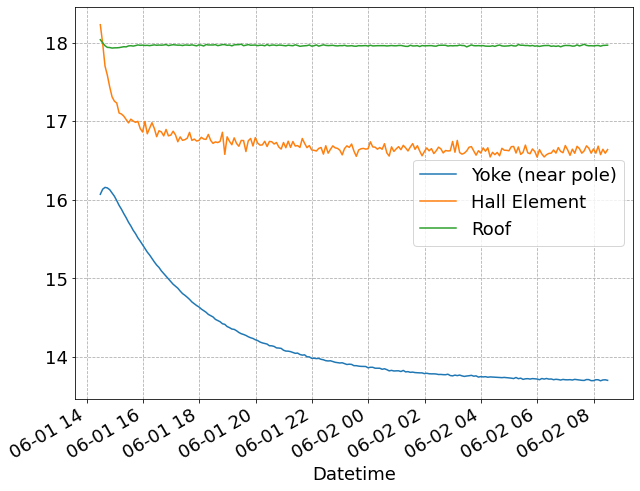

In [799]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [800]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

,Coil 1,Coil 2,LCW in Coil1,LCW in Coil 2,LCW out Coil 1,LCW out Coil 2
Datetime,,,,,,
2022-05-31 08:53:50,53.598553,48.794582,9.582423,12.142934,17.126587,18.377241
2022-05-31 08:54:15,53.584053,48.835541,8.598127,11.711463,16.629662,17.886822
2022-05-31 08:59:17,53.588772,48.812386,9.411251,12.096130,17.074732,18.304050
2022-05-31 09:04:17,53.532459,48.821934,9.849495,12.103517,17.138025,18.464584
2022-05-31 09:09:17,53.543072,48.799850,9.283876,11.728858,16.663483,18.047337
...,...,...,...,...,...,...
2022-06-06 04:09:18,13.351699,13.585005,7.224542,11.139754,8.444579,8.566462
2022-06-06 04:14:17,13.346740,13.568542,7.732899,11.268707,8.626739,8.824920
2022-06-06 04:19:18,13.338059,13.534105,7.232192,10.841520,8.198380,8.407866


In [801]:
df_temp_['Yoke (near pole)']

Datetime
2022-06-01 14:29:17    16.069298
2022-06-01 14:34:17    16.134083
2022-06-01 14:39:17    16.157484
2022-06-01 14:44:15    16.150599
2022-06-01 14:49:15    16.128082
                         ...    
2022-06-02 08:09:15    13.707819
2022-06-02 08:14:15    13.694902
2022-06-02 08:19:17    13.705702
2022-06-02 08:24:16    13.707544
2022-06-02 08:29:15    13.700508
Name: Yoke (near pole), Length: 217, dtype: float64

In [802]:
df_temp_['Hall Element']

Datetime
2022-06-01 14:29:17    18.228603
2022-06-01 14:34:17    17.990561
2022-06-01 14:39:17    17.701982
2022-06-01 14:44:15    17.585949
2022-06-01 14:49:15    17.437132
                         ...    
2022-06-02 08:09:15    16.682236
2022-06-02 08:14:15    16.574675
2022-06-02 08:19:17    16.642393
2022-06-02 08:24:16    16.591995
2022-06-02 08:29:15    16.639019
Name: Hall Element, Length: 217, dtype: float64

In [803]:
I = df_high['Magnet Current [A]'].mean()

In [804]:
I

41.611070742650526

In [805]:
df_high.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [806]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

Data at Hall probe


In [807]:
sf_high

0.243248408

In [808]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [809]:
B_ratio

0.9998844894637977

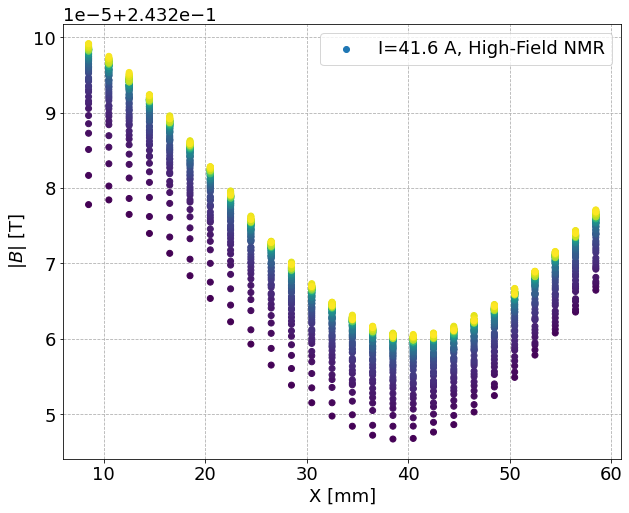

In [810]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [811]:
nl = True
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [812]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,sf,low_NMR
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-01 14:29:16,6/1/2022 2:29:16 PM,41.610934,4.906683,0.243278,0.0,426758.0,426427.0,1718663.0,426758.0,166702.34375,...,671352.734375,69.0,0.019167,0.000799,8.499766,124.998386,125.001606,0,0.243248,True
2022-06-01 14:29:45,6/1/2022 2:29:45 PM,41.610911,4.893453,0.243278,0.0,431878.0,426427.0,1718663.0,431878.0,168702.34375,...,671352.734375,98.0,0.027222,0.001134,10.499766,124.998386,125.001606,0,0.243248,True
2022-06-01 14:30:14,6/1/2022 2:30:14 PM,41.610968,4.882480,0.243277,0.0,436998.0,426427.0,1718663.0,436998.0,170702.34375,...,671352.734375,127.0,0.035278,0.001470,12.499766,124.998386,125.001606,0,0.243248,True
2022-06-01 14:30:42,6/1/2022 2:30:42 PM,41.610934,4.872038,0.243274,0.0,442118.0,426427.0,1718663.0,442118.0,172702.34375,...,671352.734375,155.0,0.043056,0.001794,14.499766,124.998386,125.001606,0,0.243248,True
2022-06-01 14:31:11,6/1/2022 2:31:11 PM,41.610974,4.861935,0.243271,0.0,447238.0,426427.0,1718663.0,447238.0,174702.34375,...,671352.734375,184.0,0.051111,0.002130,16.499766,124.998386,125.001606,0,0.243248,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-02 08:29:18,6/2/2022 8:29:18 AM,41.611104,4.543232,0.243266,0.0,534278.0,426435.0,1718671.0,534278.0,208702.34375,...,671355.859375,64871.0,18.019722,0.750822,50.499766,125.001511,124.998481,80,0.243263,True
2022-06-02 08:29:47,6/2/2022 8:29:47 AM,41.611132,4.543503,0.243269,0.0,539398.0,426435.0,1718671.0,539398.0,210702.34375,...,671355.859375,64900.0,18.027778,0.751157,52.499766,125.001511,124.998481,80,0.243263,True
2022-06-02 08:30:17,6/2/2022 8:30:17 AM,41.611098,4.543827,0.243271,0.0,544518.0,426435.0,1718671.0,544518.0,212702.34375,...,671355.859375,64930.0,18.036111,0.751505,54.499766,125.001511,124.998481,80,0.243263,True


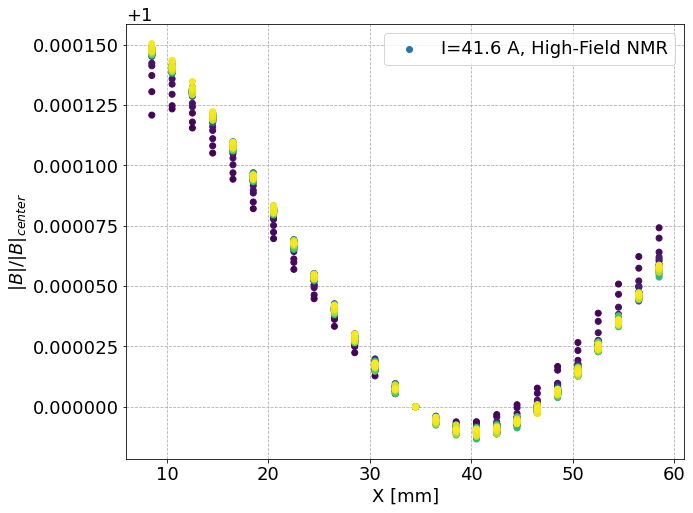

In [813]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

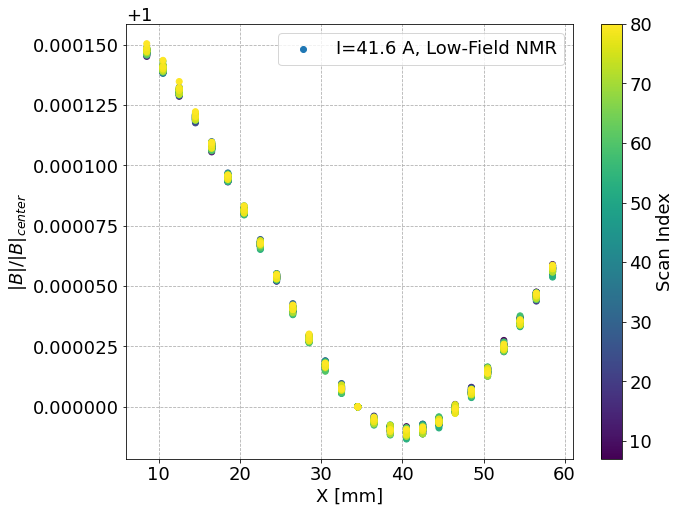

In [814]:
# cut on run number
rmin = 7
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
sc = ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')
cb = fig.colorbar(sc, label='Scan Index')

# ax.set_xlim([12, 13])
# ax.set_ylim([1.00012, 1.00015])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [815]:
# cut on run number
#rmin = 15
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
    Is.append(abs(df_["Magnet Current [A]"].mean()))
    Brs.append(df_.sf / df_['NMR [T]'])

In [816]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998693586096042, 9.44955512736464e-07)

In [817]:
# apply temperature correction

In [818]:
# redo delta time from first file
df_high['seconds_delta'] = (df_high.index - df_temp.index[0]).total_seconds()
df_high['hours_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/60**2
df_high['days_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/(24*60**2)
# temperature correction
B_corr = temp_correct(df_high, df_temp, tempcol="Yoke (near pole)")
# B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
df_high.loc[:, 'B_corr'] = B_corr
df_high.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
# recalculate scale factor
# find field value at Hall probe location
sf_corr_list = []
for r in df_high.run:
    try:
        sf = df_high[np.isclose(df_high.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_high.run == r)].iloc[0]['B_corr']
    except:
        sf = df_high[(df_high.run == r)].iloc[-1]['B_corr']
    sf_corr_list.append(sf)
df_high['sf_corr'] = sf_corr_list

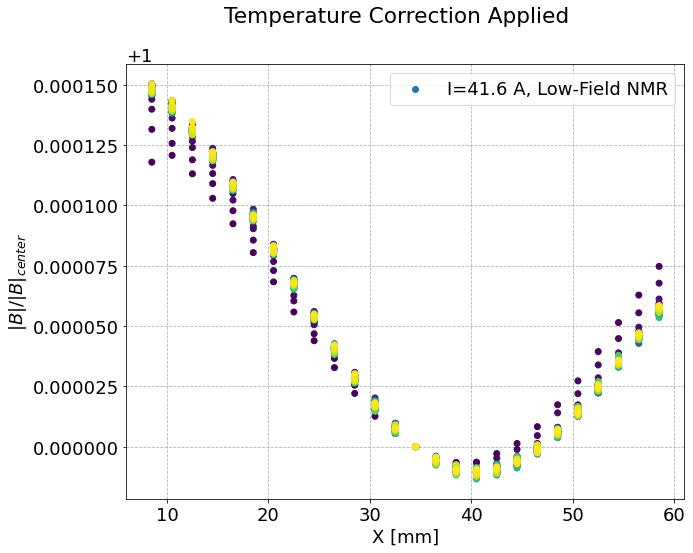

In [819]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['B_corr']/df_high['sf_corr'], c=range(len(df_high)), label=f'I={I:0.1f} A, Low-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

fig.suptitle('Temperature Correction Applied')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

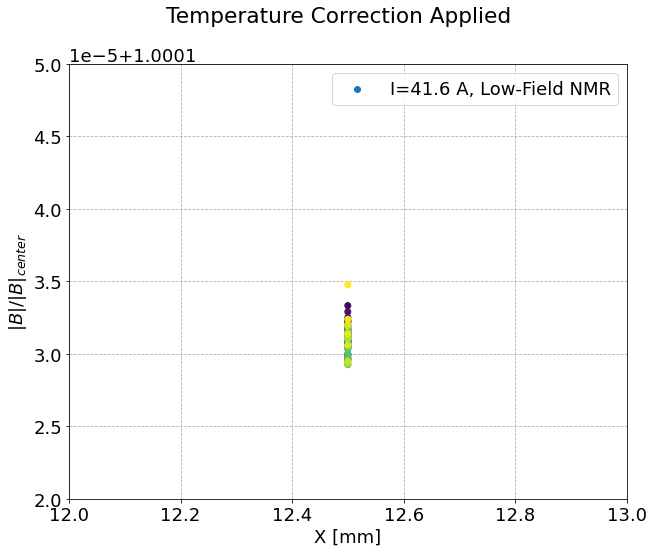

In [820]:
# cut on run number
rmin = 5
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/df_['sf_corr'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

fig.suptitle("Temperature Correction Applied")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [821]:
# cut on run number
# rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf_corr / df_['B_corr'])

In [822]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998689515384824, 9.833103699057721e-07)

In [823]:
# see results from 06-06-2022. Difference is ~6e-7
(0.9998686842586297, 1.2655729626129575e-06)

(0.9998686842586297, 1.2655729626129575e-06)

In [824]:
# see 81 scans above
(0.9998693586096042, 9.44955512736464e-07)

(0.9998693586096042, 9.44955512736464e-07)

In [825]:
np.mean(Brs) - 0.9998693586096042

-4.0707112181070926e-07

In [826]:
t0 = df_high.iloc[0].Time
tf = df_high.iloc[-1].Time

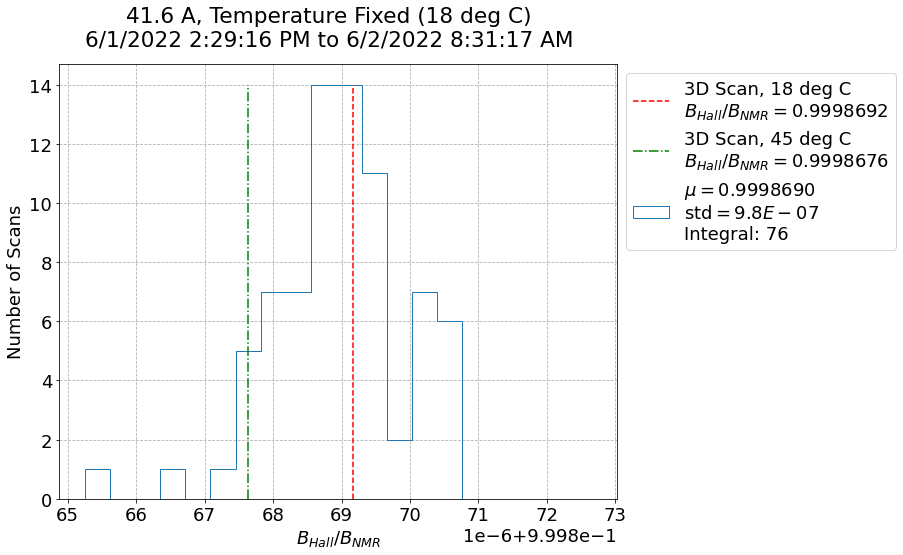

In [833]:
fig, ax = plt.subplots()

label_temp = r'$\mu = {0:.7f}$'+ '\n' + 'std' + r'$= {1:.1E}$' + '\n' +  'Integral: {2}'

n, bins, patches = ax.hist(Brs, bins=15, histtype='step', label=label_temp.format(np.mean(Brs), np.std(Brs, ddof=1), len(Brs)))

nmax = np.max(n)
ax.plot([Br_18C, Br_18C], [0, nmax], 'r--', label='3D Scan, 18 deg C\n' + r'$B_{Hall}/B_{NMR} = $' + f'{Br_18C:0.7f}')
ax.plot([Br_45C, Br_45C], [0, nmax], 'g-.', label='3D Scan, 45 deg C\n' + r'$B_{Hall}/B_{NMR} = $' + f'{Br_45C:0.7f}')

xme = np.mean(Brs)
xmi = np.min(Brs)
xma = np.max(Brs)
xli = np.max(np.abs([xme-xmi, xma-xme])) * 1.1

ax.set_xlim([xme-xli, xme+xli])

# ax.set_xlabel(r'$\frac{B_{Hall}}{B_{NMR}}$')
ax.set_xlabel(r'$B_{Hall}/B_{NMR}$')
ax.set_ylabel('Number of Scans')
fig.suptitle(f'{I:0.1f} A, Temperature Fixed (18 deg C)\n{t0} to {tf}')
ax.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0));

In [676]:
len(df_high.run.unique())

81

In [677]:
(169-154)*20 / 60

5.0

## 42 A (06-03-22 14:16, repeated 169 times)
- Started right as temperature changed from 18 deg C to 45 deg C.

In [834]:
# remove first row of file
df_high = load_data(ddir_full+files[40], low_NMR=nmr_low[40]).iloc[2:].copy()
# df_high = load_data(ddir_full+files[41], low_NMR=nmr_low[41]).iloc[2:].copy()
df_temp = load_data(ddir_full+tempfiles[1], low_NMR=True) # note low NMR changes based on time

In [835]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-03 14:17:40,6/3/2022 2:17:40 PM,41.611081,4.542043,0.243297,0.0,426758.0,426425.0,1718661.0,426758.0,166702.34375,426425.0,166572.265625,1718661.0,671351.953125,51.0,0.014167,0.000590,8.499766,124.997604,125.002387
2022-06-03 14:18:06,6/3/2022 2:18:06 PM,41.611008,4.542092,0.243295,0.0,431878.0,426425.0,1718661.0,431878.0,168702.34375,426425.0,166572.265625,1718661.0,671351.953125,77.0,0.021389,0.000891,10.499766,124.997604,125.002387
2022-06-03 14:18:30,6/3/2022 2:18:30 PM,41.610951,4.542212,0.243292,0.0,436998.0,426425.0,1718661.0,436998.0,170702.34375,426425.0,166572.265625,1718661.0,671351.953125,101.0,0.028056,0.001169,12.499766,124.997604,125.002387
2022-06-03 14:18:57,6/3/2022 2:18:57 PM,41.610957,4.542375,0.243290,0.0,442118.0,426425.0,1718661.0,442118.0,172702.34375,426425.0,166572.265625,1718661.0,671351.953125,128.0,0.035556,0.001481,14.499766,124.997604,125.002387
2022-06-03 14:19:23,6/3/2022 2:19:23 PM,41.610928,4.542605,0.243287,0.0,447238.0,426425.0,1718661.0,447238.0,174702.34375,426425.0,166572.265625,1718661.0,671351.953125,154.0,0.042778,0.001782,16.499766,124.997604,125.002387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-05 01:25:12,6/5/2022 1:25:12 AM,41.610996,4.565570,0.243163,0.0,529158.0,426431.0,1718673.0,529158.0,206702.34375,426431.0,166574.609375,1718673.0,671356.640625,126503.0,35.139722,1.464155,48.499766,124.999948,124.997699
2022-06-05 01:25:38,6/5/2022 1:25:38 AM,41.611161,4.565573,0.243165,0.0,534278.0,426431.0,1718673.0,534278.0,208702.34375,426431.0,166574.609375,1718673.0,671356.640625,126529.0,35.146944,1.464456,50.499766,124.999948,124.997699
2022-06-05 01:26:05,6/5/2022 1:26:05 AM,41.611127,4.565673,0.243168,0.0,539398.0,426431.0,1718673.0,539398.0,210702.34375,426431.0,166574.609375,1718673.0,671356.640625,126556.0,35.154444,1.464769,52.499766,124.999948,124.997699


In [836]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [837]:
df_temp_

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-03 14:19:16,6/3/2022 2:19:16 PM,41.610934,4.542535,10.056109,10.031517,7.405229,8.414696,8.849444,8.093436,13.792396,...,426425.0,166572.265625,1718661.0,671351.953125,278726.0,77.423889,3.225995,14.499766,124.997604,125.002387
2022-06-03 14:24:16,6/3/2022 2:24:16 PM,41.611013,4.542750,10.179929,10.220596,6.655686,7.806839,8.400919,7.576358,13.914824,...,426425.0,166572.265625,1718661.0,671351.953125,279026.0,77.507222,3.229468,40.499766,124.997604,125.002387
2022-06-03 14:29:17,6/3/2022 2:29:17 PM,41.610957,4.544907,10.405458,10.423629,6.884050,8.360292,8.911175,7.935039,14.031809,...,426426.0,166572.656250,1718661.0,671351.953125,279327.0,77.590833,3.232951,10.499766,124.997995,125.002387
2022-06-03 14:34:16,6/3/2022 2:34:16 PM,41.610951,4.544025,10.444425,10.481845,7.306394,8.416242,9.054841,8.141768,14.138937,...,426426.0,166572.656250,1718661.0,671351.953125,279626.0,77.673889,3.236412,34.499766,124.997995,125.002387
2022-06-03 14:39:17,6/3/2022 2:39:17 PM,41.611002,4.544572,10.589703,10.608345,6.607100,7.911695,8.509825,7.601831,14.249225,...,426426.0,166572.656250,1718661.0,671351.953125,279927.0,77.757500,3.239896,56.499766,124.997995,125.002387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-05 01:04:18,6/5/2022 1:04:18 AM,41.611149,4.565738,13.223273,13.429172,6.805789,8.628345,10.545779,8.335694,24.024301,...,426430.0,166574.218750,1718673.0,671356.640625,403828.0,112.174444,4.673935,8.499766,124.999558,124.997699
2022-06-05 01:09:18,6/5/2022 1:09:18 AM,41.611093,4.566688,13.259255,13.450965,6.426359,8.635644,10.471839,8.228183,24.037218,...,426430.0,166574.218750,1718673.0,671356.640625,404128.0,112.257778,4.677407,30.499766,124.999558,124.997699
2022-06-05 01:14:16,6/5/2022 1:14:16 AM,41.611138,4.566440,13.196836,13.427858,7.888470,9.455198,11.317027,9.183245,24.032677,...,426430.0,166574.218750,1718673.0,671356.640625,404426.0,112.340556,4.680856,54.499766,124.999558,124.997699


<AxesSubplot:xlabel='Datetime'>

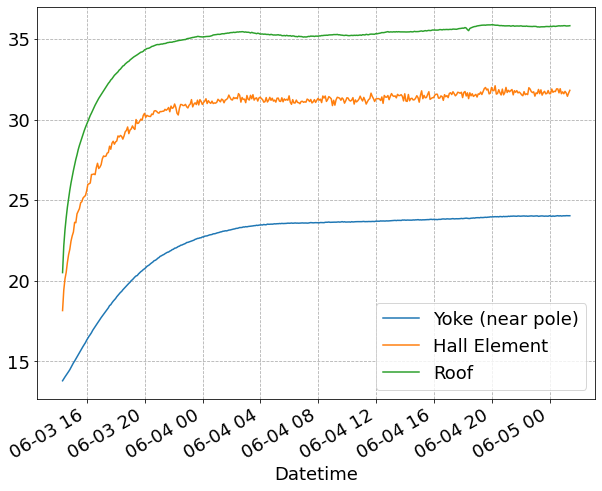

In [838]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [839]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

,Coil 1,Coil 2,LCW in Coil1,LCW in Coil 2,LCW out Coil 1,LCW out Coil 2
Datetime,,,,,,
2022-05-31 08:53:50,53.598553,48.794582,9.582423,12.142934,17.126587,18.377241
2022-05-31 08:54:15,53.584053,48.835541,8.598127,11.711463,16.629662,17.886822
2022-05-31 08:59:17,53.588772,48.812386,9.411251,12.096130,17.074732,18.304050
2022-05-31 09:04:17,53.532459,48.821934,9.849495,12.103517,17.138025,18.464584
2022-05-31 09:09:17,53.543072,48.799850,9.283876,11.728858,16.663483,18.047337
...,...,...,...,...,...,...
2022-06-06 04:09:18,13.351699,13.585005,7.224542,11.139754,8.444579,8.566462
2022-06-06 04:14:17,13.346740,13.568542,7.732899,11.268707,8.626739,8.824920
2022-06-06 04:19:18,13.338059,13.534105,7.232192,10.841520,8.198380,8.407866


In [840]:
df_temp_['Yoke (near pole)']

Datetime
2022-06-03 14:19:16    13.792396
2022-06-03 14:24:16    13.914824
2022-06-03 14:29:17    14.031809
2022-06-03 14:34:16    14.138937
2022-06-03 14:39:17    14.249225
                         ...    
2022-06-05 01:04:18    24.024301
2022-06-05 01:09:18    24.037218
2022-06-05 01:14:16    24.032677
2022-06-05 01:19:17    24.031792
2022-06-05 01:24:18    24.033680
Name: Yoke (near pole), Length: 422, dtype: float64

In [841]:
df_temp_['Hall Element']

Datetime
2022-06-03 14:19:16    18.148548
2022-06-03 14:24:16    19.411930
2022-06-03 14:29:17    20.111078
2022-06-03 14:34:16    20.513046
2022-06-03 14:39:17    21.133396
                         ...    
2022-06-05 01:04:18    31.750198
2022-06-05 01:09:18    31.646193
2022-06-05 01:14:16    31.442919
2022-06-05 01:19:17    31.644556
2022-06-05 01:24:18    31.813021
Name: Hall Element, Length: 422, dtype: float64

In [842]:
I = df_high['Magnet Current [A]'].mean()

In [843]:
I

41.61104953204956

In [844]:
df_high.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [845]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

Data at Hall probe


In [846]:
sf_high

0.243259732

In [847]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [848]:
B_ratio

0.9998663377075664

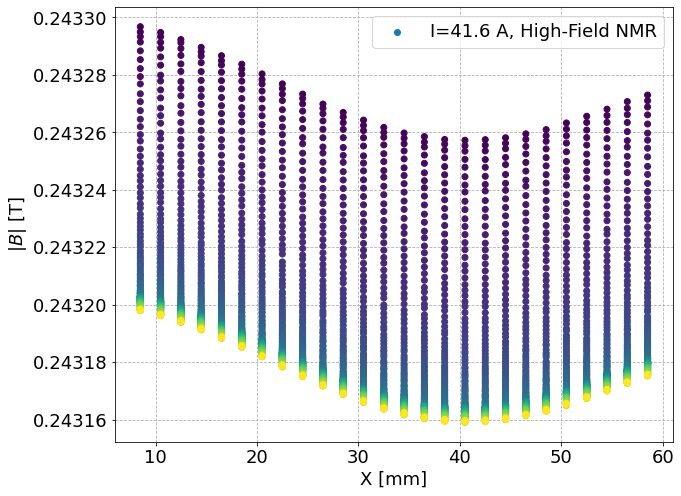

In [849]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [850]:
nl = True
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [851]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,sf,low_NMR
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-03 14:17:40,6/3/2022 2:17:40 PM,41.611081,4.542043,0.243297,0.0,426758.0,426425.0,1718661.0,426758.0,166702.34375,...,671351.953125,51.0,0.014167,0.000590,8.499766,124.997604,125.002387,0,0.243260,True
2022-06-03 14:18:06,6/3/2022 2:18:06 PM,41.611008,4.542092,0.243295,0.0,431878.0,426425.0,1718661.0,431878.0,168702.34375,...,671351.953125,77.0,0.021389,0.000891,10.499766,124.997604,125.002387,0,0.243260,True
2022-06-03 14:18:30,6/3/2022 2:18:30 PM,41.610951,4.542212,0.243292,0.0,436998.0,426425.0,1718661.0,436998.0,170702.34375,...,671351.953125,101.0,0.028056,0.001169,12.499766,124.997604,125.002387,0,0.243260,True
2022-06-03 14:18:57,6/3/2022 2:18:57 PM,41.610957,4.542375,0.243290,0.0,442118.0,426425.0,1718661.0,442118.0,172702.34375,...,671351.953125,128.0,0.035556,0.001481,14.499766,124.997604,125.002387,0,0.243260,True
2022-06-03 14:19:23,6/3/2022 2:19:23 PM,41.610928,4.542605,0.243287,0.0,447238.0,426425.0,1718661.0,447238.0,174702.34375,...,671351.953125,154.0,0.042778,0.001782,16.499766,124.997604,125.002387,0,0.243260,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-05 01:25:12,6/5/2022 1:25:12 AM,41.610996,4.565570,0.243163,0.0,529158.0,426431.0,1718673.0,529158.0,206702.34375,...,671356.640625,126503.0,35.139722,1.464155,48.499766,124.999948,124.997699,162,0.243162,True
2022-06-05 01:25:38,6/5/2022 1:25:38 AM,41.611161,4.565573,0.243165,0.0,534278.0,426431.0,1718673.0,534278.0,208702.34375,...,671356.640625,126529.0,35.146944,1.464456,50.499766,124.999948,124.997699,162,0.243162,True
2022-06-05 01:26:05,6/5/2022 1:26:05 AM,41.611127,4.565673,0.243168,0.0,539398.0,426431.0,1718673.0,539398.0,210702.34375,...,671356.640625,126556.0,35.154444,1.464769,52.499766,124.999948,124.997699,162,0.243162,True


In [852]:
df_high.run.unique()

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162])

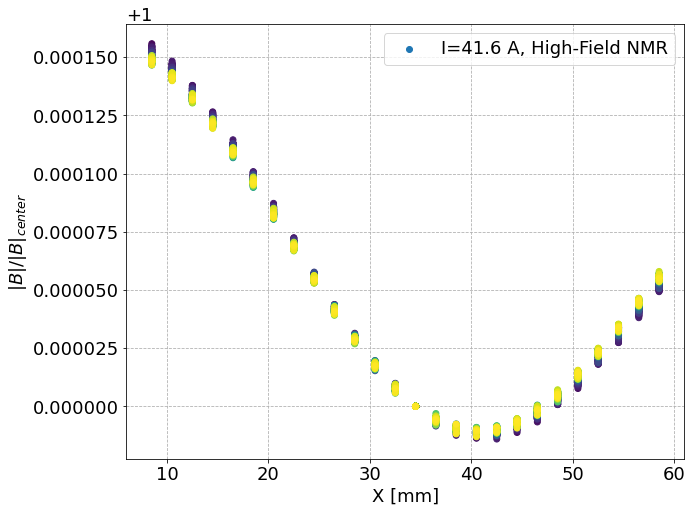

In [853]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

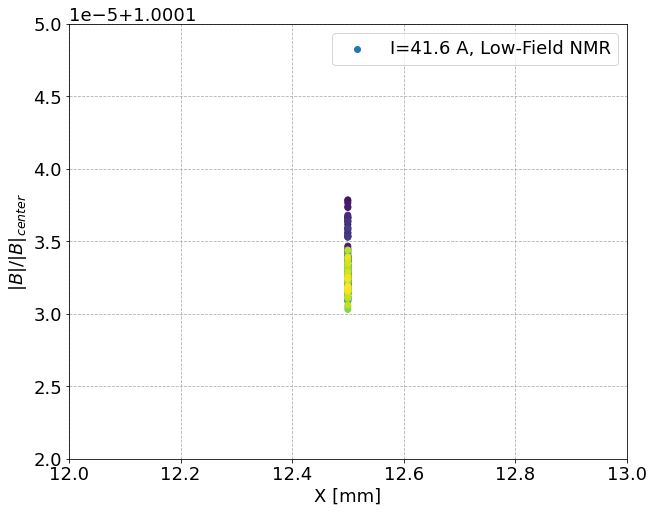

In [854]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [855]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf / df_['NMR [T]'])

In [856]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998668988253473, 1.6700980233414405e-06)

In [857]:
# see 81 scans above
# (0.9998693586096042, 9.44955512736464e-07)
(0.9998689515384824, 9.833103699057721e-07)

(0.9998689515384824, 9.833103699057721e-07)

In [858]:
np.mean(Brs) - 0.9998693586096042

-2.4597842569473727e-06

In [859]:
np.mean(Brs) - 0.9998689515384824

-2.0527131351366634e-06

In [860]:
# apply temperature correction

In [861]:
# redo delta time from first file
df_high['seconds_delta'] = (df_high.index - df_temp.index[0]).total_seconds()
df_high['hours_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/60**2
df_high['days_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/(24*60**2)
# temperature correction
B_corr = temp_correct(df_high, df_temp, tempcol="Yoke (near pole)")
# B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
df_high.loc[:, 'B_corr'] = B_corr
df_high.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
# recalculate scale factor
# find field value at Hall probe location
sf_corr_list = []
for r in df_high.run:
    try:
        sf = df_high[np.isclose(df_high.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_high.run == r)].iloc[0]['B_corr']
    except:
        sf = df_high[(df_high.run == r)].iloc[-1]['B_corr']
    sf_corr_list.append(sf)
df_high['sf_corr'] = sf_corr_list

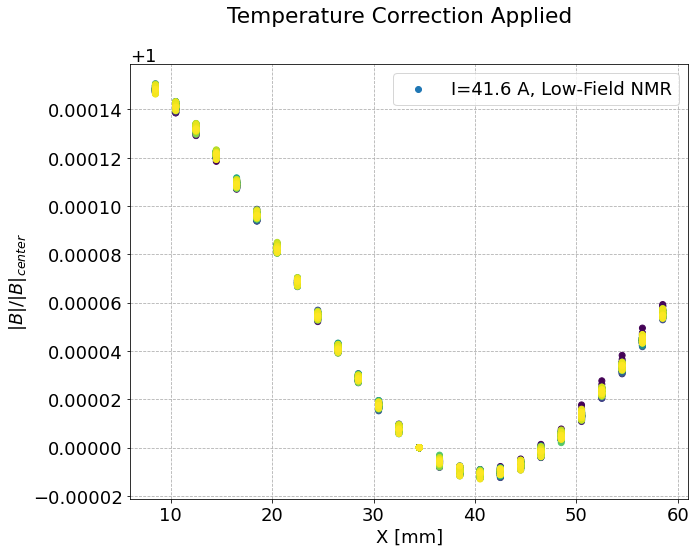

In [862]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['B_corr']/df_high['sf_corr'], c=range(len(df_high)), label=f'I={I:0.1f} A, Low-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

fig.suptitle('Temperature Correction Applied')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

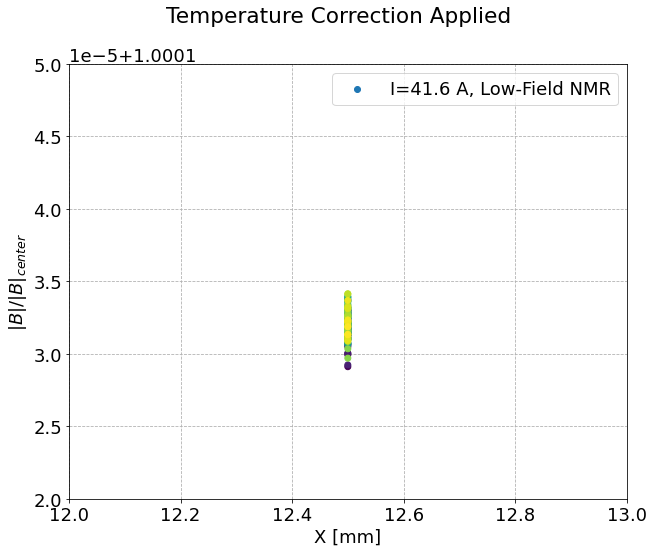

In [863]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/df_['sf_corr'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

fig.suptitle("Temperature Correction Applied")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [864]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf_corr / df_['B_corr'])

In [865]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998680215827672, 9.376407891284339e-07)

In [866]:
# see results from 06-06-2022. Difference is ~6e-7
(0.9998686842586297, 1.2655729626129575e-06)

(0.9998686842586297, 1.2655729626129575e-06)

In [867]:
# see 81 scans above
# (0.9998693586096042, 9.44955512736464e-07)
(0.9998689515384824, 9.833103699057721e-07)

(0.9998689515384824, 9.833103699057721e-07)

In [868]:
np.mean(Brs) - 0.9998693586096042

-1.3370268370227478e-06

In [869]:
np.mean(Brs) - 0.9998689515384824

-9.299557152120386e-07

In [870]:
t0 = df_high.iloc[0].Time
tf = df_high.iloc[-1].Time

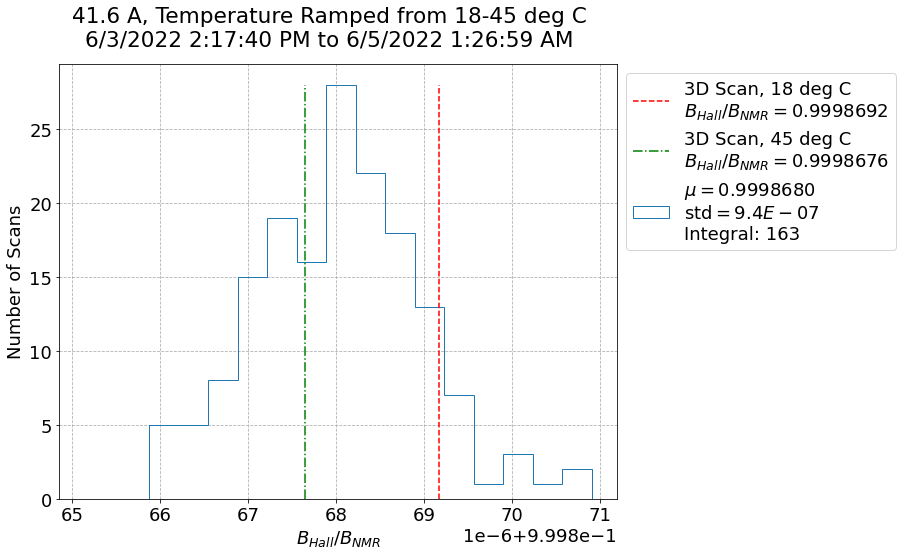

In [871]:
fig, ax = plt.subplots()

label_temp = r'$\mu = {0:.7f}$'+ '\n' + 'std' + r'$= {1:.1E}$' + '\n' +  'Integral: {2}'

n, bins, patches = ax.hist(Brs, bins=15, histtype='step', label=label_temp.format(np.mean(Brs), np.std(Brs, ddof=1), len(Brs)))

nmax = np.max(n)
ax.plot([Br_18C, Br_18C], [0, nmax], 'r--', label='3D Scan, 18 deg C\n' + r'$B_{Hall}/B_{NMR} = $' + f'{Br_18C:0.7f}')
ax.plot([Br_45C, Br_45C], [0, nmax], 'g-.', label='3D Scan, 45 deg C\n' + r'$B_{Hall}/B_{NMR} = $' + f'{Br_45C:0.7f}')

xme = np.mean(Brs)
xmi = np.min(Brs)
xma = np.max(Brs)
xli = np.max(np.abs([xme-xmi, xma-xme])) * 1.1

ax.set_xlim([xme-xli, xme+xli])

# ax.set_xlabel(r'$\frac{B_{Hall}}{B_{NMR}}$')
ax.set_xlabel(r'$B_{Hall}/B_{NMR}$')
ax.set_ylabel('Number of Scans')
fig.suptitle(f'{I:0.1f} A, Temperature Ramped from 18-45 deg C\n{t0} to {tf}')
# ax.legend();
ax.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0));

In [567]:
len(df_high.run.unique())

163

In [568]:
(169-154)*20 / 60

5.0

## 42 A (06-06-22 11:59, repeated 4 times)
- Enclosure cooled down to 18 deg C again. Current setting did not change since Wednesday. Want to confirm still getting the same number (after waiting for equilibrium)

In [ ]:
# remove first row of file
df_high = load_data(ddir_full+files[41], low_NMR=nmr_low[41]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[42], low_NMR=nmr_low[42]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[2], low_NMR=True) # note low NMR changes based on time

In [ ]:
df_high

In [ ]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [ ]:
df_temp_

In [ ]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [ ]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

In [ ]:
df_temp_['Yoke (near pole)']

In [ ]:
df_temp_['Hall Element']

In [ ]:
I = df_high['Magnet Current [A]'].mean()

In [ ]:
I

In [ ]:
df_high.magnet_X_mm.unique()

In [ ]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

In [ ]:
sf_high

In [ ]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [ ]:
B_ratio

In [ ]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
nl = True
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [ ]:
df_high

In [ ]:
df_high.run.unique()

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf / df_['NMR [T]'])

In [ ]:
np.mean(Brs), np.std(Brs, ddof=1)

In [ ]:
# apply temperature correction

In [ ]:
# redo delta time from first file
df_high['seconds_delta'] = (df_high.index - df_temp.index[0]).total_seconds()
df_high['hours_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/60**2
df_high['days_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/(24*60**2)
# temperature correction
B_corr = temp_correct(df_high, df_temp, tempcol="Yoke (near pole)")
# B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
df_high.loc[:, 'B_corr'] = B_corr
df_high.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
# recalculate scale factor
# find field value at Hall probe location
sf_corr_list = []
for r in df_high.run:
    try:
        sf = df_high[np.isclose(df_high.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_high.run == r)].iloc[0]['B_corr']
    except:
        sf = df_high[(df_high.run == r)].iloc[-1]['B_corr']
    sf_corr_list.append(sf)
df_high['sf_corr'] = sf_corr_list

In [ ]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['B_corr']/df_high['sf_corr'], c=range(len(df_high)), label=f'I={I:0.1f} A, Low-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

fig.suptitle('Temperature Correction Applied')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/df_['sf_corr'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

fig.suptitle("Temperature Correction Applied")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [ ]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf_corr / df_['B_corr'])

In [ ]:
np.mean(Brs), np.std(Brs, ddof=1)

In [ ]:
t0 = df_high.iloc[0].Time
tf = df_high.iloc[-1].Time

In [ ]:
fig, ax = plt.subplots()

label_temp = r'$\mu = {0:.3E}$'+ '\n' + 'std' + r'$= {1:.3E}$' + '\n' +  'Integral: {2}'

ax.hist(Brs, bins=15, histtype='step', label=label_temp.format(np.mean(Brs), np.std(Brs, ddof=1), len(Brs)))

# ax.set_xlabel(r'$\frac{B_{Hall}}{B_{NMR}}$')
ax.set_xlabel(r'$B_{Hall}/B_{NMR}$')
ax.set_ylabel('Number of Scans')
fig.suptitle(f'{I:0.1f} A, Temperature Ramped from 18-45 deg C\n{t0} to {tf}')
ax.legend();

In [ ]:
len(df_high.run.unique())

In [ ]:
(169-154)*20 / 60

## 56 A (06-06-22 14:59, repeated 169 times)
- Enclosure cooled down to 18 deg C again. Current setting changed using standard degaussing. Look at any time dependence.

In [451]:
# remove first row of file
df_high = load_data(ddir_full+files[42], low_NMR=nmr_low[42]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[43], low_NMR=nmr_low[43]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[2], low_NMR=True) # note low NMR changes based on time

In [452]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-06 14:59:45,6/6/2022 2:59:45 PM,56.014813,6.139572,0.324103,0.0,426758.0,426425.0,1718661.0,426758.0,166702.34375,426425.0,166572.265625,1718661.0,671351.953125,44.0,0.012222,0.000509,8.499766,124.997604,125.002387
2022-06-06 15:00:14,6/6/2022 3:00:14 PM,56.014830,6.139173,0.324103,0.0,431878.0,426425.0,1718661.0,431878.0,168702.34375,426425.0,166572.265625,1718661.0,671351.953125,73.0,0.020278,0.000845,10.499766,124.997604,125.002387
2022-06-06 15:00:39,6/6/2022 3:00:39 PM,56.014802,6.138940,0.324101,0.0,436998.0,426425.0,1718661.0,436998.0,170702.34375,426425.0,166572.265625,1718661.0,671351.953125,98.0,0.027222,0.001134,12.499766,124.997604,125.002387
2022-06-06 15:01:06,6/6/2022 3:01:06 PM,56.014717,6.138737,0.324098,0.0,442118.0,426425.0,1718661.0,442118.0,172702.34375,426425.0,166572.265625,1718661.0,671351.953125,125.0,0.034722,0.001447,14.499766,124.997604,125.002387
2022-06-06 15:01:31,6/6/2022 3:01:31 PM,56.014688,6.138672,0.324094,0.0,447238.0,426425.0,1718661.0,447238.0,174702.34375,426425.0,166572.265625,1718661.0,671351.953125,150.0,0.041667,0.001736,16.499766,124.997604,125.002387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-06 22:39:09,6/6/2022 10:39:09 PM,56.014711,6.134498,0.324071,0.0,534278.0,426435.0,1718663.0,534278.0,208702.34375,426435.0,166576.171875,1718663.0,671352.734375,27608.0,7.668889,0.319537,50.499766,125.001511,125.001606
2022-06-06 22:39:35,6/6/2022 10:39:35 PM,56.014768,6.134463,0.324074,0.0,539398.0,426435.0,1718663.0,539398.0,210702.34375,426435.0,166576.171875,1718663.0,671352.734375,27634.0,7.676111,0.319838,52.499766,125.001511,125.001606
2022-06-06 22:40:04,6/6/2022 10:40:04 PM,56.014807,6.134527,0.324077,0.0,544518.0,426435.0,1718663.0,544518.0,212702.34375,426435.0,166576.171875,1718663.0,671352.734375,27663.0,7.684167,0.320174,54.499766,125.001511,125.001606


In [329]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [88]:
df_temp_

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-06 15:02:19,6/6/2022 3:02:19 PM,56.014802,6.138777,10.810363,10.669109,7.358393,7.906373,8.731798,7.966737,14.178476,...,426425.0,166572.265625,1718661.0,671351.953125,11123.0,3.089722,0.128738,20.499766,124.997604,125.002387
2022-06-06 15:07:20,6/6/2022 3:07:20 PM,56.014779,6.137262,10.773663,10.640029,6.713778,7.374103,8.221843,7.467579,14.177300,...,426425.0,166572.265625,1718661.0,671351.953125,11424.0,3.173333,0.132222,42.499766,124.997604,125.002387
2022-06-06 15:12:19,6/6/2022 3:12:19 PM,56.014847,6.138375,10.811949,10.664135,6.301698,7.197683,8.202567,7.250033,14.172086,...,426426.0,166572.656250,1718661.0,671351.953125,11723.0,3.256389,0.135683,12.499766,124.997995,125.002387
2022-06-06 15:17:20,6/6/2022 3:17:20 PM,56.014734,6.136802,10.741370,10.588606,7.544369,8.051111,8.871874,8.096900,14.155973,...,426426.0,166572.656250,1718661.0,671351.953125,12024.0,3.340000,0.139167,34.499766,124.997995,125.002387
2022-06-06 15:22:20,6/6/2022 3:22:20 PM,56.014785,6.135657,10.727721,10.556452,6.925715,7.523122,8.378199,7.592479,14.156894,...,426426.0,166572.656250,1718661.0,671351.953125,12324.0,3.423333,0.142639,56.499766,124.997995,125.002387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-06 22:17:19,6/6/2022 10:17:19 PM,56.014807,6.134608,10.668130,10.522634,6.908736,7.521675,8.381642,7.456702,13.874544,...,426434.0,166575.781250,1718663.0,671352.734375,37223.0,10.339722,0.430822,10.499766,125.001120,125.001606
2022-06-06 22:22:19,6/6/2022 10:22:19 PM,56.014705,6.136017,10.725195,10.592111,6.249265,7.074089,8.047530,6.981738,13.884403,...,426434.0,166575.781250,1718663.0,671352.734375,37523.0,10.423056,0.434294,30.499766,125.001120,125.001606
2022-06-06 22:27:20,6/6/2022 10:27:20 PM,56.014751,6.135628,10.678372,10.548971,7.669898,8.149929,8.930728,8.051444,13.876563,...,426434.0,166575.781250,1718663.0,671352.734375,37824.0,10.506667,0.437778,50.499766,125.001120,125.001606


<AxesSubplot:xlabel='Datetime'>

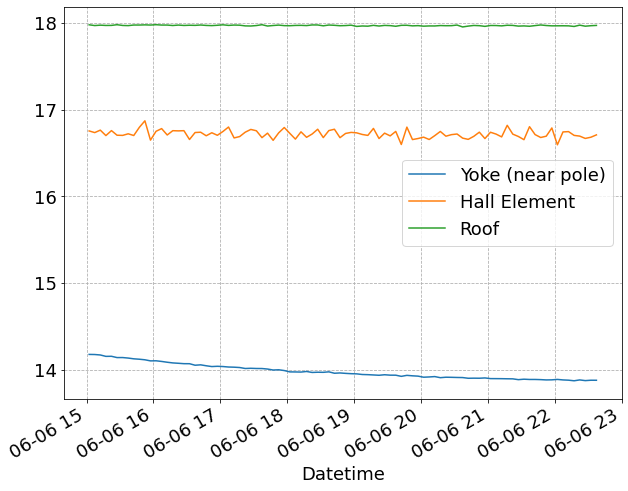

In [89]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [90]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

,Coil 1,Coil 2,LCW in Coil1,LCW in Coil 2,LCW out Coil 1,LCW out Coil 2
Datetime,,,,,,
2022-06-06 11:56:56,10.013602,9.974346,6.759177,8.357455,7.294950,7.344758
2022-06-06 11:57:19,10.023528,9.953417,6.919651,8.429079,7.425027,7.455841
2022-06-06 12:02:20,10.070420,10.015579,6.288008,8.208790,7.029292,7.060141
2022-06-06 12:07:20,10.026015,9.959623,7.579645,8.925444,7.954488,7.966933
2022-06-06 12:12:20,9.997469,9.947543,6.815256,8.361663,7.344543,7.376099
...,...,...,...,...,...,...
2022-06-06 22:17:19,10.668130,10.522634,6.908736,8.381642,7.521675,7.456702
2022-06-06 22:22:19,10.725195,10.592111,6.249265,8.047530,7.074089,6.981738
2022-06-06 22:27:20,10.678372,10.548971,7.669898,8.930728,8.149929,8.051444


In [91]:
df_temp_['Yoke (near pole)']

Datetime
2022-06-06 15:02:19    14.178476
2022-06-06 15:07:20    14.177300
2022-06-06 15:12:19    14.172086
2022-06-06 15:17:20    14.155973
2022-06-06 15:22:20    14.156894
                         ...    
2022-06-06 22:17:19    13.874544
2022-06-06 22:22:19    13.884403
2022-06-06 22:27:20    13.876563
2022-06-06 22:32:21    13.880856
2022-06-06 22:37:20    13.880464
Name: Yoke (near pole), Length: 92, dtype: float64

In [92]:
df_temp_['Hall Element']

Datetime
2022-06-06 15:02:19    16.754469
2022-06-06 15:07:20    16.735401
2022-06-06 15:12:19    16.763788
2022-06-06 15:17:20    16.701010
2022-06-06 15:22:20    16.758354
                         ...    
2022-06-06 22:17:19    16.703247
2022-06-06 22:22:19    16.695026
2022-06-06 22:27:20    16.668249
2022-06-06 22:32:21    16.681961
2022-06-06 22:37:20    16.709093
Name: Hall Element, Length: 92, dtype: float64

In [93]:
I = df_high['Magnet Current [A]'].mean()

In [94]:
I

56.01477604884408

In [95]:
df_high.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [96]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

Data at Hall probe


In [97]:
sf_high

0.324060098

In [98]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [99]:
B_ratio

0.999874773482428

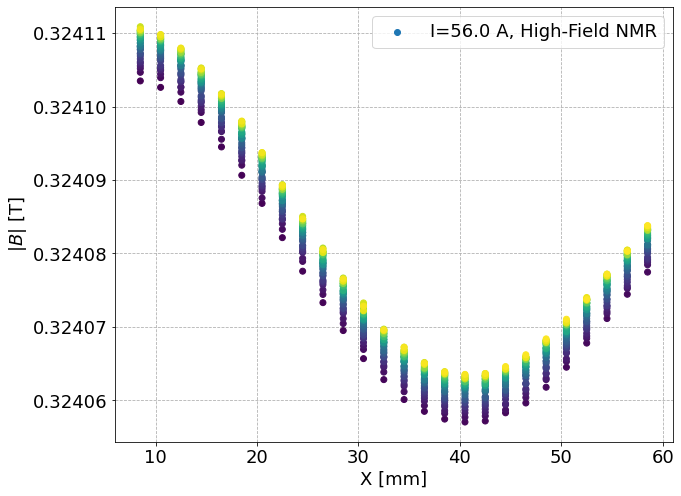

In [100]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [101]:
nl = True
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [102]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,sf,low_NMR
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-06 14:59:45,6/6/2022 2:59:45 PM,56.014813,6.139572,0.324103,0.0,426758.0,426425.0,1718661.0,426758.0,166702.34375,...,671351.953125,44.0,0.012222,0.000509,8.499766,124.997604,125.002387,0,0.324060,True
2022-06-06 15:00:14,6/6/2022 3:00:14 PM,56.014830,6.139173,0.324103,0.0,431878.0,426425.0,1718661.0,431878.0,168702.34375,...,671351.953125,73.0,0.020278,0.000845,10.499766,124.997604,125.002387,0,0.324060,True
2022-06-06 15:00:39,6/6/2022 3:00:39 PM,56.014802,6.138940,0.324101,0.0,436998.0,426425.0,1718661.0,436998.0,170702.34375,...,671351.953125,98.0,0.027222,0.001134,12.499766,124.997604,125.002387,0,0.324060,True
2022-06-06 15:01:06,6/6/2022 3:01:06 PM,56.014717,6.138737,0.324098,0.0,442118.0,426425.0,1718661.0,442118.0,172702.34375,...,671351.953125,125.0,0.034722,0.001447,14.499766,124.997604,125.002387,0,0.324060,True
2022-06-06 15:01:31,6/6/2022 3:01:31 PM,56.014688,6.138672,0.324094,0.0,447238.0,426425.0,1718661.0,447238.0,174702.34375,...,671351.953125,150.0,0.041667,0.001736,16.499766,124.997604,125.002387,0,0.324060,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-06 22:39:09,6/6/2022 10:39:09 PM,56.014711,6.134498,0.324071,0.0,534278.0,426435.0,1718663.0,534278.0,208702.34375,...,671352.734375,27608.0,7.668889,0.319537,50.499766,125.001511,125.001606,36,0.324067,True
2022-06-06 22:39:35,6/6/2022 10:39:35 PM,56.014768,6.134463,0.324074,0.0,539398.0,426435.0,1718663.0,539398.0,210702.34375,...,671352.734375,27634.0,7.676111,0.319838,52.499766,125.001511,125.001606,36,0.324067,True
2022-06-06 22:40:04,6/6/2022 10:40:04 PM,56.014807,6.134527,0.324077,0.0,544518.0,426435.0,1718663.0,544518.0,212702.34375,...,671352.734375,27663.0,7.684167,0.320174,54.499766,125.001511,125.001606,36,0.324067,True


In [103]:
df_high.run.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36])

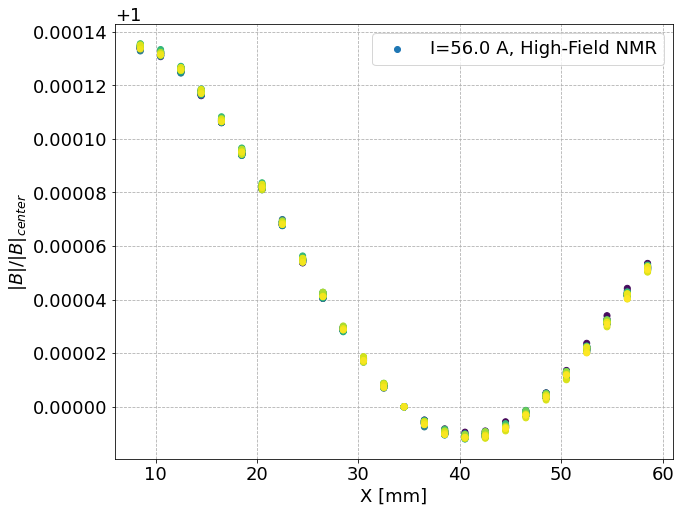

In [104]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

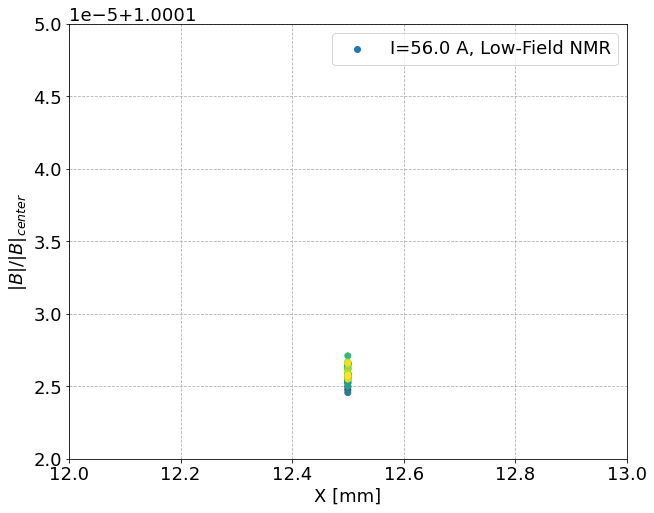

In [105]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [106]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf / df_['NMR [T]'])

In [107]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998740935606228, 6.039748079730137e-07)

In [108]:
# apply temperature correction

In [109]:
# redo delta time from first file
df_high['seconds_delta'] = (df_high.index - df_temp.index[0]).total_seconds()
df_high['hours_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/60**2
df_high['days_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/(24*60**2)
# temperature correction
B_corr = temp_correct(df_high, df_temp, tempcol="Yoke (near pole)")
# B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
df_high.loc[:, 'B_corr'] = B_corr
df_high.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
# recalculate scale factor
# find field value at Hall probe location
sf_corr_list = []
for r in df_high.run:
    try:
        sf = df_high[np.isclose(df_high.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_high.run == r)].iloc[0]['B_corr']
    except:
        sf = df_high[(df_high.run == r)].iloc[-1]['B_corr']
    sf_corr_list.append(sf)
df_high['sf_corr'] = sf_corr_list

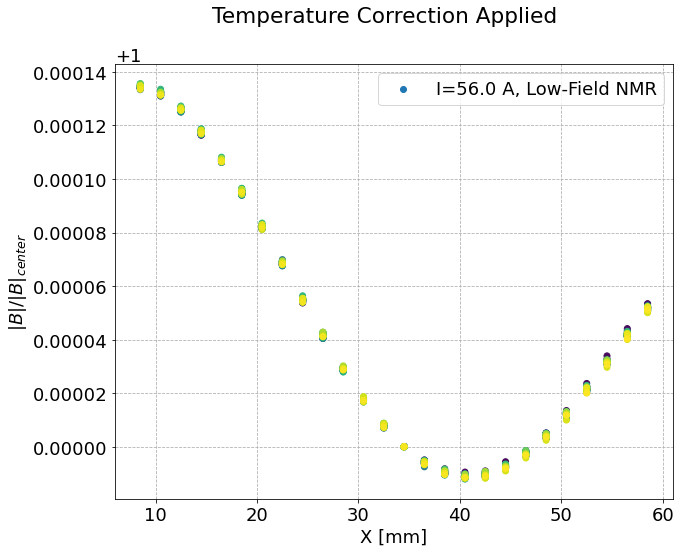

In [110]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['B_corr']/df_high['sf_corr'], c=range(len(df_high)), label=f'I={I:0.1f} A, Low-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

fig.suptitle('Temperature Correction Applied')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

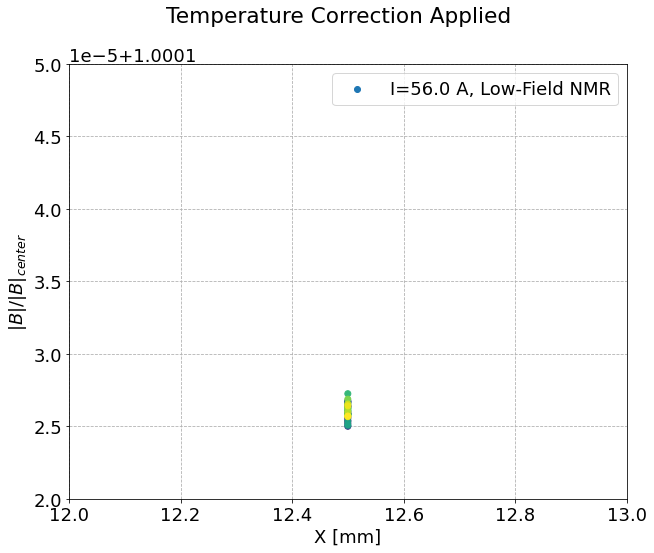

In [111]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/df_['sf_corr'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

fig.suptitle("Temperature Correction Applied")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [112]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf_corr / df_['B_corr'])

In [113]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998739971027483, 5.402339120142033e-07)

In [114]:
len(Brs)

37

In [115]:
t0 = df_high.iloc[0].Time
tf = df_high.iloc[-1].Time

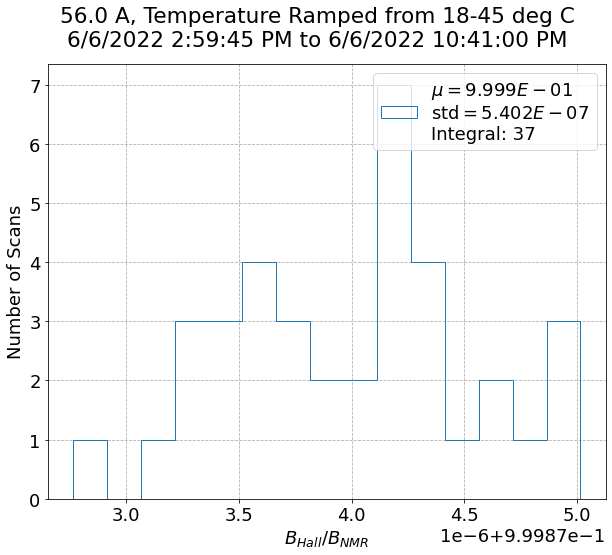

In [116]:
fig, ax = plt.subplots()

label_temp = r'$\mu = {0:.3E}$'+ '\n' + 'std' + r'$= {1:.3E}$' + '\n' +  'Integral: {2}'

ax.hist(Brs, bins=15, histtype='step', label=label_temp.format(np.mean(Brs), np.std(Brs, ddof=1), len(Brs)))

# ax.set_xlabel(r'$\frac{B_{Hall}}{B_{NMR}}$')
ax.set_xlabel(r'$B_{Hall}/B_{NMR}$')
ax.set_ylabel('Number of Scans')
fig.suptitle(f'{I:0.1f} A, Temperature Ramped from 18-45 deg C\n{t0} to {tf}')
ax.legend();

In [117]:
len(df_high.run.unique())

37

In [118]:
(169-154)*20 / 60

5.0

## 56 A (06-07-22 09:59, repeated 25 times)
- Enclosure temp cycled, 45 deg C for 6 hours, 15 deg C since then (4am 06-07)

In [874]:
# remove first row of file
df_high = load_data(ddir_full+files[43], low_NMR=nmr_low[43]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[44], low_NMR=nmr_low[44]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[3], low_NMR=True) # note low NMR changes based on time

In [875]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-07 10:00:06,6/7/2022 10:00:06 AM,56.014654,6.133957,0.324155,0.0,426758.0,426429.0,1718665.0,426758.0,166702.34375,426429.0,166573.828125,1718665.0,671353.515625,41.0,0.011389,0.000475,8.499766,124.999167,125.000824
2022-06-07 10:00:32,6/7/2022 10:00:32 AM,56.014762,6.134427,0.324154,0.0,431878.0,426429.0,1718665.0,431878.0,168702.34375,426429.0,166573.828125,1718665.0,671353.515625,67.0,0.018611,0.000775,10.499766,124.999167,125.000824
2022-06-07 10:00:58,6/7/2022 10:00:58 AM,56.014722,6.134738,0.324152,0.0,436998.0,426429.0,1718665.0,436998.0,170702.34375,426429.0,166573.828125,1718665.0,671353.515625,93.0,0.025833,0.001076,12.499766,124.999167,125.000824
2022-06-07 10:01:24,6/7/2022 10:01:24 AM,56.014768,6.134682,0.324150,0.0,442118.0,426429.0,1718665.0,442118.0,172702.34375,426429.0,166573.828125,1718665.0,671353.515625,119.0,0.033056,0.001377,14.499766,124.999167,125.000824
2022-06-07 10:01:50,6/7/2022 10:01:50 AM,56.014739,6.134312,0.324146,0.0,447238.0,426429.0,1718665.0,447238.0,174702.34375,426429.0,166573.828125,1718665.0,671353.515625,145.0,0.040278,0.001678,16.499766,124.999167,125.000824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-07 13:48:27,6/7/2022 1:48:27 PM,56.014751,6.130995,0.324122,0.0,503558.0,426433.0,1718668.0,503558.0,196702.34375,426433.0,166575.390625,1718668.0,671354.687500,13742.0,3.817222,0.159051,38.499766,125.000729,124.999652
2022-06-07 13:48:53,6/7/2022 1:48:53 PM,56.014762,6.130820,0.324122,0.0,508678.0,426433.0,1718668.0,508678.0,198702.34375,426433.0,166575.390625,1718668.0,671354.687500,13768.0,3.824444,0.159352,40.499766,125.000729,124.999652
2022-06-07 13:49:18,6/7/2022 1:49:18 PM,56.014796,6.130713,0.324122,0.0,513798.0,426433.0,1718668.0,513798.0,200702.34375,426433.0,166575.390625,1718668.0,671354.687500,13793.0,3.831389,0.159641,42.499766,125.000729,124.999652


In [876]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [877]:
df_temp_

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-07 10:00:30,6/7/2022 10:00:30 AM,56.014700,6.134390,10.303500,10.112438,7.785688,8.188400,8.855081,8.077253,13.932114,...,426429.0,166573.828125,1718665.0,671353.515625,123.0,0.034167,0.001424,10.499766,124.999167,125.000824
2022-06-07 10:01:20,6/7/2022 10:01:20 AM,56.014796,6.134712,10.327192,10.141161,6.632684,7.438018,8.271136,7.246100,13.921724,...,426429.0,166573.828125,1718665.0,671353.515625,173.0,0.048056,0.002002,14.499766,124.999167,125.000824
2022-06-07 10:02:10,6/7/2022 10:02:10 AM,56.014717,6.133950,10.329699,10.132037,6.242263,6.999285,7.883813,6.887160,13.912394,...,426429.0,166573.828125,1718665.0,671353.515625,223.0,0.061944,0.002581,18.499766,124.999167,125.000824
2022-06-07 10:03:00,6/7/2022 10:03:00 AM,56.014734,6.133152,10.311175,10.111870,6.440891,7.106072,7.908193,7.013525,13.909141,...,426429.0,166573.828125,1718665.0,671353.515625,273.0,0.075833,0.003160,22.499766,124.999167,125.000824
2022-06-07 10:03:52,6/7/2022 10:03:52 AM,56.014728,6.132603,10.282607,10.088336,6.671021,7.270789,8.089131,7.190073,13.902182,...,426429.0,166573.828125,1718665.0,671353.515625,325.0,0.090278,0.003762,24.499766,124.999167,125.000824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-07 13:25:23,6/7/2022 1:25:23 PM,56.014734,6.131353,10.218502,10.030949,6.441888,7.079429,7.800128,7.004527,12.799071,...,426431.0,166574.609375,1718668.0,671354.687500,12416.0,3.448889,0.143704,40.499766,124.999948,124.999652
2022-06-07 13:30:23,6/7/2022 1:30:23 PM,56.014700,6.132598,10.231542,10.032848,7.764420,8.166855,8.746379,8.051502,12.783885,...,426432.0,166575.000000,1718668.0,671354.687500,12716.0,3.532222,0.147176,10.499766,125.000339,124.999652
2022-06-07 13:35:23,6/7/2022 1:35:23 PM,56.014824,6.130832,10.184824,9.985115,7.176555,7.648494,8.246793,7.563132,12.770306,...,426432.0,166575.000000,1718668.0,671354.687500,13016.0,3.615556,0.150648,32.499766,125.000339,124.999652


<AxesSubplot:xlabel='Datetime'>

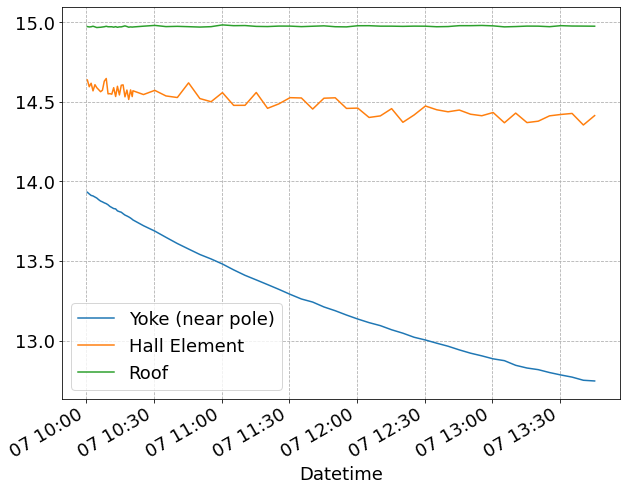

In [878]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [879]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

,Coil 1,Coil 2,LCW in Coil1,LCW in Coil 2,LCW out Coil 1,LCW out Coil 2
Datetime,,,,,,
2022-06-07 09:58:27,10.261402,10.076647,7.225540,8.439118,7.705703,7.618109
2022-06-07 09:58:50,10.270057,10.083441,7.360937,8.590925,7.823470,7.729064
2022-06-07 09:59:40,10.279318,10.093916,7.586414,8.714927,8.001370,7.910110
2022-06-07 10:00:30,10.303500,10.112438,7.785688,8.855081,8.188400,8.077253
2022-06-07 10:01:20,10.327192,10.141161,6.632684,8.271136,7.438018,7.246100
...,...,...,...,...,...,...
2022-06-07 13:30:23,10.231542,10.032848,7.764420,8.746379,8.166855,8.051502
2022-06-07 13:35:23,10.184824,9.985115,7.176555,8.246793,7.648494,7.563132
2022-06-07 13:40:23,10.210259,10.023528,6.436373,7.817326,7.074206,6.992399


In [880]:
df_temp_['Yoke (near pole)']

Datetime
2022-06-07 10:00:30    13.932114
2022-06-07 10:01:20    13.921724
2022-06-07 10:02:10    13.912394
2022-06-07 10:03:00    13.909141
2022-06-07 10:03:52    13.902182
                         ...    
2022-06-07 13:25:23    12.799071
2022-06-07 13:30:23    12.783885
2022-06-07 13:35:23    12.770306
2022-06-07 13:40:23    12.750534
2022-06-07 13:45:23    12.746086
Name: Yoke (near pole), Length: 67, dtype: float64

In [881]:
df_temp_['Hall Element']

Datetime
2022-06-07 10:00:30    14.637888
2022-06-07 10:01:20    14.595520
2022-06-07 10:02:10    14.617478
2022-06-07 10:03:00    14.569679
2022-06-07 10:03:52    14.608439
                         ...    
2022-06-07 13:25:23    14.412585
2022-06-07 13:30:23    14.421231
2022-06-07 13:35:23    14.427720
2022-06-07 13:40:23    14.355165
2022-06-07 13:45:23    14.414232
Name: Hall Element, Length: 67, dtype: float64

In [882]:
I = df_high['Magnet Current [A]'].mean()

In [883]:
I

56.0147195110214

In [884]:
df_high.magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562,
       38.49976562, 40.49976562, 42.49976562, 44.49976562, 46.49976562,
       48.49976562, 50.49976562, 52.49976562, 54.49976562, 56.49976562,
       58.49976562])

In [885]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

Data at Hall probe


In [886]:
sf_high

0.324111982

In [887]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [888]:
B_ratio

0.9998761569128195

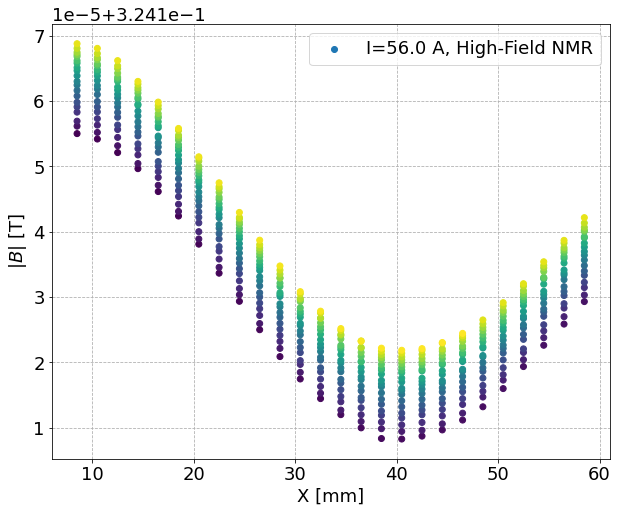

In [889]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [890]:
nl = True
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [891]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,sf,low_NMR
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-07 10:00:06,6/7/2022 10:00:06 AM,56.014654,6.133957,0.324155,0.0,426758.0,426429.0,1718665.0,426758.0,166702.34375,...,671353.515625,41.0,0.011389,0.000475,8.499766,124.999167,125.000824,0,0.324112,True
2022-06-07 10:00:32,6/7/2022 10:00:32 AM,56.014762,6.134427,0.324154,0.0,431878.0,426429.0,1718665.0,431878.0,168702.34375,...,671353.515625,67.0,0.018611,0.000775,10.499766,124.999167,125.000824,0,0.324112,True
2022-06-07 10:00:58,6/7/2022 10:00:58 AM,56.014722,6.134738,0.324152,0.0,436998.0,426429.0,1718665.0,436998.0,170702.34375,...,671353.515625,93.0,0.025833,0.001076,12.499766,124.999167,125.000824,0,0.324112,True
2022-06-07 10:01:24,6/7/2022 10:01:24 AM,56.014768,6.134682,0.324150,0.0,442118.0,426429.0,1718665.0,442118.0,172702.34375,...,671353.515625,119.0,0.033056,0.001377,14.499766,124.999167,125.000824,0,0.324112,True
2022-06-07 10:01:50,6/7/2022 10:01:50 AM,56.014739,6.134312,0.324146,0.0,447238.0,426429.0,1718665.0,447238.0,174702.34375,...,671353.515625,145.0,0.040278,0.001678,16.499766,124.999167,125.000824,0,0.324112,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-07 13:48:27,6/7/2022 1:48:27 PM,56.014751,6.130995,0.324122,0.0,503558.0,426433.0,1718668.0,503558.0,196702.34375,...,671354.687500,13742.0,3.817222,0.159051,38.499766,125.000729,124.999652,19,0.324125,True
2022-06-07 13:48:53,6/7/2022 1:48:53 PM,56.014762,6.130820,0.324122,0.0,508678.0,426433.0,1718668.0,508678.0,198702.34375,...,671354.687500,13768.0,3.824444,0.159352,40.499766,125.000729,124.999652,19,0.324125,True
2022-06-07 13:49:18,6/7/2022 1:49:18 PM,56.014796,6.130713,0.324122,0.0,513798.0,426433.0,1718668.0,513798.0,200702.34375,...,671354.687500,13793.0,3.831389,0.159641,42.499766,125.000729,124.999652,19,0.324125,True


In [892]:
df_high.run.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

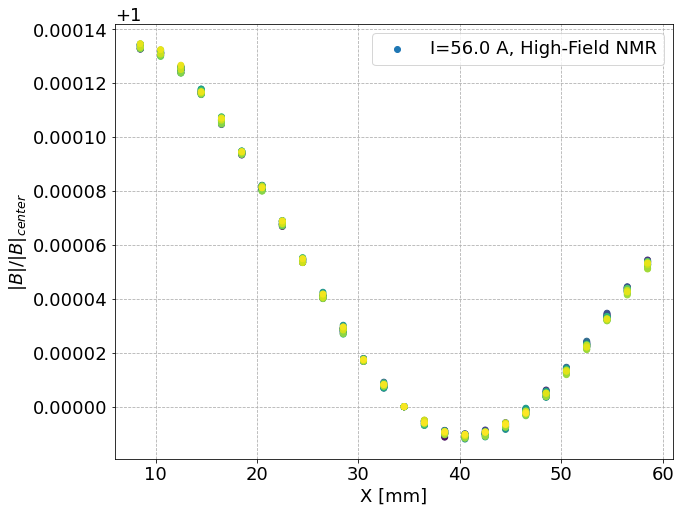

In [893]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

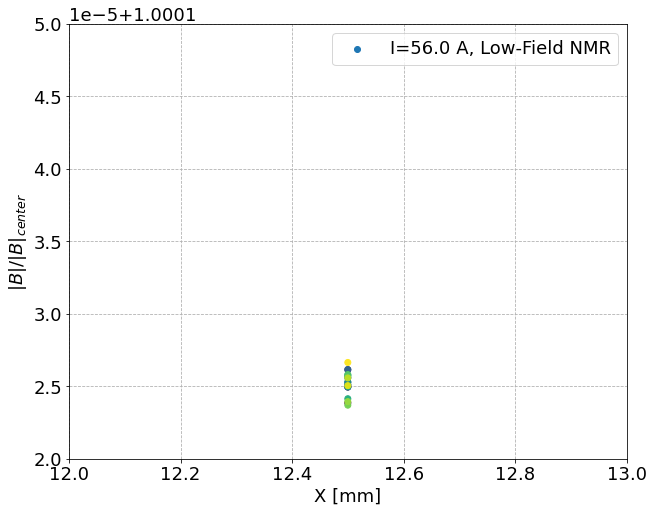

In [894]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [895]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf / df_['NMR [T]'])

In [896]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998748313132051, 7.983300807939835e-07)

In [897]:
# apply temperature correction

In [898]:
# redo delta time from first file
df_high['seconds_delta'] = (df_high.index - df_temp.index[0]).total_seconds()
df_high['hours_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/60**2
df_high['days_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/(24*60**2)
# temperature correction
B_corr = temp_correct(df_high, df_temp, tempcol="Yoke (near pole)")
# B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
df_high.loc[:, 'B_corr'] = B_corr
df_high.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
# recalculate scale factor
# find field value at Hall probe location
sf_corr_list = []
for r in df_high.run:
    try:
        sf = df_high[np.isclose(df_high.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_high.run == r)].iloc[0]['B_corr']
    except:
        sf = df_high[(df_high.run == r)].iloc[-1]['B_corr']
    sf_corr_list.append(sf)
df_high['sf_corr'] = sf_corr_list

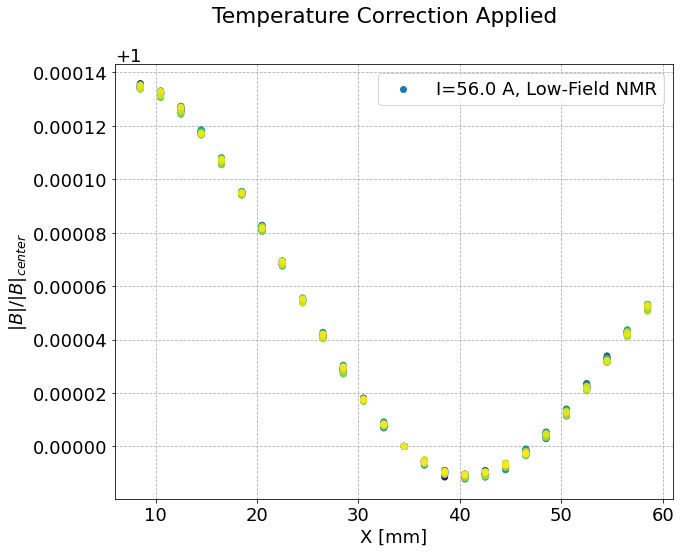

In [899]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['B_corr']/df_high['sf_corr'], c=range(len(df_high)), label=f'I={I:0.1f} A, Low-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

fig.suptitle('Temperature Correction Applied')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

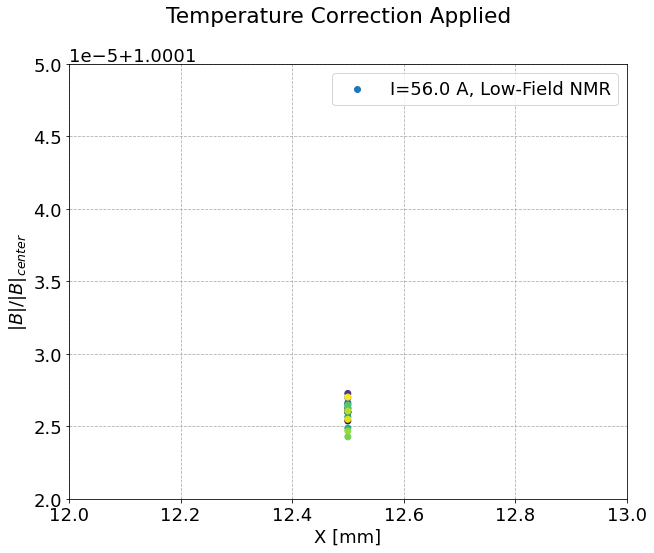

In [900]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/df_['sf_corr'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00012, 1.00015])

fig.suptitle("Temperature Correction Applied")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [901]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf_corr / df_['B_corr'])

In [902]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9998740317760623, 7.716638819989782e-07)

In [903]:
# from 169 scans above (06-06-2022)
(0.9998739971027483, 5.402339120142033e-07)

(0.9998739971027483, 5.402339120142033e-07)

In [904]:
np.mean(Brs) - 0.9998739971027483

3.4673313997757305e-08

In [905]:
len(Brs)

20

In [906]:
t0 = df_high.iloc[0].Time
tf = df_high.iloc[-1].Time

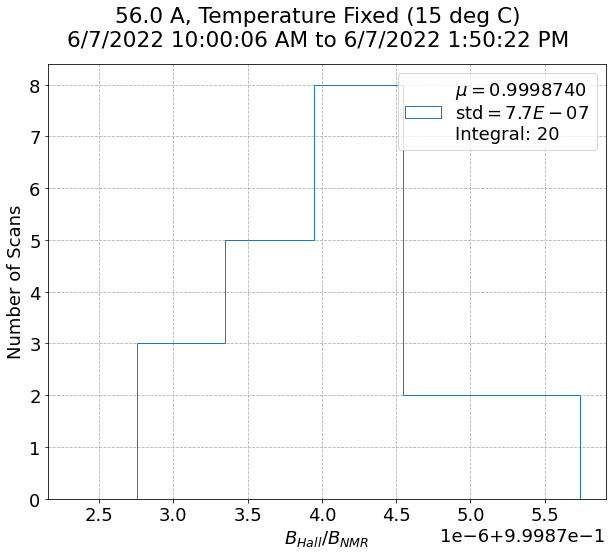

In [908]:
fig, ax = plt.subplots()

label_temp = r'$\mu = {0:.7f}$'+ '\n' + 'std' + r'$= {1:.1E}$' + '\n' +  'Integral: {2}'

n, bins, patches = ax.hist(Brs, bins=5, histtype='step', label=label_temp.format(np.mean(Brs), np.std(Brs, ddof=1), len(Brs)))

xme = np.mean(Brs)
xmi = np.min(Brs)
xma = np.max(Brs)
xli = np.max(np.abs([xme-xmi, xma-xme])) * 1.1

ax.set_xlim([xme-xli, xme+xli])

# ax.set_xlabel(r'$\frac{B_{Hall}}{B_{NMR}}$')
ax.set_xlabel(r'$B_{Hall}/B_{NMR}$')
ax.set_ylabel('Number of Scans')
fig.suptitle(f'{I:0.1f} A, Temperature Fixed (15 deg C)\n{t0} to {tf}')
ax.legend();
# ax.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0));

In [909]:
len(df_high.run.unique())

20

In [910]:
(169-154)*20 / 60

5.0

## 272 A (06-07-22 17:38, repeated 169 times)
- Enclosure temp 15 deg C
- Current was changed at 14:29 but I did not have time to start the scans before FMS

In [1131]:
# remove first row of file
df_high = load_data(ddir_full+files[44], low_NMR=nmr_low[44]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[45], low_NMR=nmr_low[45]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[3], low_NMR=False) # note low NMR changes based on time

In [1132]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-07 17:39:16,6/7/2022 5:39:16 PM,272.070040,35.367217,1.288698,0.0,424505.0,426425.0,1664876.0,424505.0,165822.265625,426425.0,166572.265625,1664876.0,650342.18750,33.0,0.009167,0.000382,11.499687,124.997604,125.002152
2022-06-07 17:39:31,6/7/2022 5:39:31 PM,272.069927,35.368483,1.288652,0.0,427065.0,426425.0,1664876.0,427065.0,166822.265625,426425.0,166572.265625,1664876.0,650342.18750,48.0,0.013333,0.000556,12.499687,124.997604,125.002152
2022-06-07 17:39:46,6/7/2022 5:39:46 PM,272.069870,35.370300,1.288598,0.0,429625.0,426425.0,1664876.0,429625.0,167822.265625,426425.0,166572.265625,1664876.0,650342.18750,63.0,0.017500,0.000729,13.499688,124.997604,125.002152
2022-06-07 17:40:01,6/7/2022 5:40:01 PM,272.070040,35.372550,1.288545,0.0,432185.0,426425.0,1664876.0,432185.0,168822.265625,426425.0,166572.265625,1664876.0,650342.18750,78.0,0.021667,0.000903,14.499688,124.997604,125.002152
2022-06-07 17:40:24,6/7/2022 5:40:24 PM,272.069927,35.375867,1.288493,0.0,434745.0,426425.0,1664876.0,434745.0,169822.265625,426425.0,166572.265625,1664876.0,650342.18750,101.0,0.028056,0.001169,15.499688,124.997604,125.002152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-08 13:47:07,6/8/2022 1:47:07 PM,272.069700,35.432200,1.287464,0.0,465465.0,426436.0,1664882.0,465465.0,181822.265625,426436.0,166576.562500,1664882.0,650344.53125,72504.0,20.140000,0.839167,27.499688,125.001901,124.999809
2022-06-08 13:47:21,6/8/2022 1:47:21 PM,272.069757,35.430833,1.287437,0.0,468025.0,426436.0,1664882.0,468025.0,182822.265625,426436.0,166576.562500,1664882.0,650344.53125,72518.0,20.143889,0.839329,28.499688,125.001901,124.999809
2022-06-08 13:47:36,6/8/2022 1:47:36 PM,272.069757,35.428917,1.287413,0.0,470585.0,426436.0,1664882.0,470585.0,183822.265625,426436.0,166576.562500,1664882.0,650344.53125,72533.0,20.148056,0.839502,29.499688,125.001901,124.999809


In [1133]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [1134]:
df_temp_

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-07 17:40:24,6/7/2022 5:40:24 PM,272.070040,35.375917,52.266407,47.590198,9.430122,16.487535,11.054793,18.038603,18.548044,...,426425.0,166572.265625,1664876.0,650342.18750,27717.0,7.699167,0.320799,15.499688,124.997604,125.002152
2022-06-07 17:45:23,6/7/2022 5:45:23 PM,272.069870,35.371833,52.232426,47.604893,9.508797,16.398615,10.862593,18.032873,18.652685,...,426425.0,166572.265625,1664876.0,650342.18750,28016.0,7.782222,0.324259,34.499688,124.997604,125.002152
2022-06-07 17:50:24,6/7/2022 5:50:24 PM,272.069757,35.369117,52.215790,47.558975,8.835626,15.860375,10.454313,17.539207,18.745415,...,426425.0,166572.265625,1664876.0,650342.18750,28317.0,7.865833,0.327743,54.404766,124.997604,125.002152
2022-06-07 17:55:23,6/7/2022 5:55:23 PM,272.069927,35.368433,52.316155,47.602791,8.056023,15.285922,9.907760,16.992426,18.843802,...,426426.0,166572.656250,1664876.0,650342.18750,28616.0,7.948889,0.331204,20.499688,124.997995,125.002152
2022-06-07 18:00:24,6/7/2022 6:00:24 PM,272.070040,35.369083,52.279892,47.567272,7.372812,14.793326,9.493235,16.541599,18.939835,...,426426.0,166572.656250,1664876.0,650342.18750,28917.0,8.032500,0.334688,40.499688,124.997995,125.002152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-08 13:25:24,6/8/2022 1:25:24 PM,272.069700,35.430067,52.756931,48.088905,6.692223,15.033458,9.673768,16.332628,22.352900,...,426434.0,166575.781250,1664882.0,650344.53125,98817.0,27.449167,1.143715,49.499688,125.001120,124.999809
2022-06-08 13:30:24,6/8/2022 1:30:24 PM,272.069700,35.432600,52.734028,48.026035,7.385743,15.521382,10.129139,16.787172,22.344824,...,426435.0,166576.171875,1664882.0,650344.53125,99117.0,27.532500,1.147188,15.499688,125.001511,124.999809
2022-06-08 13:35:22,6/8/2022 1:35:22 PM,272.069927,35.432783,52.731907,48.065598,8.115000,15.986036,10.625734,17.271917,22.340088,...,426435.0,166576.171875,1664882.0,650344.53125,99415.0,27.615278,1.150637,34.499688,125.001511,124.999809


<AxesSubplot:xlabel='Datetime'>

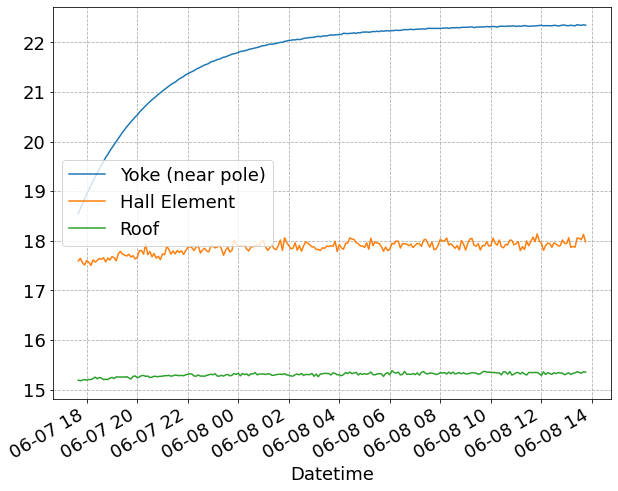

In [1135]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [1136]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

,Coil 1,Coil 2,LCW in Coil1,LCW in Coil 2,LCW out Coil 1,LCW out Coil 2
Datetime,,,,,,
2022-06-07 09:58:27,10.261402,10.076647,7.225540,8.439118,7.705703,7.618109
2022-06-07 09:58:50,10.270057,10.083441,7.360937,8.590925,7.823470,7.729064
2022-06-07 09:59:40,10.279318,10.093916,7.586414,8.714927,8.001370,7.910110
2022-06-07 10:00:30,10.303500,10.112438,7.785688,8.855081,8.188400,8.077253
2022-06-07 10:01:20,10.327192,10.141161,6.632684,8.271136,7.438018,7.246100
...,...,...,...,...,...,...
2022-06-08 13:35:22,52.731907,48.065598,8.115000,10.625734,15.986036,17.271917
2022-06-08 13:40:24,52.756256,48.036369,8.841283,11.046157,16.384687,17.686636
2022-06-08 13:45:24,52.717846,47.993420,9.554096,11.363565,16.708622,18.068886


In [1137]:
df_temp_['Yoke (near pole)']

Datetime
2022-06-07 17:40:24    18.548044
2022-06-07 17:45:23    18.652685
2022-06-07 17:50:24    18.745415
2022-06-07 17:55:23    18.843802
2022-06-07 18:00:24    18.939835
                         ...    
2022-06-08 13:25:24    22.352900
2022-06-08 13:30:24    22.344824
2022-06-08 13:35:22    22.340088
2022-06-08 13:40:24    22.351191
2022-06-08 13:45:24    22.343388
Name: Yoke (near pole), Length: 242, dtype: float64

In [1138]:
df_temp_['Hall Element']

Datetime
2022-06-07 17:40:24    17.595329
2022-06-07 17:45:23    17.647448
2022-06-07 17:50:24    17.554808
2022-06-07 17:55:23    17.512285
2022-06-07 18:00:24    17.604158
                         ...    
2022-06-08 13:25:24    18.058876
2022-06-08 13:30:24    18.047533
2022-06-08 13:35:22    18.024336
2022-06-08 13:40:24    18.129118
2022-06-08 13:45:24    17.979078
Name: Hall Element, Length: 242, dtype: float64

In [1139]:
I = df_high['Magnet Current [A]'].mean()

In [1140]:
I

272.0698342155642

In [1141]:
df_high.magnet_X_mm.unique()

array([11.4996875, 12.4996875, 13.4996875, 14.4996875, 15.4996875,
       16.4996875, 17.4996875, 18.4996875, 19.4996875, 20.4996875,
       21.4996875, 22.4996875, 23.4996875, 24.4996875, 25.4996875,
       26.4996875, 27.4996875, 28.4996875, 29.4996875, 30.4996875,
       31.4996875, 32.4996875, 33.4996875, 34.4996875, 35.4996875,
       36.4996875, 37.4996875, 38.4996875, 39.4996875, 40.4996875,
       41.4996875, 42.4996875, 43.4996875, 44.4996875, 45.4996875,
       46.4996875, 47.4996875, 48.4996875, 49.4996875, 50.4996875,
       51.4996875, 52.4996875, 53.4996875, 54.4996875, 55.4996875,
       56.4996875, 57.4996875, 58.4996875, 59.4996875, 60.4996875,
       61.4996875, 62.4996875, 63.4996875])

In [1142]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

Data at Hall probe


In [1143]:
sf_high

1.287862758

In [1144]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [1145]:
B_ratio

0.9993873599279001

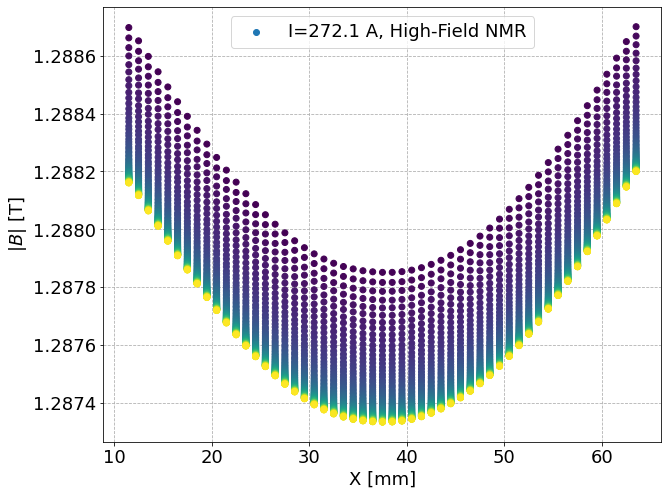

In [1146]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [1147]:
nl = True
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [1148]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,sf,low_NMR
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-07 17:39:16,6/7/2022 5:39:16 PM,272.070040,35.367217,1.288698,0.0,424505.0,426425.0,1664876.0,424505.0,165822.265625,...,650342.18750,33.0,0.009167,0.000382,11.499687,124.997604,125.002152,0,1.287863,True
2022-06-07 17:39:31,6/7/2022 5:39:31 PM,272.069927,35.368483,1.288652,0.0,427065.0,426425.0,1664876.0,427065.0,166822.265625,...,650342.18750,48.0,0.013333,0.000556,12.499687,124.997604,125.002152,0,1.287863,True
2022-06-07 17:39:46,6/7/2022 5:39:46 PM,272.069870,35.370300,1.288598,0.0,429625.0,426425.0,1664876.0,429625.0,167822.265625,...,650342.18750,63.0,0.017500,0.000729,13.499688,124.997604,125.002152,0,1.287863,True
2022-06-07 17:40:01,6/7/2022 5:40:01 PM,272.070040,35.372550,1.288545,0.0,432185.0,426425.0,1664876.0,432185.0,168822.265625,...,650342.18750,78.0,0.021667,0.000903,14.499688,124.997604,125.002152,0,1.287863,True
2022-06-07 17:40:24,6/7/2022 5:40:24 PM,272.069927,35.375867,1.288493,0.0,434745.0,426425.0,1664876.0,434745.0,169822.265625,...,650342.18750,101.0,0.028056,0.001169,15.499688,124.997604,125.002152,0,1.287863,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-08 13:47:07,6/8/2022 1:47:07 PM,272.069700,35.432200,1.287464,0.0,465465.0,426436.0,1664882.0,465465.0,181822.265625,...,650344.53125,72504.0,20.140000,0.839167,27.499688,125.001901,124.999809,89,1.287375,True
2022-06-08 13:47:21,6/8/2022 1:47:21 PM,272.069757,35.430833,1.287437,0.0,468025.0,426436.0,1664882.0,468025.0,182822.265625,...,650344.53125,72518.0,20.143889,0.839329,28.499688,125.001901,124.999809,89,1.287375,True
2022-06-08 13:47:36,6/8/2022 1:47:36 PM,272.069757,35.428917,1.287413,0.0,470585.0,426436.0,1664882.0,470585.0,183822.265625,...,650344.53125,72533.0,20.148056,0.839502,29.499688,125.001901,124.999809,89,1.287375,True


In [1149]:
df_high.run.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89])

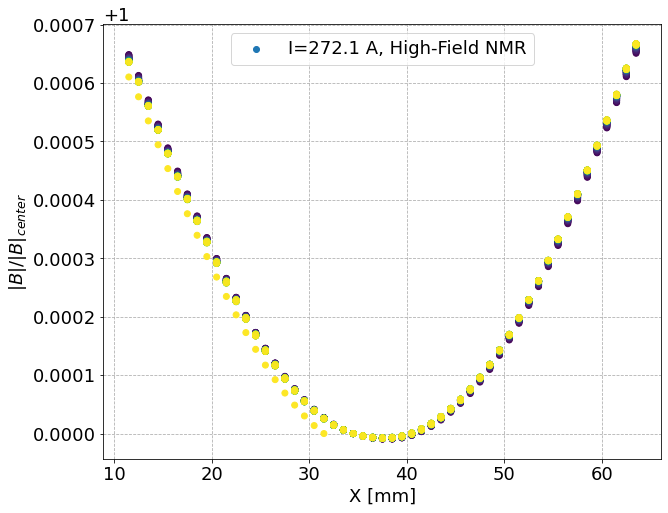

In [1150]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

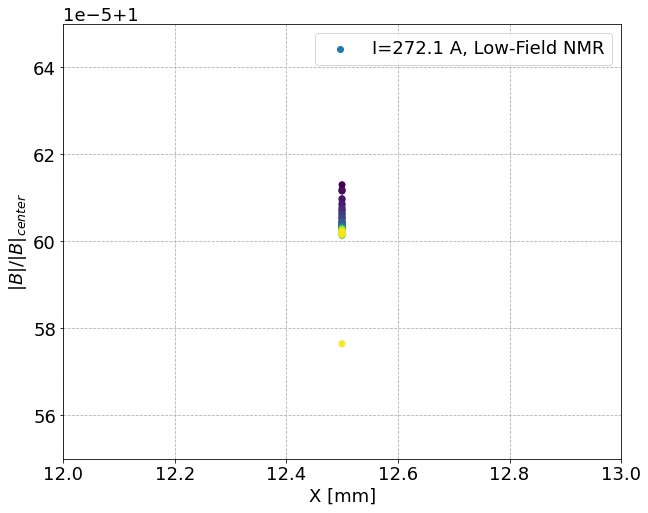

In [1151]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00055, 1.00065])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [1154]:
len(df_high.run.unique())

90

In [1157]:
# cut on run number
rmin = 0
# last run incomplete
rmax = 88
df_cut = df_high.query(f'(run >= {rmin}) & (run <= {rmax})')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf / df_['NMR [T]'])

In [1158]:
len(Brs)

89

In [1159]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9993964893387535, 2.601351831476611e-06)

In [1160]:
# apply temperature correction

In [1161]:
# redo delta time from first file
df_high['seconds_delta'] = (df_high.index - df_temp.index[0]).total_seconds()
df_high['hours_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/60**2
df_high['days_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/(24*60**2)
# temperature correction
B_corr = temp_correct(df_high, df_temp, tempcol="Yoke (near pole)")
# B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
df_high.loc[:, 'B_corr'] = B_corr
df_high.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
# recalculate scale factor
# find field value at Hall probe location
sf_corr_list = []
for r in df_high.run:
    try:
        sf = df_high[np.isclose(df_high.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_high.run == r)].iloc[0]['B_corr']
    except:
        sf = df_high[(df_high.run == r)].iloc[-1]['B_corr']
    sf_corr_list.append(sf)
df_high['sf_corr'] = sf_corr_list

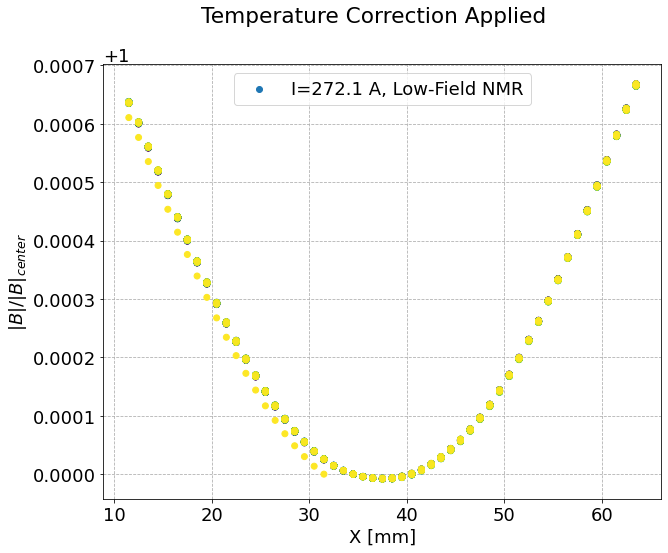

In [1162]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['B_corr']/df_high['sf_corr'], c=range(len(df_high)), label=f'I={I:0.1f} A, Low-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

fig.suptitle('Temperature Correction Applied')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

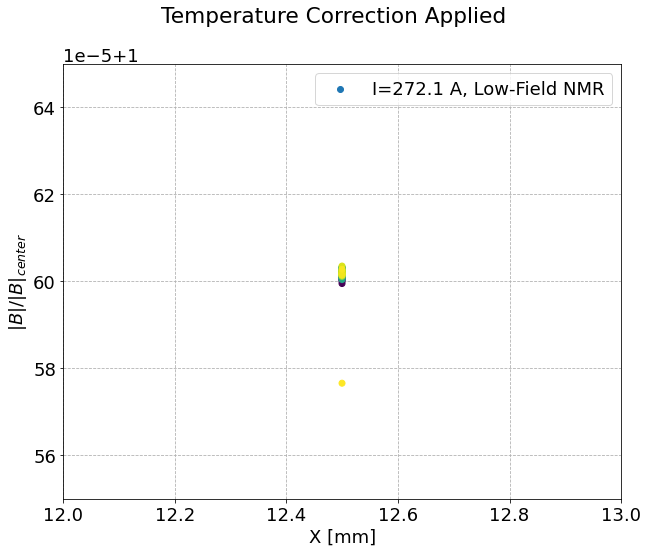

In [1163]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/df_['sf_corr'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00055, 1.00065])

fig.suptitle("Temperature Correction Applied")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [1164]:
# cut on run number
rmin = 0
# last run incomplete
rmax = 88
df_cut = df_high.query(f'(run >= {rmin}) & (run <= {rmax})')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf_corr / df_['B_corr'])

In [1165]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.999398542555555, 7.10527386452771e-07)

In [1166]:
len(Brs)

89

In [1167]:
t0 = df_high.iloc[0].Time
tf = df_high.iloc[-1].Time

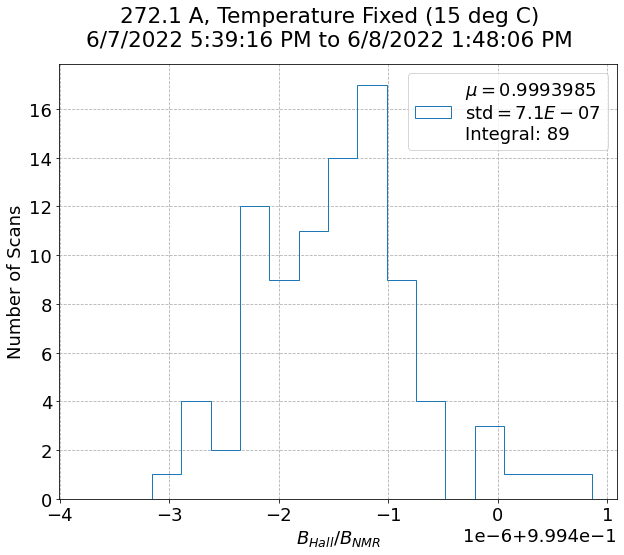

In [1168]:
fig, ax = plt.subplots()

label_temp = r'$\mu = {0:.7f}$'+ '\n' + 'std' + r'$= {1:.1E}$' + '\n' +  'Integral: {2}'

n, bins, patches = ax.hist(Brs, bins=15, histtype='step', label=label_temp.format(np.mean(Brs), np.std(Brs, ddof=1), len(Brs)))

xme = np.mean(Brs)
xmi = np.min(Brs)
xma = np.max(Brs)
xli = np.max(np.abs([xme-xmi, xma-xme])) * 1.1

ax.set_xlim([xme-xli, xme+xli])

# ax.set_xlabel(r'$\frac{B_{Hall}}{B_{NMR}}$')
ax.set_xlabel(r'$B_{Hall}/B_{NMR}$')
ax.set_ylabel('Number of Scans')
fig.suptitle(f'{I:0.1f} A, Temperature Fixed (15 deg C)\n{t0} to {tf}')
ax.legend();
# ax.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0));

In [1169]:
len(df_high.run.unique())

90

## 176 A (06-08-22 13:55, repeated 169 times)
- Enclosure temp 15 deg C
- Should hit ~1 T
- Current was changed at 13:52

In [1474]:
# remove first row of file
df_high = load_data(ddir_full+files[45], low_NMR=nmr_low[45]).iloc[1:].copy()
# df_high = load_data(ddir_full+files[46], low_NMR=nmr_low[46]).iloc[1:].copy()
df_temp = load_data(ddir_full+tempfiles[3], low_NMR=False) # note low NMR changes based on time

In [1475]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2022-06-08 13:55:53,6/8/2022 1:55:53 PM,176.046617,21.841350,0.983186,0.0,424505.0,426425.0,1664876.0,424505.0,165822.265625,426425.0,166572.265625,1664876.0,650342.187500,34.0,0.009444,0.000394,11.499687,124.997604,125.002152
2022-06-08 13:56:08,6/8/2022 1:56:08 PM,176.046560,21.823533,0.983177,0.0,427065.0,426425.0,1664876.0,427065.0,166822.265625,426425.0,166572.265625,1664876.0,650342.187500,49.0,0.013611,0.000567,12.499687,124.997604,125.002152
2022-06-08 13:56:23,6/8/2022 1:56:23 PM,176.046560,21.805833,0.983166,0.0,429625.0,426425.0,1664876.0,429625.0,167822.265625,426425.0,166572.265625,1664876.0,650342.187500,64.0,0.017778,0.000741,13.499688,124.997604,125.002152
2022-06-08 13:56:38,6/8/2022 1:56:38 PM,176.046560,21.788000,0.983154,0.0,432185.0,426425.0,1664876.0,432185.0,168822.265625,426425.0,166572.265625,1664876.0,650342.187500,79.0,0.021944,0.000914,14.499688,124.997604,125.002152
2022-06-08 13:56:52,6/8/2022 1:56:52 PM,176.046560,21.770583,0.983143,0.0,434745.0,426425.0,1664876.0,434745.0,169822.265625,426425.0,166572.265625,1664876.0,650342.187500,93.0,0.025833,0.001076,15.499688,124.997604,125.002152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-08 17:15:39,6/8/2022 5:15:39 PM,176.047693,20.625183,0.983264,0.0,501305.0,426426.0,1664877.0,501305.0,195822.265625,426426.0,166572.656250,1664877.0,650342.578125,12020.0,3.338889,0.139120,41.499688,124.997995,125.001762
2022-06-08 17:15:53,6/8/2022 5:15:53 PM,176.047807,20.624200,0.983267,0.0,503865.0,426426.0,1664877.0,503865.0,196822.265625,426426.0,166572.656250,1664877.0,650342.578125,12034.0,3.342778,0.139282,42.499688,124.997995,125.001762
2022-06-08 17:16:08,6/8/2022 5:16:08 PM,176.047580,20.623117,0.983271,0.0,506425.0,426426.0,1664877.0,506425.0,197822.265625,426426.0,166572.656250,1664877.0,650342.578125,12049.0,3.346944,0.139456,43.499688,124.997995,125.001762


In [1476]:
t0 = df_high.index[0]
tf = df_high.index[-1]
df_temp_ = df_temp.query(f'"{t0}" < Datetime <= "{tf}"')

In [1477]:
df_temp_

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-08 14:00:23,6/8/2022 2:00:23 PM,176.046730,21.531283,37.964855,33.804775,8.129206,13.312227,10.102922,14.023360,22.241030,...,426425.0,166572.265625,1664876.0,650342.187500,100916.0,28.032222,1.168009,28.499688,124.997604,125.002152
2022-06-08 14:05:24,6/8/2022 2:05:24 PM,176.046673,21.282283,34.941670,31.161852,7.538089,12.409092,9.596264,12.990893,22.127926,...,426425.0,166572.265625,1664876.0,650342.187500,101217.0,28.115833,1.171493,48.499688,124.997604,125.002152
2022-06-08 14:10:24,6/8/2022 2:10:24 PM,176.046900,21.103117,32.616405,29.244013,7.113369,11.762395,9.354404,12.214423,21.985390,...,426426.0,166572.656250,1664876.0,650342.187500,101517.0,28.199167,1.174965,14.499688,124.997995,125.002152
2022-06-08 14:15:22,6/8/2022 2:15:22 PM,176.046900,20.975217,30.956755,27.903765,6.779754,11.309897,9.108667,11.649270,21.851133,...,426426.0,166572.656250,1664876.0,650342.187500,101815.0,28.281944,1.178414,33.499688,124.997995,125.002152
2022-06-08 14:20:24,6/8/2022 2:20:24 PM,176.046900,20.883467,29.768272,26.983696,6.437253,10.962002,8.892464,11.205817,21.698532,...,426426.0,166572.656250,1664876.0,650342.187500,102117.0,28.365833,1.181910,53.499688,124.997995,125.002152
2022-06-08 14:25:24,6/8/2022 2:25:24 PM,176.046900,20.817550,28.828043,26.254688,6.279676,10.859968,9.024150,10.999800,21.543856,...,426427.0,166573.046875,1664876.0,650342.187500,102417.0,28.449167,1.185382,19.499688,124.998386,125.002152
2022-06-08 14:30:24,6/8/2022 2:30:24 PM,176.046957,20.769850,28.162767,25.757219,6.817760,11.238172,9.412112,11.339375,21.388262,...,426427.0,166573.046875,1664876.0,650342.187500,102717.0,28.532500,1.188854,38.499688,124.998386,125.002152
2022-06-08 14:35:24,6/8/2022 2:35:24 PM,176.047240,20.734967,27.658363,25.377026,7.763696,11.767547,9.990675,11.943148,21.239237,...,426427.0,166573.046875,1664876.0,650342.187500,103017.0,28.615833,1.192326,57.499688,124.998386,125.002152
2022-06-08 14:40:24,6/8/2022 2:40:24 PM,176.046900,20.707950,27.314655,25.074793,8.546324,12.090156,10.363338,12.377822,21.086075,...,426428.0,166573.437500,1664876.0,650342.187500,103317.0,28.699167,1.195799,23.499688,124.998776,125.002152


<AxesSubplot:xlabel='Datetime'>

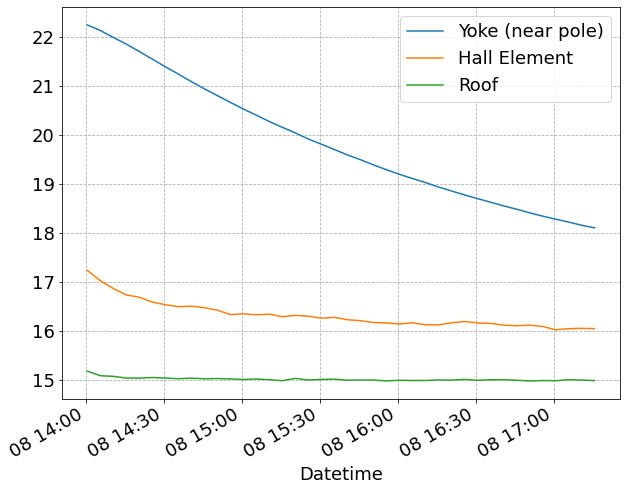

In [1478]:
# yoke temp, hall probe temp
df_temp_[['Yoke (near pole)', 'Hall Element', 'Roof']].plot()

In [1479]:
df_temp[['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']]

,Coil 1,Coil 2,LCW in Coil1,LCW in Coil 2,LCW out Coil 1,LCW out Coil 2
Datetime,,,,,,
2022-06-07 09:58:27,10.261402,10.076647,7.225540,8.439118,7.705703,7.618109
2022-06-07 09:58:50,10.270057,10.083441,7.360937,8.590925,7.823470,7.729064
2022-06-07 09:59:40,10.279318,10.093916,7.586414,8.714927,8.001370,7.910110
2022-06-07 10:00:30,10.303500,10.112438,7.785688,8.855081,8.188400,8.077253
2022-06-07 10:01:20,10.327192,10.141161,6.632684,8.271136,7.438018,7.246100
...,...,...,...,...,...,...
2022-06-08 16:55:24,26.163681,24.198185,7.123033,9.059264,10.717009,10.998703
2022-06-08 17:00:24,26.169504,24.227657,6.839902,8.834452,10.551772,10.786158
2022-06-08 17:05:24,26.203066,24.223942,6.452489,8.652554,10.359971,10.557019


In [1480]:
df_temp_['Yoke (near pole)']

Datetime
2022-06-08 14:00:23    22.241030
2022-06-08 14:05:24    22.127926
2022-06-08 14:10:24    21.985390
2022-06-08 14:15:22    21.851133
2022-06-08 14:20:24    21.698532
2022-06-08 14:25:24    21.543856
2022-06-08 14:30:24    21.388262
2022-06-08 14:35:24    21.239237
2022-06-08 14:40:24    21.086075
2022-06-08 14:45:23    20.939106
2022-06-08 14:50:24    20.800726
2022-06-08 14:55:24    20.662079
2022-06-08 15:00:22    20.527718
2022-06-08 15:05:24    20.400982
2022-06-08 15:10:23    20.271679
2022-06-08 15:15:24    20.153337
2022-06-08 15:20:24    20.038988
2022-06-08 15:25:24    19.915512
2022-06-08 15:30:23    19.809141
2022-06-08 15:35:24    19.701460
2022-06-08 15:40:24    19.590561
2022-06-08 15:45:24    19.494236
2022-06-08 15:50:24    19.388468
2022-06-08 15:55:23    19.290577
2022-06-08 16:00:24    19.195633
2022-06-08 16:05:23    19.110823
2022-06-08 16:10:22    19.028841
2022-06-08 16:15:24    18.937046
2022-06-08 16:20:24    18.857424
2022-06-08 16:25:22    18.777294
2

In [1481]:
df_temp_['Hall Element']

Datetime
2022-06-08 14:00:23    17.240917
2022-06-08 14:05:24    17.027231
2022-06-08 14:10:24    16.870003
2022-06-08 14:15:22    16.737970
2022-06-08 14:20:24    16.691555
2022-06-08 14:25:24    16.592291
2022-06-08 14:30:24    16.538578
2022-06-08 14:35:24    16.498776
2022-06-08 14:40:24    16.508154
2022-06-08 14:45:23    16.477669
2022-06-08 14:50:24    16.427921
2022-06-08 14:55:24    16.337982
2022-06-08 15:00:22    16.351675
2022-06-08 15:05:24    16.333746
2022-06-08 15:10:23    16.345045
2022-06-08 15:15:24    16.293455
2022-06-08 15:20:24    16.321192
2022-06-08 15:25:24    16.304695
2022-06-08 15:30:23    16.263580
2022-06-08 15:35:24    16.282314
2022-06-08 15:40:24    16.232864
2022-06-08 15:45:24    16.213228
2022-06-08 15:50:24    16.176001
2022-06-08 15:55:23    16.167233
2022-06-08 16:00:24    16.146128
2022-06-08 16:05:23    16.170919
2022-06-08 16:10:22    16.130573
2022-06-08 16:15:24    16.127100
2022-06-08 16:20:24    16.169115
2022-06-08 16:25:22    16.196634
2

In [1482]:
I = df_high['Magnet Current [A]'].mean()

In [1483]:
I

176.04735639639767

In [1484]:
df_high.magnet_X_mm.unique()

array([11.4996875, 12.4996875, 13.4996875, 14.4996875, 15.4996875,
       16.4996875, 17.4996875, 18.4996875, 19.4996875, 20.4996875,
       21.4996875, 22.4996875, 23.4996875, 24.4996875, 25.4996875,
       26.4996875, 27.4996875, 28.4996875, 29.4996875, 30.4996875,
       31.4996875, 32.4996875, 33.4996875, 34.4996875, 35.4996875,
       36.4996875, 37.4996875, 38.4996875, 39.4996875, 40.4996875,
       41.4996875, 42.4996875, 43.4996875, 44.4996875, 45.4996875,
       46.4996875, 47.4996875, 48.4996875, 49.4996875, 50.4996875,
       51.4996875, 52.4996875, 53.4996875, 54.4996875, 55.4996875,
       56.4996875, 57.4996875, 58.4996875, 59.4996875, 60.4996875,
       61.4996875, 62.4996875, 63.4996875])

In [1485]:
try:
    sf_high = df_high[np.isclose(df_high.magnet_X_mm, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
    print("Data at Hall probe")
except:
    sf_high = df_high.iloc[-1]['NMR [T]']
    print("No data at Hall probe!")

Data at Hall probe


In [1486]:
sf_high

0.982993252

In [1487]:
B_ratio = sf_high / df_high[np.isclose(df_high.magnet_X_mm, 12.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']

In [1488]:
B_ratio

0.9998127672461041

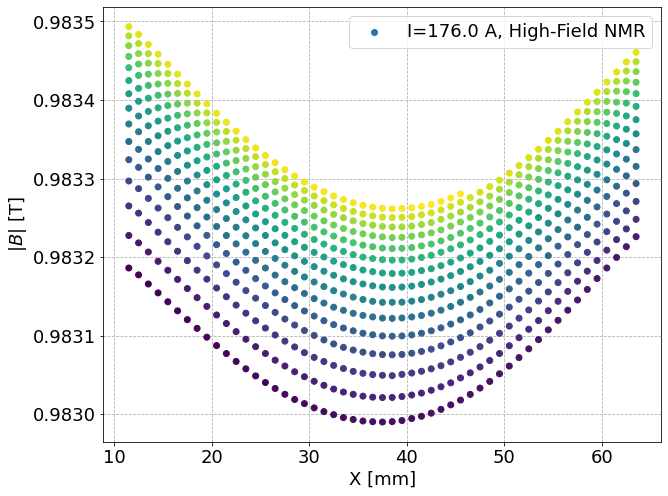

In [1489]:
# field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]'], c=np.arange(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B|$ [T]')
# ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [1490]:
nl = True
# scaling in different runs
i = 0
#df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
for df_ in [df_high]:
    # set runs
    run_list = []
    for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
        if new:
            i+=1
        run_list.append(int(i))
    df_.loc[:, 'run'] = run_list
    # new run for next file
    i+=1
    # find field value at Hall probe location
    sf_list = []
    for r in df_.run:
        try:
            sf = df_[np.isclose(df_.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_.run == r)].iloc[0]['NMR [T]']
        except:
            sf = df_.iloc[-1]['NMR [T]']
        sf_list.append(sf)
    df_['sf'] = sf_list    
    # whether low or high?
    df_.loc[:, 'low_NMR'] = nl

In [1491]:
df_high

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,run,sf,low_NMR
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-06-08 13:55:53,6/8/2022 1:55:53 PM,176.046617,21.841350,0.983186,0.0,424505.0,426425.0,1664876.0,424505.0,165822.265625,...,650342.187500,34.0,0.009444,0.000394,11.499687,124.997604,125.002152,0,0.982993,True
2022-06-08 13:56:08,6/8/2022 1:56:08 PM,176.046560,21.823533,0.983177,0.0,427065.0,426425.0,1664876.0,427065.0,166822.265625,...,650342.187500,49.0,0.013611,0.000567,12.499687,124.997604,125.002152,0,0.982993,True
2022-06-08 13:56:23,6/8/2022 1:56:23 PM,176.046560,21.805833,0.983166,0.0,429625.0,426425.0,1664876.0,429625.0,167822.265625,...,650342.187500,64.0,0.017778,0.000741,13.499688,124.997604,125.002152,0,0.982993,True
2022-06-08 13:56:38,6/8/2022 1:56:38 PM,176.046560,21.788000,0.983154,0.0,432185.0,426425.0,1664876.0,432185.0,168822.265625,...,650342.187500,79.0,0.021944,0.000914,14.499688,124.997604,125.002152,0,0.982993,True
2022-06-08 13:56:52,6/8/2022 1:56:52 PM,176.046560,21.770583,0.983143,0.0,434745.0,426425.0,1664876.0,434745.0,169822.265625,...,650342.187500,93.0,0.025833,0.001076,15.499688,124.997604,125.002152,0,0.982993,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-08 17:15:39,6/8/2022 5:15:39 PM,176.047693,20.625183,0.983264,0.0,501305.0,426426.0,1664877.0,501305.0,195822.265625,...,650342.578125,12020.0,3.338889,0.139120,41.499688,124.997995,125.001762,14,0.983269,True
2022-06-08 17:15:53,6/8/2022 5:15:53 PM,176.047807,20.624200,0.983267,0.0,503865.0,426426.0,1664877.0,503865.0,196822.265625,...,650342.578125,12034.0,3.342778,0.139282,42.499688,124.997995,125.001762,14,0.983269,True
2022-06-08 17:16:08,6/8/2022 5:16:08 PM,176.047580,20.623117,0.983271,0.0,506425.0,426426.0,1664877.0,506425.0,197822.265625,...,650342.578125,12049.0,3.346944,0.139456,43.499688,124.997995,125.001762,14,0.983269,True


In [1492]:
df_high.run.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

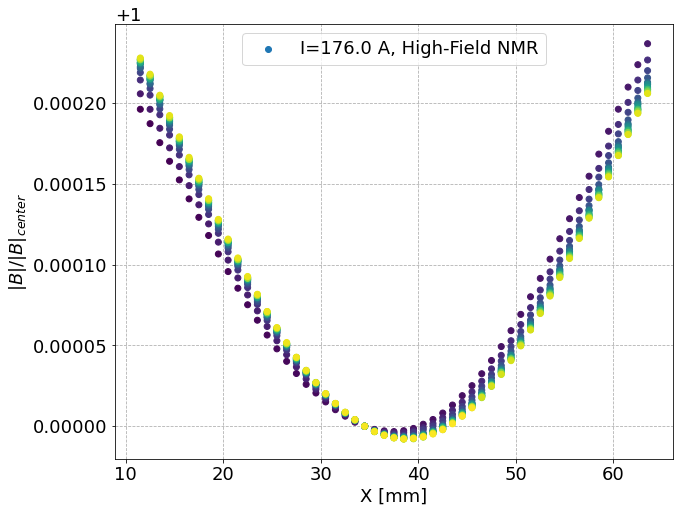

In [1493]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/df_high['sf'], c=range(len(df_high)), label=f'I={I:0.1f} A, High-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

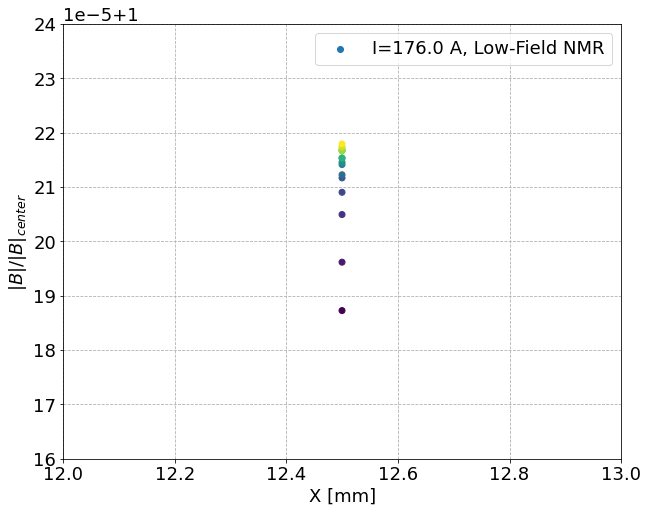

In [1494]:
# cut on run number
rmin = 0
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00016, 1.00024])

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [1495]:
# cut on run number
rmin = 0
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf / df_['NMR [T]'])

In [1496]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9997889651010705, 8.752369412000647e-06)

In [1497]:
# apply temperature correction

In [1498]:
# redo delta time from first file
df_high['seconds_delta'] = (df_high.index - df_temp.index[0]).total_seconds()
df_high['hours_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/60**2
df_high['days_delta'] = (df_high.index - df_temp.index[0]).total_seconds()/(24*60**2)
# temperature correction
B_corr = temp_correct(df_high, df_temp, tempcol="Yoke (near pole)")
# B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (near pole)")
df_high.loc[:, 'B_corr'] = B_corr
df_high.eval('deltaB = B_corr - `NMR [T]`', inplace=True)
# recalculate scale factor
# find field value at Hall probe location
sf_corr_list = []
for r in df_high.run:
    try:
        sf = df_high[np.isclose(df_high.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_high.run == r)].iloc[0]['B_corr']
    except:
        sf = df_high[(df_high.run == r)].iloc[-1]['B_corr']
    sf_corr_list.append(sf)
df_high['sf_corr'] = sf_corr_list

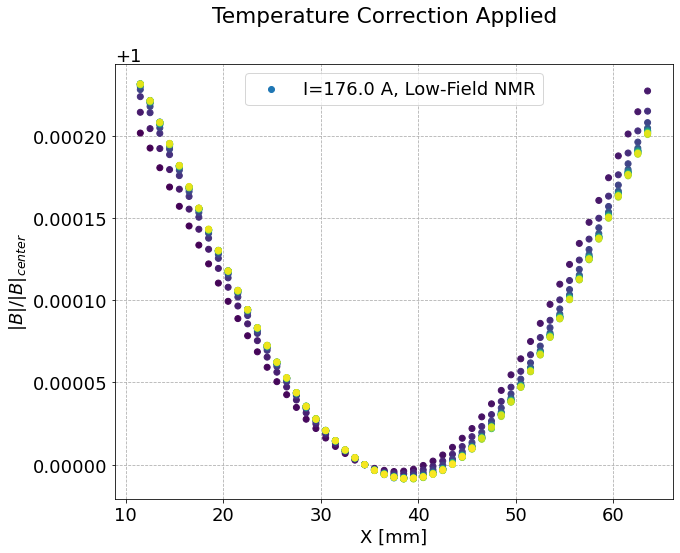

In [1499]:
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
ax.scatter(df_high['magnet_X_mm'], df_high['B_corr']/df_high['sf_corr'], c=range(len(df_high)), label=f'I={I:0.1f} A, Low-Field NMR')

# ax.set_xlim([8, 13])
# ax.set_ylim([1.0001, 1.00016])

fig.suptitle('Temperature Correction Applied')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

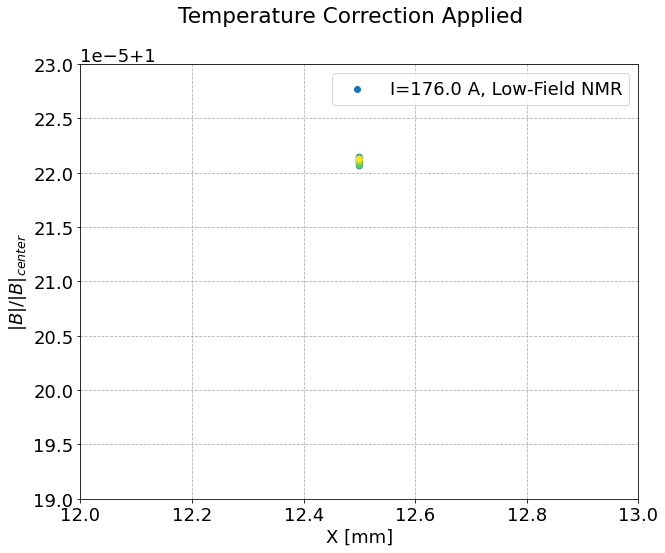

In [1505]:
# cut on run number
rmin = 6
df_ = df_high.query(f'run >= {rmin}')
# scaled field plot
fig, ax = plt.subplots()

#ax.scatter(df_high['magnet_X_mm'], df_high['NMR [T]']/sf_high, label=f'I={I:0.1f} A, High-Field NMR')
# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_['sf'], c=range(len(df_)), label=f'I={I:0.1f} A, Low-Field NMR')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/df_['sf_corr'], c=df_.run, label=f'I={I:0.1f} A, Low-Field NMR')

ax.set_xlim([12, 13])
ax.set_ylim([1.00019, 1.00023])

fig.suptitle("Temperature Correction Applied")

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B|$ [T]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
ax.legend();

In [1506]:
# cut on run number
#rmin = 0
rmin = 6
df_cut = df_high.query(f'run >= {rmin}')

Is = []
Brs = []
rs = df_cut.run.unique()
for run in df_cut.run.unique():
    if run in (df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3)]).run.values:
        df_ = df_cut[np.isclose(df_cut.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df_cut.run == run)].copy().iloc[0]
        Is.append(abs(df_["Magnet Current [A]"].mean()))
        Brs.append(df_.sf_corr / df_['B_corr'])

In [1507]:
np.mean(Brs), np.std(Brs, ddof=1)

(0.9997789812555966, 2.763190797515253e-07)

In [1508]:
len(Brs)

9

In [1512]:
t0 = df_high.iloc[0].Time
tf = df_high.iloc[-1].Time

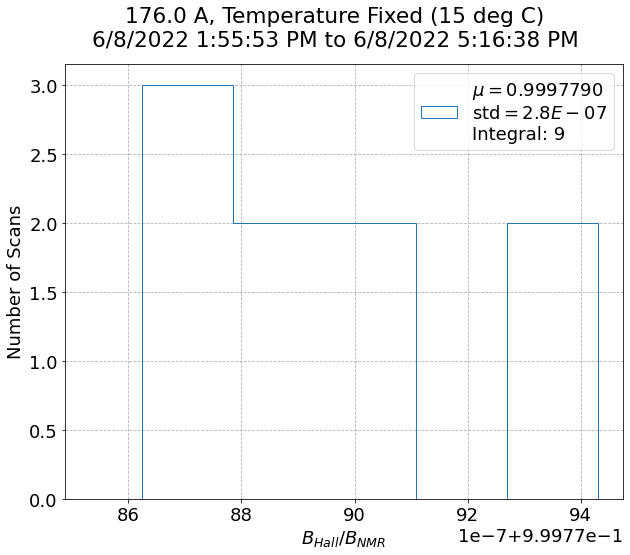

In [1513]:
fig, ax = plt.subplots()

label_temp = r'$\mu = {0:.7f}$'+ '\n' + 'std' + r'$= {1:.1E}$' + '\n' +  'Integral: {2}'

n, bins, patches = ax.hist(Brs, bins=5, histtype='step', label=label_temp.format(np.mean(Brs), np.std(Brs, ddof=1), len(Brs)))

xme = np.mean(Brs)
xmi = np.min(Brs)
xma = np.max(Brs)
xli = np.max(np.abs([xme-xmi, xma-xme])) * 1.1

ax.set_xlim([xme-xli, xme+xli])

# ax.set_xlabel(r'$\frac{B_{Hall}}{B_{NMR}}$')
ax.set_xlabel(r'$B_{Hall}/B_{NMR}$')
ax.set_ylabel('Number of Scans')
fig.suptitle(f'{I:0.1f} A, Temperature Fixed (15 deg C)\n{t0} to {tf}')
ax.legend();
# ax.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0));

In [1514]:
len(df_high.run.unique())

15

# All 1D and 3D Scans (B Ratio vs. I)

## All Files

In [1421]:
files_all = [
    # 2022 Data
         '2022-05-25 184012.txt', # low NMR, 128 A, 400k, 3D
         '2022-05-26 100634.txt', # low NMR, 128 A, 400k # 0
         '2022-05-26 102836.txt', # high NMR, 128 A, 400k
         '2022-05-26 113036.txt', # low NMR, 42 A, 130k
         '2022-05-26 121828.txt', # low NMR, 56 A, 175k
         '2022-05-26 123926.txt', # low NMR, 80 A, 250k
         '2022-05-26 130630.txt', # low NMR, 80 A, 250k (2)
         '2022-05-26 133558.txt', # low NMR, 80 A, 250k (3)
         '2022-05-26 140638.txt', # low NMR, 104 A, 325k
         '2022-05-26 144217.txt', # low NMR, 128 A, 400k
         '2022-05-26 150239.txt', # high NMR, 128 A, 400k
         '2022-05-26 153353.txt', # high NMR, 144 A, 450k # 10
         '2022-05-26 160409.txt', # high NMR, 160 A, 500k
         '2022-05-26 163243.txt', # high NMR, 176 A, 550k
         '2022-05-26 170057.txt', # high NMR, 192 A, 600k
         '2022-05-26 173002.txt', # high NMR, 208 A, 650k
         '2022-05-26 175911.txt', # high NMR, 224 A, 700k
         '2022-05-26 182815.txt', # high NMR, 240 A, 750k
         '2022-05-26 190126.txt', # high NMR, 256 A, 800k
         '2022-05-26 193002.txt', # high NMR, 272 A, 850k -- index 18
         '2022-05-26 200005.txt', # high NMR, 288 A, 900k
         ###'2022-05-26 202323.txt', # high NMR, 288 A, 900k, 3D overnight. Note that this one missed 34.5 mm, BAD
         '2022-05-27 080822.txt', # high NMR, 288 A, 900k # 20
         '2022-05-27 083743.txt', # high NMR, 300 A, 940k -- Power Supply Limit
         '2022-05-27 090821.txt', # high NMR, -300 A, -940k -- Power Supply Limit
         '2022-05-27 094135.txt', # low NMR, 42 A, 130k
         '2022-05-27 101134.txt', # low NMR, -42 A, 130k
         '2022-05-27 103216.txt', # low NMR, -42 A, 130k
         '2022-05-27 105803.txt', # low NMR, 42 A, 130k -- degaussed starting at higher field (600k)
         '2022-05-27 111726.txt', # low NMR, 42 A, 130k
         '2022-05-27 123838.txt', # low NMR, 42 A, 130k, enclosure set 45 C, actual 27.5 C
         '2022-05-27 125726.txt', # low NMR, 42 A, 130k, enclosure set 45 C, actual 28.8 C 
         '2022-05-27 132405.txt', # low NMR, -42 A, 130k -- better degauss, enclosure set 45 C, actual 30 C # 30
         '2022-05-27 140740.txt', # high NMR, 272 A, 850k -- better degauss, enclosure set 45 C, actual ?? C, 0.5mm scan -- 31
         '2022-05-27 162535.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual 40 C -- 32
         '2022-05-27 171220.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual ?? C -- 33
         '2022-05-27 180522.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual ?? C, 0.5 mm scan -- 34
         '2022-05-28 165647.txt', # high NMR, 272 A, 850k, enclosure set 45 C, actual 45 C -- 35
         '2022-05-28 172957.txt', # high NMR, 272 A, 850k, 45 deg C, 3D
         ## MISSING
         '2022-05-29 224746.txt', # high, 272 A, 1D
         '2022-05-29 224746.txt', # high, 272 A, 1D
         '2022-05-29 231658.txt', # high, 272 A, 1D, 0.5 mm step size
         '2022-05-29 235815.txt', # high, 272 A, 1D, 0.5 mm step size
         '2022-05-30 012134.txt', # high, 272 A, 1D, 1 mm step size
         '2022-05-31 085725.txt', # high, 272 A, 3D, 18 deg C
#          '2022-05-31 225539.txt', # TEST ONLY!
         '2022-05-31 231343.txt', # high, 272 A, 36 1D scans, 18 deg C
        ###
         '2022-06-01 094148.txt', # low NMR, 56 A, 175k, enclosure at 18 deg C -- check this one
         '2022-06-01 101917.txt', # low NMR, 56 A, 175k, intentional saturation
         '2022-06-01 124915.txt', # low NMR, 80 A, 250k, intentional saturation
         '2022-06-01 131552.txt', # low NMR, 104 A, 325k, intentional saturation
         '2022-06-01 135708.txt', # low NMR, 128 A, 400k, intentional saturation
         '2022-06-01 142807.txt', # low NMR, 42 A, 130k, intentional saturation -- 81 1D scans # 40
         '2022-06-02 121043.txt', # low NMR, 42 A, 130k, 3D, 18 deg C
         '2022-06-03 141648.txt', # low NMR, 42 A, 130k, right after changing temp from 18 deg C to 45 deg C -- 169 1D scans
         '2022-06-05 013328.txt', # low NMR, 42 A, 130k, 3D, 45 deg C     
         '2022-06-06 115947.txt', # low NMR, 42 A, 130k, after stabilized again at 18 deg C -- 4 1D scans
         '2022-06-06 145901.txt', # low NMR, 56 A, 175k, temp stable at 18 deg C -- 169 (did not finish all) 1D scans. Thomas ran standard degauss. See how shape changes in time.
         '2022-06-07 095924.txt', # low NMR, 56 A, 175k, temp stable at 15 deg C after cycle to 45 deg C back to 15 deg C -- 25 1D scans.
         '2022-06-07 173843.txt', # high NMR, 272 A, 850k, 169 1D scans, temp at 15 deg C
         '2022-06-08 135518.txt', # high NMR, 176 A, 550k, 169 1D scans, temp at 15 deg C -- should be ~1 T
        ]

nmr_low_all = [
    # 2022 data
           True,
           True, # 0
           False,
           True,
           True,
           True,
           True,
           True,
           True,
           True,
           False,
           False, # 10
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           False,
           ### False, # BAD! 3D
           False, # 20
           False,
           False,
           True,
           True,
           True,
           True,
           True,
           True,
           True,
           True, # 30
           False,
           False,
           False,
           False,
           False,
           False, # 3D
    ## MISSING
           False,
           False,
           False,
           False,
           False,
           False, # 3D
           # False, # TEST ONLY!
           False,
    ####
           True,
           True,
           True,
           True,
           True,
           True, # 40
           True,
           True,
           True,
           True,
           True,
           True,
           False,
           False,
          ]

tempfiles_all = [
    # 2022 data
             '2022-05-25 182823slow.txt',
             '2022-05-26 093219slow.txt',
             '2022-05-31 085349slow.txt',
             '2022-06-06 115655slow.txt',
             '2022-06-07 095827slow.txt',
            ]

In [1422]:
len(files_all), len(nmr_low_all)

(59, 59)

In [1423]:
ddir_full = ddir+'temp_pole_to_pole_05-25-22/'

## Analyze

In [1424]:
indexes_850k = [18, 31, 32, 33, 34, 35]

In [1425]:
itemgetter(*indexes_850k)(files)

('2022-05-26 193002.txt',
 '2022-05-27 140740.txt',
 '2022-05-27 162535.txt',
 '2022-05-27 171220.txt',
 '2022-05-27 180522.txt',
 '2022-05-28 165647.txt')

In [1426]:
%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [1427]:
def process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, keep_incomplete=False, prof=False):
    # now has a long runtime -- a few minutes
    t0 = time()
    t0_load = time()
    print("Loading Scans")
    i = 0
    dfs = []
    if prof:
        fall = files_all[:10]
        nlall = nmr_low_all[:10]
    else:
        fall = files_all
        nlall = nmr_low_all
    # for f, nl in zip(files_all, nmr_low_all): # all
    for f, nl in zip(fall, nlall):
    #for f, nl in zip(files, nmr_low): # all
    # for f, nl in zip(itemgetter(*indexes_850k)(files), itemgetter(*indexes_850k)(nmr_low)): # 850k runs only
        df_ = load_data(ddir_full+f, low_NMR=nl).iloc[1:]
        # set runs
        run_list = []
        for index, new in enumerate(np.concatenate([[False], np.diff(df_['magnet_X_mm'])<0])):
            if new:
                i+=1
            run_list.append(int(i))
        df_.loc[:, 'run'] = run_list
        # new run for next file
        i+=1
#         # flag 3D or not
#         list_3D = []
#         for r in df_.run:
#             df_run = df_[df_.run]
        '''
        # find field value at Hall probe location
        sf_list = []
        complete_list = []
        for r in df_.run:
            #df_run = df_.query(f'run == {r}')
            df_run = df_[df_.run == r]
            # check if 3D or not:
            if len(df_run['Zaber_Pattern_Y'].unique()) > 1:
                df_line = df_run[np.isclose(df_run.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df_run.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)].copy()
            else:
                df_line = df_run.copy()
            try:
    #             sf = df_line[np.isclose(df_line.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df_line.run == r)].iloc[0]['NMR [T]']
                sf = df_line[np.isclose(df_line.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]['NMR [T]']
            except:
                sf = df_line.iloc[-1]['NMR [T]']
            sf_list.append(sf)
            # flag complete or not
            if (df_run.magnet_X_mm.max() < 34):
                #print(f'Run {run} incomplete! Maximum X = {df_.magnet_X_mm.max()}')
                complete = False
            else:
                complete = True
            complete_list.append(complete)
        df_['sf'] = sf_list
        df_['complete'] = complete_list
        '''
        # whether low or high?
        df_.loc[:, 'low_NMR'] = nl
        dfs.append(df_)

    df = pd.concat(dfs, ignore_index=False)
    # remove 3D
    df = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)] 
    
    tf_load = time()
    print(f"Finished Loading Scans Into 'df'! Runtime: {tf_load-t0_load} s\n")

    t0_temp = time()
    print("Loading Temps")
    # load temperature data
    dfs_temp = []
    for f in tempfiles_all:
        df_ = load_data(ddir_full+f, low_NMR=True)#.iloc[1:]
        dfs_temp.append(df_)

    df_temp = pd.concat(dfs_temp, ignore_index=False)

    tf_temp = time()
    print(f"Finished Loading Temps Into 'df_temp'! Runtime: {tf_temp-t0_temp} s\n")

    t0_time = time()
    print("Resetting time to common t0")
    # redo delta time from first temp point
    t_init = df_temp.index[0]
    delta_temp = df_temp.index - t_init
    delta_df = df.index - t_init
    df_temp['seconds_delta'] = delta_temp.total_seconds()
    df_temp['hours_delta'] = delta_temp.total_seconds()/60**2
    df_temp['days_delta'] = delta_temp.total_seconds()/(24*60**2)
    df['seconds_delta'] = delta_df.total_seconds()
    df['hours_delta'] = delta_df.total_seconds()/60**2
    df['days_delta'] = delta_df.total_seconds()/(24*60**2)

    tf_time = time()
    print(f"Finished resetting times! Runtime: {tf_time-t0_time} s\n")

    # cut low point that not all measurements have
    ## df = df.query('magnet_X_mm > 11').copy()

    t0_tcorr = time()
    print("Applying temperature correction")
    # temperature correction
    B_corr = temp_correct(df, df_temp, tempcol="Yoke (near pole)")
    # B_corr = temp_correct(df, df_temp, T0=20, tempcol="Yoke (center magnet)")
    df.loc[:, 'B_corr'] = B_corr
    df.eval('deltaB = B_corr - `NMR [T]`', inplace=True)

    tf_tcorr = time()
    print(f"Finished temperature correction! Runtime: {tf_tcorr-t0_tcorr} s\n")

    t0_sf = time()
    print("Recalculating scale factor, with temperature correction - 'sf_corr'")
    # recalculate scale factor
    # find field value at Hall probe location
    
    # grab point for correcting
    df_sfs = df[np.isclose(df.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3)]
    
    sf_list = []
    complete_list = []
    sf_corr_list = []
    for r in df.run:
        ###### old
    #     try:
    #         sf = df[np.isclose(df.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3) & (df.run == r)].iloc[0]['B_corr']
    #     except:
    #         sf = df.iloc[-1]['NMR [T]']
    #     sf_corr_list.append(sf)
        ##### new
        #df_run = df.query(f'run == {r}')
        df_run = df[df.run == r]
        try:
            df_p = df_sfs[df_sfs.run == r].iloc[0]
        except:
            df_p = df_run.iloc[-1]
        # check if 3D or not:
#         if len(df_run['Zaber_Pattern_Y'].unique()) > 1:
#             df_line = df_run[np.isclose(df_run.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df_run.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3)]#.copy()
#         else:
#             df_line = df_run#.copy()
        df_line = df_run
#         try:
#             df_p = df_line[np.isclose(df_line.magnet_X_mm.values, 34.5, atol=1e-1, rtol=1e-3)].iloc[0]
#         except:
#             df_p = df_line.iloc[-1]
        sf_c = df_p['B_corr']
        sf = df_p['NMR [T]']
        sf_corr_list.append(sf_c)
        sf_list.append(sf)
        # flag complete or not
        if (df_run.magnet_X_mm.max() < 34):
            #print(f'Run {run} incomplete! Maximum X = {df_.magnet_X_mm.max()}')
            complete = False
        else:
            complete = True
        complete_list.append(complete)
    df['sf'] = sf_list
    df['sf_corr'] = sf_corr_list
    df['complete'] = complete_list
    # remove points when magnet is off
    #df = df.query('`NMR [T]` > 0.19').copy()
    df = df[df['NMR [T]'] > 0.19].copy()
    # remove incomplete?
    if not keep_incomplete:
        df = df[df['complete']].copy()
    tf_sf = time()
    print(f"Finished scale factor recalculation! Runtime: {tf_sf-t0_sf} s\n\n")
    tf_sf = time()
    print(f"Finished processing! Total Runtime: {tf_sf-t0} s")
    
    return df, df_temp

### Profiling

In [1213]:
df, df_temp = process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 3.6028292179107666 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.23430132865905762 s

Resetting time to common t0
Finished resetting times! Runtime: 0.0018117427825927734 s

Applying temperature correction
Finished temperature correction! Runtime: 0.01931929588317871 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 3.560635805130005 s


Finished processing! Total Runtime: 7.419300079345703 s


In [1217]:
# original function
%lprun -f process_pole_to_pole process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 9.219858884811401 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.8038091659545898 s

Resetting time to common t0
Finished resetting times! Runtime: 0.002930164337158203 s

Applying temperature correction
Finished temperature correction! Runtime: 0.049933433532714844 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 9.113704681396484 s


Finished processing! Total Runtime: 19.191083431243896 s


In [1220]:
# removing query
%lprun -f process_pole_to_pole process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 3.7671191692352295 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.7904014587402344 s

Resetting time to common t0
Finished resetting times! Runtime: 0.002742767333984375 s

Applying temperature correction
Finished temperature correction! Runtime: 0.049536705017089844 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 3.1375129222869873 s


Finished processing! Total Runtime: 7.7477757930755615 s


In [1221]:
df, df_temp = process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 1.6620395183563232 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.22042322158813477 s

Resetting time to common t0
Finished resetting times! Runtime: 0.0016837120056152344 s

Applying temperature correction
Finished temperature correction! Runtime: 0.019367218017578125 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 1.500267505645752 s


Finished processing! Total Runtime: 3.404033660888672 s


In [1227]:
# combining some loops / queries
%lprun -f process_pole_to_pole process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 0.5263533592224121 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.7876667976379395 s

Resetting time to common t0
Finished resetting times! Runtime: 0.00255584716796875 s

Applying temperature correction
Finished temperature correction! Runtime: 0.048017024993896484 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 3.381525993347168 s


Finished processing! Total Runtime: 4.746723175048828 s


In [1226]:
df, df_temp = process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 0.14680957794189453 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.2215893268585205 s

Resetting time to common t0
Finished resetting times! Runtime: 0.0015645027160644531 s

Applying temperature correction
Finished temperature correction! Runtime: 0.019686460494995117 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 1.6272616386413574 s


Finished processing! Total Runtime: 2.0171866416931152 s


In [1230]:
# remove all but final "copy()"
%lprun -f process_pole_to_pole process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 0.5162761211395264 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.7867622375488281 s

Resetting time to common t0
Finished resetting times! Runtime: 0.002722024917602539 s

Applying temperature correction
Finished temperature correction! Runtime: 0.047913312911987305 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 3.32824444770813 s


Finished processing! Total Runtime: 4.682482004165649 s


In [1231]:
df, df_temp = process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 0.15052032470703125 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.2186439037322998 s

Resetting time to common t0
Finished resetting times! Runtime: 0.0015752315521240234 s

Applying temperature correction
Finished temperature correction! Runtime: 0.01912713050842285 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 1.508291482925415 s


Finished processing! Total Runtime: 1.8984172344207764 s


In [1335]:
# remove unnecessary 3D data. Find scale factor point for all runs at once
%lprun -f process_pole_to_pole process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 0.5144126415252686 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.7870101928710938 s

Resetting time to common t0
Finished resetting times! Runtime: 0.002509593963623047 s

Applying temperature correction
Finished temperature correction! Runtime: 0.05058169364929199 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 0.3112764358520508 s


Finished processing! Total Runtime: 1.6661875247955322 s


In [1336]:
df, df_temp = process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, prof=True)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 0.15248370170593262 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.22279715538024902 s

Resetting time to common t0
Finished resetting times! Runtime: 0.0015015602111816406 s

Applying temperature correction
Finished temperature correction! Runtime: 0.018637895584106445 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 0.13510751724243164 s


Finished processing! Total Runtime: 0.5307207107543945 s


### Standard Running

In [1515]:
df, df_temp = process_pole_to_pole(files_all, nmr_low_all, tempfiles_all, keep_incomplete=False, prof=False)

Loading Scans
Finished Loading Scans Into 'df'! Runtime: 2.026858329772949 s

Loading Temps
Finished Loading Temps Into 'df_temp'! Runtime: 0.21961402893066406 s

Resetting time to common t0
Finished resetting times! Runtime: 0.0019412040710449219 s

Applying temperature correction
Finished temperature correction! Runtime: 0.8613986968994141 s

Recalculating scale factor, with temperature correction - 'sf_corr'
Finished scale factor recalculation! Runtime: 8.560631513595581 s


Finished processing! Total Runtime: 11.67098617553711 s


In [1516]:
len(files_all)

59

In [1517]:
len(df)

17713

In [1518]:
#df = df.query('`NMR [T]` > 0.19').copy()

In [1519]:
len(df)

17713

In [1520]:
df.shape

(17713, 28)

In [1521]:
len(df.run.unique())

502

In [1522]:
df[['NMR [T]', 'B_corr', 'deltaB', 'sf', 'sf_corr']]

,NMR [T],B_corr,deltaB,sf,sf_corr
Datetime,,,,,
2022-05-25 19:10:28,0.735824,0.735829,5.748563e-06,0.735734,0.735732
2022-05-25 20:14:23,0.735828,0.735831,3.664912e-06,0.735734,0.735732
2022-05-25 21:19:20,0.735827,0.735830,2.108231e-06,0.735734,0.735732
2022-05-25 22:23:48,0.735824,0.735825,9.791361e-07,0.735734,0.735732
2022-05-25 23:28:48,0.735817,0.735818,2.422031e-07,0.735734,0.735732
...,...,...,...,...,...
2022-06-08 17:15:39,0.983264,0.983263,-1.860001e-06,0.983269,0.983268
2022-06-08 17:15:53,0.983267,0.983265,-1.986358e-06,0.983269,0.983268
2022-06-08 17:16:08,0.983271,0.983269,-2.121741e-06,0.983269,0.983268


In [1523]:
plt.rcParams.update({"text.usetex": False})

<AxesSubplot:xlabel='Datetime'>

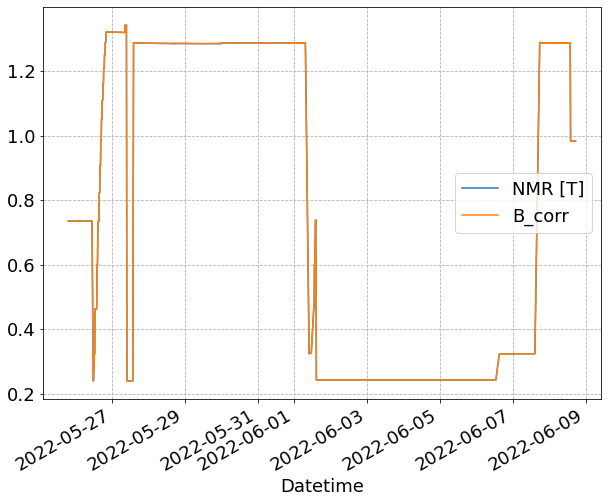

In [1524]:
# NMR
df.query('`NMR [T]` > 0.1')[['NMR [T]', 'B_corr']].plot()

<AxesSubplot:xlabel='Datetime'>

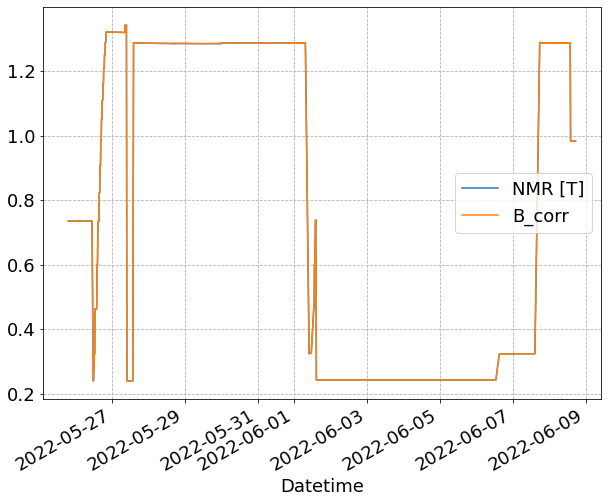

In [1525]:
df[['NMR [T]', 'B_corr']].plot()

<AxesSubplot:xlabel='Datetime'>

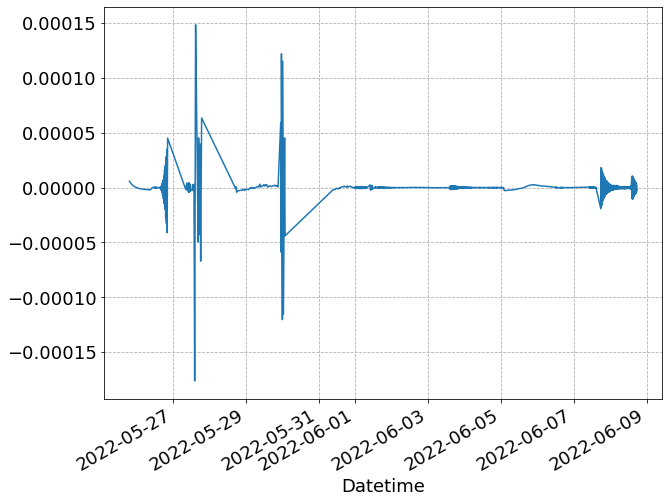

In [1526]:
df.query('`NMR [T]` > 0.1')['deltaB'].plot()

In [1527]:
df['deltaB'].describe()

count    1.771300e+04
mean    -5.531371e-19
std      1.188577e-05
min     -1.761118e-04
25%     -1.758627e-07
50%      1.714994e-09
75%      1.855582e-07
max      1.482809e-04
Name: deltaB, dtype: float64

In [1528]:
df_temp['Yoke (near pole)']

Datetime
2022-05-25 18:28:24    14.997712
2022-05-25 18:28:47    14.994810
2022-05-25 18:33:47    14.947301
2022-05-25 18:38:47    14.910321
2022-05-25 18:43:48    14.869518
                         ...    
2022-06-08 16:55:24    18.344227
2022-06-08 17:00:24    18.283186
2022-06-08 17:05:24    18.223364
2022-06-08 17:10:24    18.158577
2022-06-08 17:15:24    18.105528
Name: Yoke (near pole), Length: 3458, dtype: float64

In [1529]:
df.run.unique()

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [1530]:
df['Magnet Current [A]']

Datetime
2022-05-25 19:10:28    128.035840
2022-05-25 20:14:23    128.035840
2022-05-25 21:19:20    128.035897
2022-05-25 22:23:48    128.035840
2022-05-25 23:28:48    128.036010
                          ...    
2022-06-08 17:15:39    176.047693
2022-06-08 17:15:53    176.047807
2022-06-08 17:16:08    176.047580
2022-06-08 17:16:23    176.047807
2022-06-08 17:16:38    176.047863
Name: Magnet Current [A], Length: 17713, dtype: float64

In [1531]:
dfs[0].magnet_X_mm.unique()

array([ 8.49976562, 10.49976562, 12.49976562, 14.49976562, 16.49976562,
       18.49976562, 20.49976562, 22.49976562, 24.49976562, 26.49976562,
       28.49976562, 30.49976562, 32.49976562, 34.49976562, 36.49976562])

In [1532]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,magnet_Y_mm,magnet_Z_mm,run,low_NMR,Yoke (near pole),B_corr,deltaB,sf,sf_corr,complete
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-05-25 19:10:28,5/25/2022 7:10:28 PM,128.035840,14.190767,0.735824,0.0,426758.0,426431.0,1718667.0,426758.0,166702.343750,...,124.999948,125.000043,0,True,14.664740,0.735829,5.748563e-06,0.735734,0.735732,True
2022-05-25 20:14:23,5/25/2022 8:14:23 PM,128.035840,14.189970,0.735828,0.0,431878.0,426431.0,1718667.0,431878.0,168702.343750,...,124.999948,125.000043,0,True,14.278855,0.735831,3.664912e-06,0.735734,0.735732,True
2022-05-25 21:19:20,5/25/2022 9:19:20 PM,128.035897,14.189603,0.735827,0.0,436998.0,426431.0,1718667.0,436998.0,170702.343750,...,124.999948,125.000043,0,True,13.990562,0.735830,2.108231e-06,0.735734,0.735732,True
2022-05-25 22:23:48,5/25/2022 10:23:48 PM,128.035840,14.188622,0.735824,0.0,442118.0,426431.0,1718667.0,442118.0,172702.343750,...,124.999948,125.000043,0,True,13.781458,0.735825,9.791361e-07,0.735734,0.735732,True
2022-05-25 23:28:48,5/25/2022 11:28:48 PM,128.036010,14.188388,0.735817,0.0,447238.0,426431.0,1718667.0,447238.0,174702.343750,...,124.999948,125.000043,0,True,13.644980,0.735818,2.422031e-07,0.735734,0.735732,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-08 17:15:39,6/8/2022 5:15:39 PM,176.047693,20.625183,0.983264,0.0,501305.0,426426.0,1664877.0,501305.0,195822.265625,...,124.997995,125.001762,504,False,18.102875,0.983263,-1.860001e-06,0.983269,0.983268,True
2022-06-08 17:15:53,6/8/2022 5:15:53 PM,176.047807,20.624200,0.983267,0.0,503865.0,426426.0,1664877.0,503865.0,196822.265625,...,124.997995,125.001762,504,False,18.100400,0.983265,-1.986358e-06,0.983269,0.983268,True
2022-06-08 17:16:08,6/8/2022 5:16:08 PM,176.047580,20.623117,0.983271,0.0,506425.0,426426.0,1664877.0,506425.0,197822.265625,...,124.997995,125.001762,504,False,18.097747,0.983269,-2.121741e-06,0.983269,0.983268,True


In [1533]:
df.query('run == 1')['Yoke (near pole)']

Datetime
2022-05-26 10:07:21    13.222377
2022-05-26 10:07:57    13.222456
2022-05-26 10:08:33    13.221443
2022-05-26 10:09:09    13.220429
2022-05-26 10:09:45    13.219415
2022-05-26 10:10:23    13.218345
2022-05-26 10:10:59    13.217332
2022-05-26 10:11:35    13.216318
2022-05-26 10:12:11    13.215305
2022-05-26 10:12:48    13.214505
2022-05-26 10:13:24    13.215666
2022-05-26 10:13:59    13.216794
2022-05-26 10:14:33    13.217891
2022-05-26 10:15:10    13.219084
2022-05-26 10:15:43    13.220148
2022-05-26 10:16:19    13.221310
2022-05-26 10:16:56    13.222503
2022-05-26 10:17:45    13.224083
2022-05-26 10:18:20    13.223663
2022-05-26 10:18:55    13.223197
2022-05-26 10:19:31    13.222719
2022-05-26 10:20:07    13.222240
2022-05-26 10:20:40    13.221801
2022-05-26 10:21:17    13.221308
2022-05-26 10:21:53    13.220829
2022-05-26 10:22:45    13.220138
Name: Yoke (near pole), dtype: float64

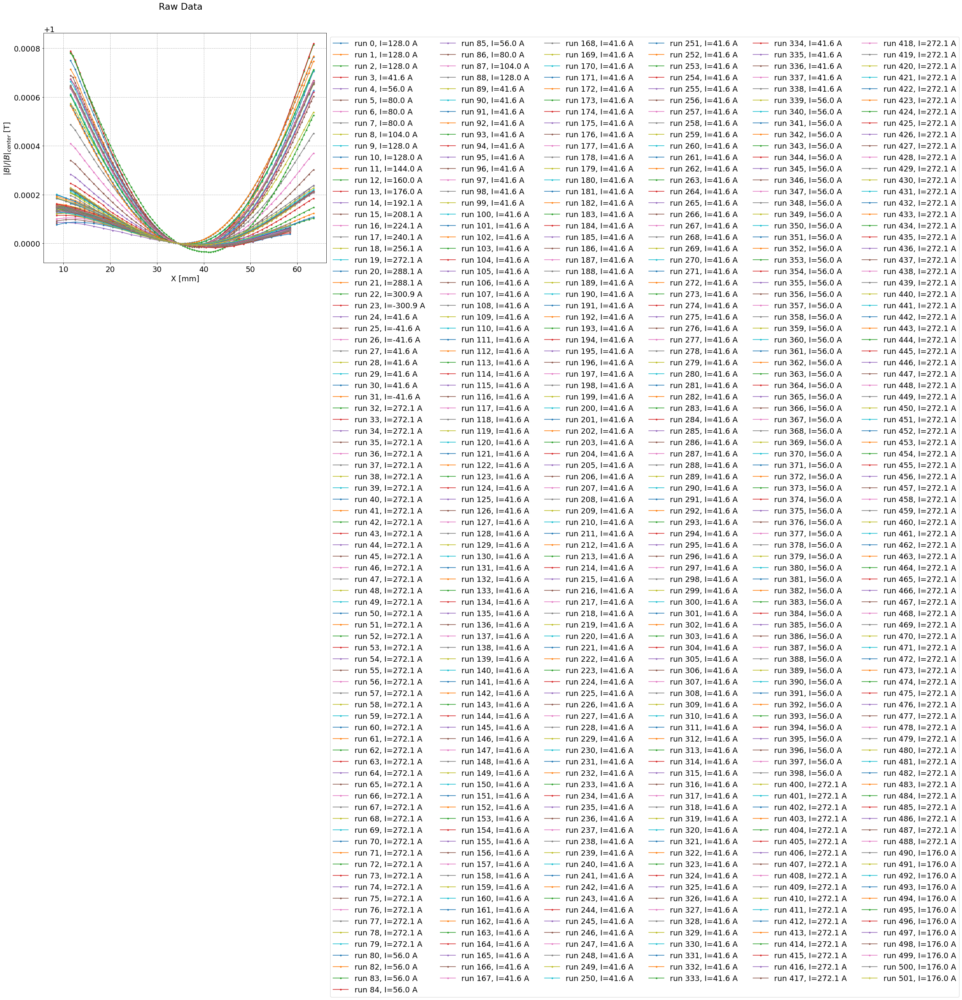

In [1447]:
fig, ax = plt.subplots(figsize=(12, 10))
for run in df.run.unique():
    df_ = df[df.run == run]
    #df_ = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3) & (df.run == run)].copy()
    #ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_.sf, label=f'run {run}, I={df_["Magnet Current [A]"].mean():0.1f} A')
    if run==df.run.max():
        m = '+'
    else:
        m = '.'
    ax.plot(df_['magnet_X_mm'], df_['NMR [T]']/df_.sf, marker=m, label=f'run {run}, I={df_["Magnet Current [A]"].mean():0.1f} A')

fig.suptitle('Raw Data')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B| / |B|_{center}$ [T]')
ax.legend(bbox_to_anchor=(1.0,1.0), ncol=6);

In [1448]:
len(df.run.unique())

499

<AxesSubplot:xlabel='Datetime'>

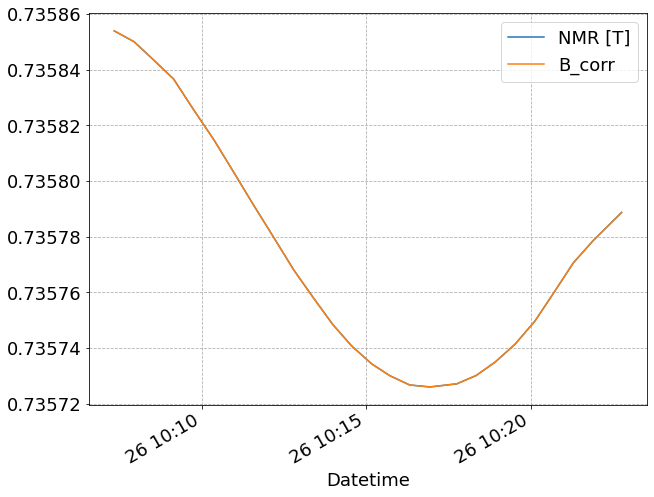

In [1449]:
df.query('run == 1')[['NMR [T]', 'B_corr']].plot()

In [1450]:
df.query('run == 1')['Yoke (near pole)'].mean()

13.220049949434822

In [1451]:
df.query('run == 1')['Yoke (near pole)']

Datetime
2022-05-26 10:07:21    13.222377
2022-05-26 10:07:57    13.222456
2022-05-26 10:08:33    13.221443
2022-05-26 10:09:09    13.220429
2022-05-26 10:09:45    13.219415
2022-05-26 10:10:23    13.218345
2022-05-26 10:10:59    13.217332
2022-05-26 10:11:35    13.216318
2022-05-26 10:12:11    13.215305
2022-05-26 10:12:48    13.214505
2022-05-26 10:13:24    13.215666
2022-05-26 10:13:59    13.216794
2022-05-26 10:14:33    13.217891
2022-05-26 10:15:10    13.219084
2022-05-26 10:15:43    13.220148
2022-05-26 10:16:19    13.221310
2022-05-26 10:16:56    13.222503
2022-05-26 10:17:45    13.224083
2022-05-26 10:18:20    13.223663
2022-05-26 10:18:55    13.223197
2022-05-26 10:19:31    13.222719
2022-05-26 10:20:07    13.222240
2022-05-26 10:20:40    13.221801
2022-05-26 10:21:17    13.221308
2022-05-26 10:21:53    13.220829
2022-05-26 10:22:45    13.220138
Name: Yoke (near pole), dtype: float64

In [1452]:
1e-4 / 1

0.0001

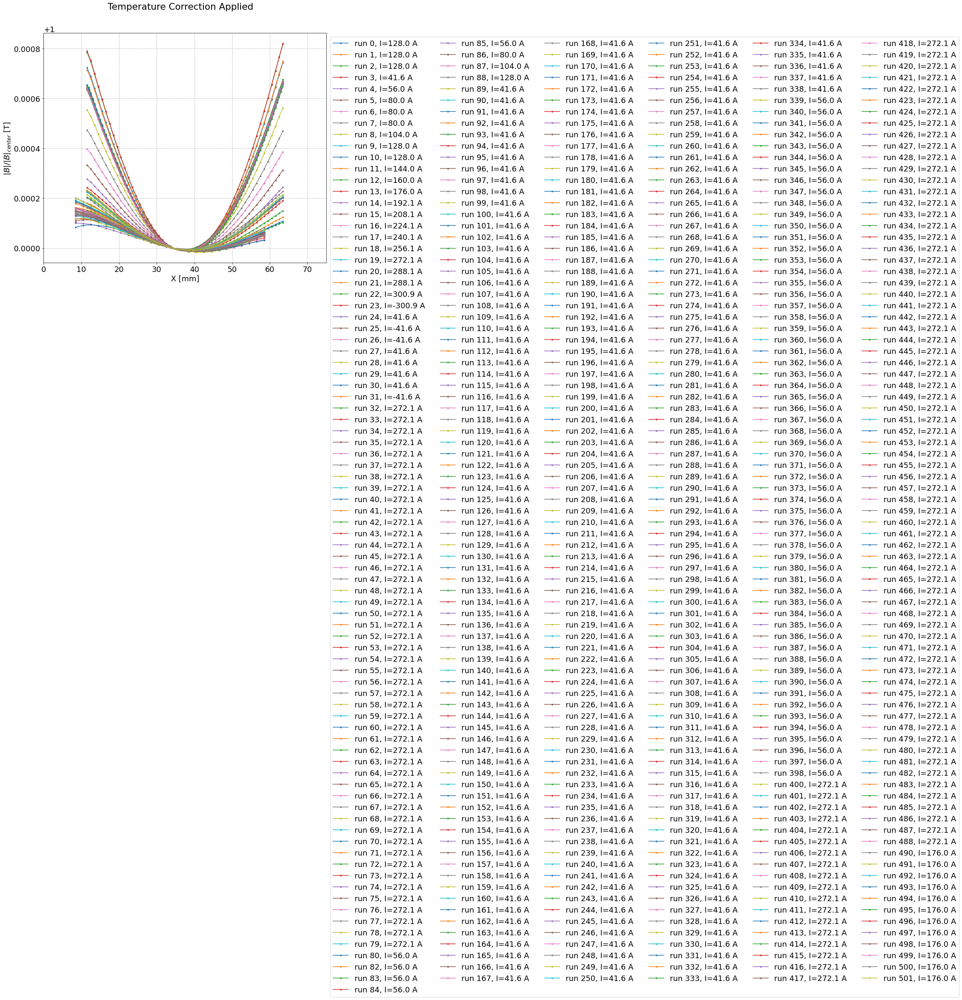

In [1453]:
fig, ax = plt.subplots(figsize=(12, 10))
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy()
    df_ = df[df.run == run]
    #df_ = df[np.isclose(df.magnet_Y_mm, 125, atol=1e-1, rtol=1e-3) & np.isclose(df.magnet_Z_mm, 125, atol=1e-1, rtol=1e-3) & (df.run == run)].copy()
    #ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_.sf, label=f'run {run}, I={df_["Magnet Current [A]"].mean():0.1f} A')
    if run==df.run.max():
        m = '+'
    else:
        m = '.'
    ax.plot(df_['magnet_X_mm'], df_['B_corr']/df_.sf_corr, marker=m, label=f'run {run}, I={df_["Magnet Current [A]"].mean():0.1f} A')
    if (df_.magnet_X_mm.max() < 34):
        print(f'Run {run} incomplete! Maximum X = {df_.magnet_X_mm.max()}')
ax.set_xlim([0, 75])
            
fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B| / |B|_{center}$ [T]')
ax.legend(bbox_to_anchor=(1.0,1.0), ncol=6);

In [1454]:
df.query('run == 1').iloc[0].Time

'5/26/2022 10:07:21 AM'

In [1534]:
r = 1
# t0 = '2022-05-27 14:00'
# tf = '2022-05-27 14:45'
t0 = df.query(f'run == {r}').iloc[0].Time
tf = df.query(f'run == {r}').iloc[-1].Time
df_temp.query(f'"{t0}" <= Datetime <= "{tf}"')['Yoke (near pole)']

Datetime
2022-05-26 10:07:44    13.222822
2022-05-26 10:12:44    13.214375
2022-05-26 10:17:46    13.224115
2022-05-26 10:22:45    13.220138
Name: Yoke (near pole), dtype: float64

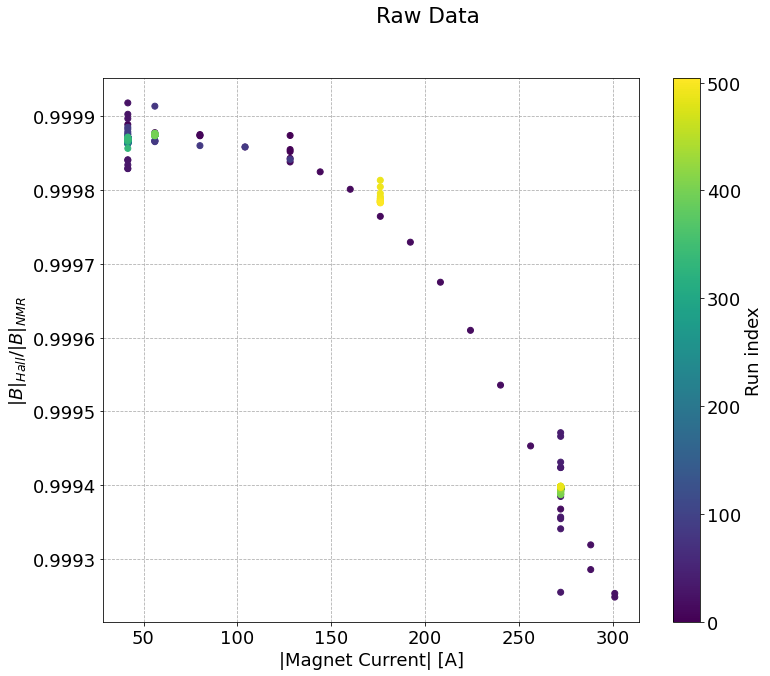

In [1535]:
fig, ax = plt.subplots(figsize=(12, 10))
Is = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
    #print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
#     Is.append(df_["Magnet Current [A]"].mean())
    Is.append(abs(df_["Magnet Current [A]"].mean()))
    Brs.append(df_.sf / df_['NMR [T]'])
    
sc = ax.scatter(Is, Brs, c=rs) #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index')

# ax.set_ylim([0.9992, 1.0000])

fig.suptitle('Raw Data')
ax.set_xlabel('|Magnet Current| [A]')
ax.set_ylabel(r'$|B|_{Hall} / |B|_{NMR}$');
# ax.legend();

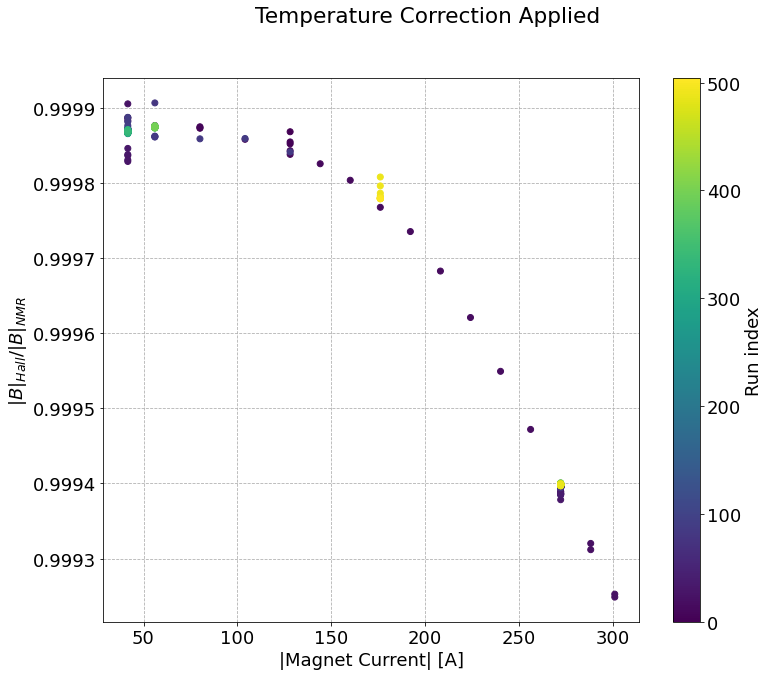

In [1536]:
fig, ax = plt.subplots(figsize=(12, 10))
Is = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
    #print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
#     Is.append(df_["Magnet Current [A]"].mean())
    Is.append(abs(df_["Magnet Current [A]"].mean()))
    Brs.append(df_.sf_corr / df_['B_corr'])
    
sc = ax.scatter(Is, Brs, c=rs) #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index')

# ax.set_ylim([0.9992, 1.0000])

fig.suptitle('Temperature Correction Applied')
ax.set_xlabel('|Magnet Current| [A]')
ax.set_ylabel(r'$|B|_{Hall} / |B|_{NMR}$');
# ax.legend();

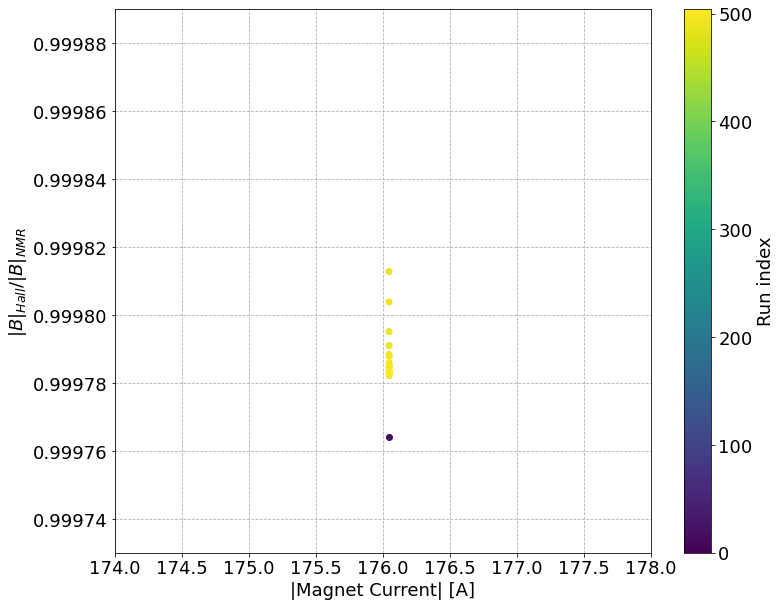

In [1537]:
# inspection
fig, ax = plt.subplots(figsize=(12, 10))
Is = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
    #print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
#     Is.append(df_["Magnet Current [A]"].mean())
    Is.append(abs(df_["Magnet Current [A]"].mean()))
    Brs.append(df_.sf / df_['NMR [T]'])
    
sc = ax.scatter(Is, Brs, c=rs) #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index')

# near 125
# ax.set_xlim([90, 150])
# ax.set_ylim([0.9998, 0.9999])
# near 280
# ax.set_xlim([275, 305])
# ax.set_ylim([0.99923, 0.99935])
# near 42
# ax.set_xlim([35, 50])
# ax.set_ylim([0.9998, 0.99995])
# near 56
# ax.set_xlim([52, 58])
# ax.set_ylim([0.99986, 0.99989])
# near 176
ax.set_xlim([174, 178])
ax.set_ylim([0.99973, 0.99989])

ax.set_xlabel('|Magnet Current| [A]')
ax.set_ylabel(r'$|B|_{Hall} / |B|_{NMR}$');
# ax.legend();

In [1538]:
Is = np.array(Is)
Brs = np.array(Brs)

In [1539]:
np.mean(Brs[(Is <= 44) & (Is >= 40)]), np.std(Brs[(Is <= 44) & (Is >= 40)], ddof=1)

(0.9998677622183259, 6.916534385576934e-06)

In [1540]:
# I0 = 56
I0 = 176
np.mean(Brs[(Is <= I0+1) & (Is >= I0-1)]), np.std(Brs[(Is <= I0+1) & (Is >= I0-1)], ddof=1)

(0.9997874015118243, 1.0517320013261658e-05)

In [1541]:
# I0 = 42
I0 = 56
len(Brs[(Is <= I0+1) & (Is >= I0-1)])

66

In [1542]:
len(Brs)

502

In [1543]:
Is

array([128.03589667, 128.03606667, 128.03606667,  41.61123433,
        56.01561767,  80.02279667,  80.02279667,  80.02274   ,
       104.02951667, 128.03612333, 128.03606667, 144.04111333,
       160.04485667, 176.04990333, 192.05319333, 208.05733333,
       224.06175667, 240.06504667, 256.0676    , 272.07145667,
       288.07480333, 288.07316   , 300.8762    , 300.88594667,
        41.60972133,  41.620658  ,  41.62066933,  41.610118  ,
        41.61012367,  41.610135  ,  41.610084  ,  41.62088467,
       272.07230667, 272.07038   , 272.07032333, 272.07004   ,
       272.06987   , 272.06975667, 272.07004   , 272.07004   ,
       272.07038   , 272.07038   , 272.07015333, 272.0697    ,
       272.06975667, 272.0697    , 272.06992667, 272.06975667,
       272.06981333, 272.06992667, 272.06992667, 272.07004   ,
       272.06998333, 272.07004   , 272.06975667, 272.07004   ,
       272.06998333, 272.06998333, 272.07004   , 272.07004   ,
       272.07009667, 272.07004   , 272.07009667, 272.07

In [1544]:
Brs

array([0.99987335, 0.99985167, 0.99985433, 0.99988819, 0.99987722,
       0.99987295, 0.99987462, 0.99987362, 0.99985781, 0.99983751,
       0.99984244, 0.99982416, 0.99980058, 0.99976395, 0.99972899,
       0.99967484, 0.99960974, 0.99953562, 0.99945333, 0.9993679 ,
       0.99928607, 0.99931949, 0.99925381, 0.99924883, 0.99991743,
       0.99990205, 0.99989627, 0.99983969, 0.99984057, 0.9998285 ,
       0.99982865, 0.99983353, 0.99925538, 0.99935489, 0.99935715,
       0.99934119, 0.99938752, 0.99938494, 0.99942407, 0.99942407,
       0.99946626, 0.99947131, 0.99943142, 0.99939562, 0.9993954 ,
       0.99939564, 0.99939526, 0.99939522, 0.99939519, 0.99939547,
       0.99939527, 0.99939547, 0.99939542, 0.99939511, 0.99939519,
       0.9993954 , 0.99939537, 0.99939571, 0.99939551, 0.99939511,
       0.99939575, 0.99939509, 0.9993951 , 0.99939512, 0.99939527,
       0.9993953 , 0.99939531, 0.99939533, 0.99939504, 0.99939551,
       0.99939513, 0.9993953 , 0.99939541, 0.99939522, 0.99939

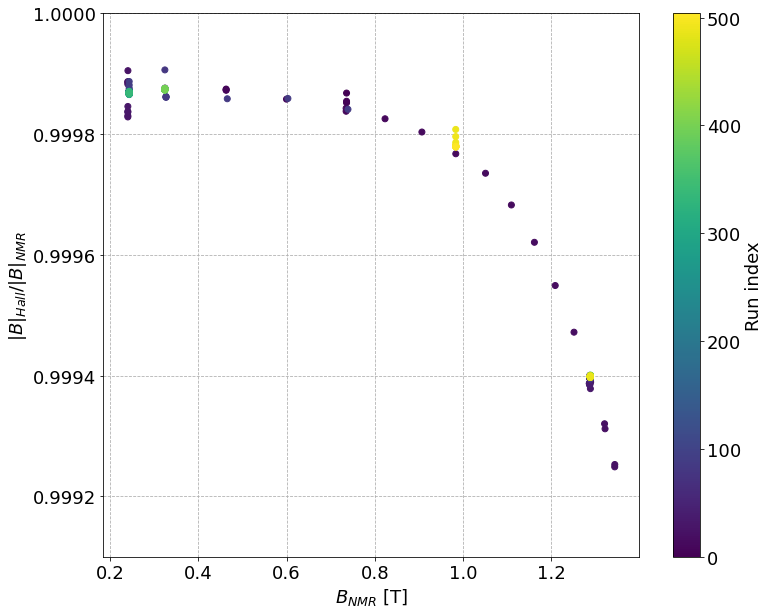

In [1545]:
# Ratio vs. B
fig, ax = plt.subplots(figsize=(12, 10))
Bs = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
#     print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
    ##Bs.append(df_.sf)
    #Bs.append(df_['NMR [T]'])
    #Brs.append(df_.sf / df_['NMR [T]'])
    Bs.append(df_['B_corr'])
    Brs.append(df_.sf_corr / df_['B_corr'])
    
sc = ax.scatter(Bs, Brs, c=rs) #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index')

ax.set_ylim([0.9991, 1.0000])

#ax.set_xlabel('B_{Hall} [T]')
ax.set_xlabel(r'$B_{NMR}$ [T]')
ax.set_ylabel(r'$|B|_{Hall} / |B|_{NMR}$');
# ax.legend();

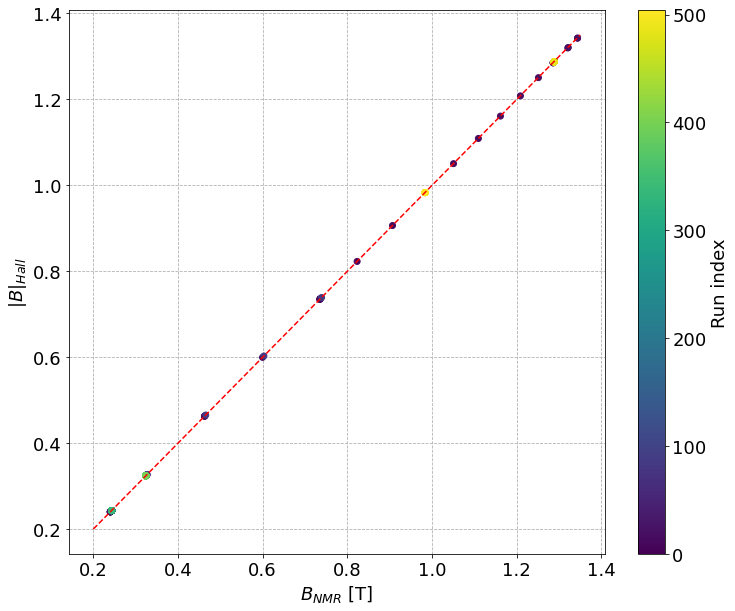

In [1546]:
# B_Hall vs. B_NMR
fig, ax = plt.subplots(figsize=(12, 10))
Bs = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
#     print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
    ##Bs.append(df_.sf)
    #Bs.append(df_['NMR [T]'])
    #Brs.append(df_.sf / df_['NMR [T]'])
    Bs.append(df_['B_corr'])
    Brs.append(df_.sf_corr) #/ df_['B_corr'])
    
sc = ax.scatter(Bs, Brs, c=rs) #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index')

ax.plot([0.2, 1.35],[0.2, 1.35], 'r--')

# ax.set_ylim([0.99875, 1.0000])

#ax.set_xlabel('B_{Hall} [T]')
ax.set_xlabel(r'$B_{NMR}$ [T]')
ax.set_ylabel(r'$|B|_{Hall}$');
# ax.legend();

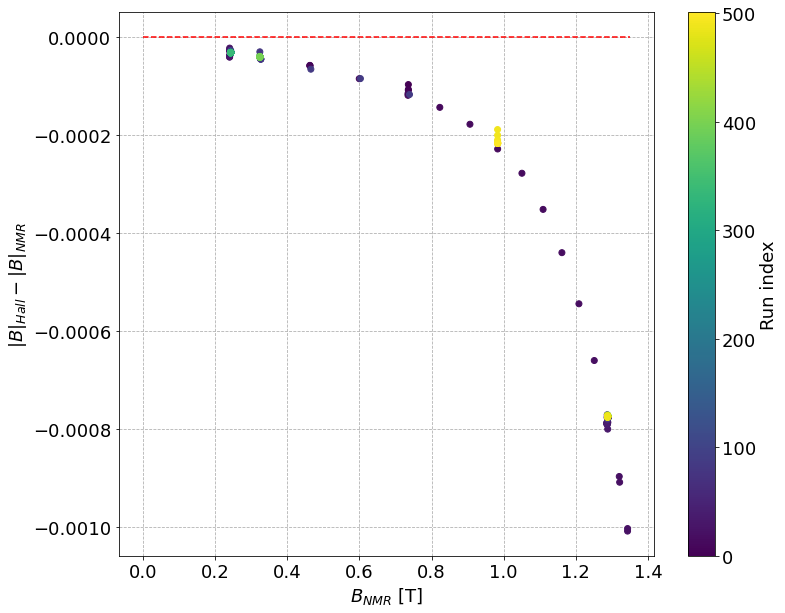

In [1473]:
# B_Hall - B_NMR vs. B_NMR
fig, ax = plt.subplots(figsize=(12, 10))
Bs = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
#     print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
    ##Bs.append(df_.sf)
    #Bs.append(df_['NMR [T]'])
    #Brs.append(df_.sf / df_['NMR [T]'])
    Bs.append(df_['B_corr'])
    Brs.append(df_.sf_corr - df_.B_corr) #/ df_['B_corr'])
    
sc = ax.scatter(Bs, Brs, c=rs) #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index')

ax.plot([0., 1.35],[0., 0.], 'r--')

# ax.set_ylim([0.99875, 1.0000])

#ax.set_xlabel('B_{Hall} [T]')
ax.set_xlabel(r'$B_{NMR}$ [T]')
ax.set_ylabel(r'$|B|_{Hall} - |B|_{NMR}$');
# ax.legend();

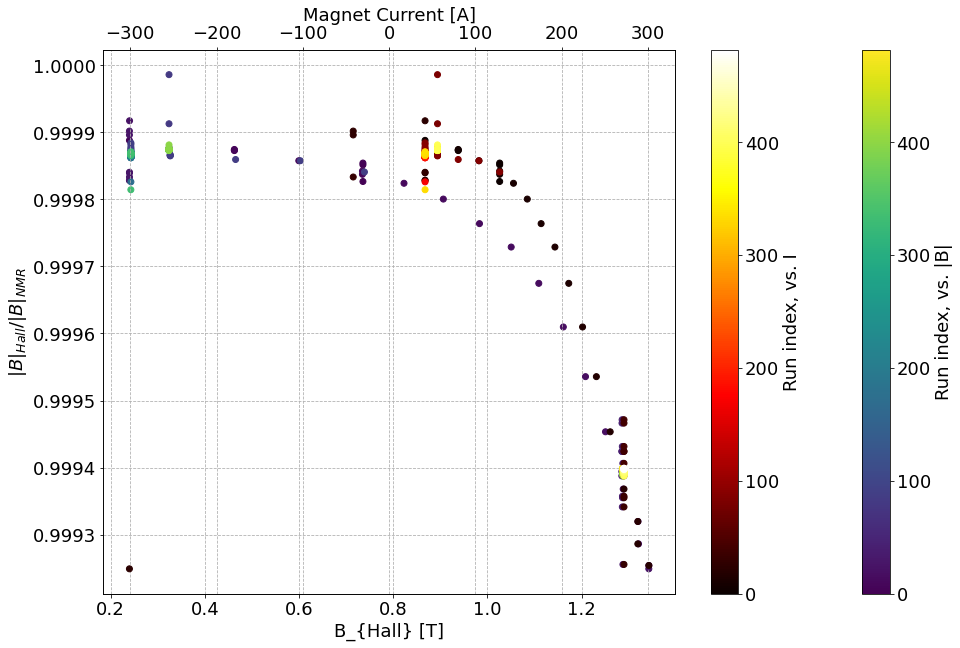

In [1114]:
# Ratio vs. B & I
fig, ax = plt.subplots(figsize=(16, 10))
Bs = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
#     print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
    Bs.append(df_.sf)
    Brs.append(df_.sf / df_['NMR [T]'])
    
sc = ax.scatter(Bs, Brs, c=rs) #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index, vs. |B|')

ax2 = ax.twiny()
Is = []
Brs = []
rs = df.run.unique()
for run in df.run.unique():
#     df_ = df.query(f'run == {run}').copy().iloc[0]
    df_ = df[np.isclose(df.magnet_X_mm.values, 12.5, atol=1e-1, rtol=1e-3) & (df.run == run)].copy().iloc[0]
    #print(f'{run}: X={df_.magnet_X_mm:0.2f}, Y={df_.magnet_Y_mm:0.2f}, Z={df_.magnet_Z_mm:0.2f}') #, found point? {len(df_)==23}')
    Is.append(df_["Magnet Current [A]"].mean())
    Brs.append(df_.sf / df_['NMR [T]'])
    
sc = ax2.scatter(Is, Brs, c=rs, cmap='hot') #label=f'run {run}, I={df_["Magnet Current [V]"].mean():0.1f} A')
cb = fig.colorbar(sc, label='Run index, vs. I')

# ax.set_ylim([0.9992, 1.0000])

ax2.set_xlabel('Magnet Current [A]')
# ax.set_ylabel(r'$|B|_{Hall} / |B|_{NMR}$');

# ax.set_ylim([0.99875, 1.0000])

ax.set_xlabel('B_{Hall} [T]')
ax.set_ylabel(r'$|B|_{Hall} / |B|_{NMR}$');
# ax.legend();

In [ ]:
# i = 11
# Brs_low = np.array(Brs[:i])
# Is_low = np.abs(np.array(Is[:i]))

Brs_low = np.array(Brs)
Is_low = np.abs(np.array(Is))

In [ ]:
# try fitting ratios for low currents -- linear model
def lin_mod(I, **params):
    return params['c0'] + params['c1']*I

In [ ]:
model = lm.Model(lin_mod, independent_vars=['I'])
params = lm.Parameters()
params.add('c0', value=1., vary=True)
params.add('c1', value=0., vary=True)
result = model.fit(Brs_low, I=Is_low, params=params, weights=1/(5e-6 * np.ones_like(Brs_low)))

In [ ]:
result

In [ ]:
2e2 * -4e-7

In [ ]:
result.plot()

# Old (to go through)
- Temperature correction

# 3D Scan (temperature)

In [ ]:
# tempcol = 'Yoke (center magnet)'
tempcol = 'Yoke (near pole)'

In [ ]:
# final 3d scan
slowfile = ddir+'2021-06-18 102833.txt'
tempfile = ddir+'2021-06-18 102833slow.txt'

# first 3d scan (better grid)
# note Zaber labels messed up for tempfile but not slowfile
# slowfile = ddir+'2021-06-16 114150.txt'
# tempfile = ddir+'2021-06-16 114146slow.txt'

# first 3d scan at 192 (worse grid)
# note Zaber labels messed up for tempfile but not slowfile
# slowfile = ddir+'2021-06-15 145245.txt'
# tempfile = ddir+'2021-06-15 145241slow.txt'

In [ ]:
df1d_192.head()

In [ ]:
df = load_data(slowfile)
df_temp = load_data(tempfile)

In [ ]:
df_temp

In [ ]:
df

In [ ]:
df_temp

In [ ]:
# same time deltas
df_temp['seconds_delta'] = (df_temp.index - df.index[0]).total_seconds()
df_temp['hours_delta'] = (df_temp.index - df.index[0]).total_seconds()/60**2
df_temp['days_delta'] = (df_temp.index - df.index[0]).total_seconds()/(24*60**2)

In [ ]:
len(df)

In [ ]:
len(df_temp)

In [ ]:
# final 3d scan
df_temp = df_temp.query('Datetime < "2021-06-19 16:17:00"')
# first 3d scan (better grid)
# useless
# df_temp = df_temp.query('Datetime < "2021-06-19 16:17:00"')

In [ ]:
len(df_temp)

In [ ]:
fig, ax = plt.subplots()

ax.plot(df_temp.index, df_temp['Yoke (center magnet)'])

In [ ]:
fig, ax = plt.subplots()

datetime_plt(ax, df_temp.index, df_temp['Yoke (center magnet)'], s=5, label=None, nmaj=8)
datetime_plt(ax, df_temp.index, df_temp['Yoke (near pole)'], s=5, label=None, nmaj=8)

In [ ]:
fig, ax = plt.subplots()

datetime_plt(ax, df_temp.index, df_temp[tempcol], s=5, label=None, nmaj=8)

In [ ]:
fig, ax = plt.subplots()

datetime_plt(ax, df_temp.index, df_temp['magnet_X_mm'], s=5, label=None, nmaj=8)
datetime_plt(ax, df.index, df['magnet_X_mm'], s=5, label=None, nmaj=8)

In [ ]:
t_interp = interp1d(df_temp.seconds_delta, df_temp[tempcol], kind='linear', fill_value="extrapolate")
df.loc[:, tempcol] = t_interp(df.seconds_delta)

In [ ]:
df_temp.seconds_delta

In [ ]:
t_interp([20000, 20001])

In [ ]:
df.loc[:, tempcol] = t_interp(df.seconds_delta)

In [ ]:
df

In [ ]:
fig, ax = plt.subplots()

datetime_plt(ax, df.index, df[tempcol], s=1, label=None, nmaj=8)
datetime_plt(ax, df_temp.index, df_temp[tempcol], s=5, label=None, nmaj=8)


In [ ]:
df['Magnet Current [V]'].describe()

In [ ]:
fig, ax = plt.subplots()

datetime_plt(ax, df.index, df['Magnet Current [V]'], s=1, label=None, nmaj=8)

In [ ]:
ls /home/ckampa/data/hallprobecalib_extras/datafiles/magnet_ramp/2021-02-24/

In [ ]:
df_fits = pd.read_pickle('/home/ckampa/data/hallprobecalib_extras/datafiles/magnet_ramp/2021-02-24/ramp_2021-02-24.run-info_temp_params.pkl')

In [ ]:
df_fits = df_fits.query('I > 100').copy()

In [ ]:
df_fits

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_fits.I, df_fits.B_NMR)

In [ ]:
def lin_mod(x, **params):
    return params['c0'] + params['c1'] * x

In [ ]:
model = lm.Model(lin_mod, independent_vars=['x'])
params = lm.Parameters()
params.add('c0', vary=True, value=0)
params.add('c1', vary=True, value=0)
result = model.fit(df_fits.B_NMR.values, x=df_fits.I.values, params=params)

In [ ]:
result

In [ ]:
temp_coeff = lin_mod(df['Magnet Current [V]'].mean(), **result.params) # T / deg C

In [ ]:
temp_coeff

In [ ]:
#t0 = df[tempcol].mean()
t0 = 25.6 # match 1d dataset

In [ ]:
t0

In [ ]:
df[tempcol].min(), df[tempcol].max()

In [ ]:
dB_vals = temp_coeff * (df[tempcol] - t0)

In [ ]:
dB_vals.describe()

In [ ]:
df[tempcol]

In [ ]:
dB_vals

In [ ]:
df.loc[:, 'B_corr'] = df['NMR [T]'].values + dB_vals

In [ ]:
df.magnet_Y_mm.unique(), df.magnet_Z_mm.unique()

In [ ]:
# good grid
df_ = df.query('(magnet_Y_mm == 124.6) & (magnet_Z_mm == 124.5)').copy()
# worse grid
# df_ = df.query('(magnet_Y_mm == 125.6) & (magnet_Z_mm == 125.5)').copy()

In [ ]:
len(df_)

In [ ]:
df_ = df_.query('(magnet_X_mm > 11.9)').copy()

In [ ]:
len(df_)

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_.sf, label=f'run {run}')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]'], label=f'raw data')
ax.scatter(df_['magnet_X_mm'], df_['B_corr'], label=f'temperature corrected data')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B| / |B|_{center}$ [T]')
ax.set_ylabel(r'$|B|$ [T]')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_.sf, label=f'run {run}')
ax.scatter(df_['magnet_X_mm'], df_[tempcol])#, label=f'raw data')
# ax.scatter(df_['magnet_X_mm'], df_['B_corr'], label=f'temperature corrected data')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B| / |B|_{center}$ [T]')
ax.set_ylabel('Yoke (near pole) [deg C]')
ax.legend();

In [ ]:
# include 1d
fig, ax = plt.subplots()

# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_.sf, label=f'run {run}')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]'], label=f'raw data')
ax.scatter(df_['magnet_X_mm'], df_['B_corr'], label=f'temperature corrected data')
ax.scatter(df1d_192['magnet_X_mm'], df1d_192['NMR [T]'], label=f'1d (no correction)')

ax.set_xlabel('X [mm]')
# ax.set_ylabel(r'$|B| / |B|_{center}$ [T]')
ax.set_ylabel(r'$|B|$ [T]')
ax.legend();

In [ ]:
df_.magnet_X_mm.unique()

In [ ]:
df1d_192.magnet_X_mm.unique()

In [ ]:
sf_3d_raw = df_.query('magnet_X_mm == 34.7265625').iloc[0]['NMR [T]']
sf_3d = df_.query('magnet_X_mm == 34.7265625').iloc[0]['B_corr']
sf_1d = df1d_192.query('magnet_X_mm == 34.7265625').iloc[0]['NMR [T]']

In [ ]:
sf_3d_raw, sf_3d, sf_1d

In [ ]:
# scale to Hall probe point

In [ ]:
# include 1d
fig, ax = plt.subplots()

# ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/df_.sf, label=f'run {run}')
ax.scatter(df_['magnet_X_mm'], df_['NMR [T]']/sf_3d_raw, label=f'raw data')
ax.scatter(df_['magnet_X_mm'], df_['B_corr']/sf_3d, label=f'temperature corrected data')
ax.scatter(df1d_192['magnet_X_mm'], df1d_192['NMR [T]']/sf_1d, label=f'1d (no correction)')

ax.set_xlabel('X [mm]')
ax.set_ylabel(r'$|B| / |B|_{center}$')
# ax.set_ylabel(r'$|B|$ [T]')
ax.legend();